# Practical Application III: Comparing Classifiers

**Overview**: In this practical application, your goal is to compare the performance of the classifiers we encountered in this section, namely K Nearest Neighbor, Logistic Regression, Decision Trees, and Support Vector Machines.  We will utilize a dataset related to marketing bank products over the telephone.  



### Getting Started

Our dataset comes from the UCI Machine Learning repository [link](https://archive.ics.uci.edu/ml/datasets/bank+marketing).  The data is from a Portugese banking institution and is a collection of the results of multiple marketing campaigns.  We will make use of the article accompanying the dataset [here](CRISP-DM-BANK.pdf) for more information on the data and features.



### Problem 1: Understanding the Data

To gain a better understanding of the data, please read the information provided in the UCI link above, and examine the **Materials and Methods** section of the paper.  How many marketing campaigns does this data represent?

The Bank Marketing dataset from the UCI Machine Learning Repository represents data collected from multiple marketing campaigns conducted by a Portuguese banking institution. According to the Materials and Methods section of the related paper and the UCI dataset description, the data represents:

Two main marketing campaigns:

1) Direct Marketing Campaign:
Conducted between May 2008 and November 2010.
Involved phone calls to clients, with the aim of promoting a term deposit product.
This campaign is associated with the bank-additional-full.csv and bank-additional.csv files.

2 )Previous Campaigns:
Data also includes information from prior marketing campaigns (if the client was previously contacted).

Related variables include:
pdays: Number of days since the client was last contacted (if any).
previous: Number of contacts performed before this campaign.
poutcome: Outcome of the previous marketing campaign.

Key Insight:
The direct marketing campaign was the primary focus for collecting the current dataset.
The historical campaigns provide context and were used to enrich the predictive analysis of client subscription behavior.

### Problem 2: Read in the Data

Use pandas to read in the dataset `bank-additional-full.csv` and assign to a meaningful variable name.

In [594]:
!pip install shap

In [814]:
# =======================================================
# Importing Libraries
# =======================================================

# Core Libraries
import warnings
import time
import math
import shap
from datetime import datetime

# Data Manipulation
import numpy as np
import pandas as pd

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use("fivethirtyeight")  # Set a popular chart style

# Pre-processing & Feature Selection
from sklearn.preprocessing import (
    StandardScaler, OneHotEncoder, MinMaxScaler, LabelEncoder
)
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif

# Modeling
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.dummy import DummyClassifier

# Pipeline and Imbalanced Data Handling
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.under_sampling import RandomUnderSampler

# Hyperparameter Tuning and Validation
from sklearn.model_selection import (
    GridSearchCV, StratifiedKFold, cross_val_score, train_test_split
)

# Evaluation Metrics
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, ConfusionMatrixDisplay, classification_report,
    roc_auc_score, roc_curve, RocCurveDisplay, make_scorer
)

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

print("All modules loaded")

# =======================================================
# Data Loading and Duplicate Removal Example
# =======================================================

# Example: Load your dataset into a DataFrame
# df = pd.read_csv('your_dataset.csv')

# Remove duplicate rows (if any) based on all columns
# Keep the first occurrence, drop subsequent duplicates
# df.drop_duplicates(inplace=True)

# (Optional) Confirm the shape after dropping duplicates
# print("Shape after removing duplicates:", df.shape)

All modules loaded


In [596]:
df = pd.read_csv('data/bank-additional/bank-additional-full.csv', sep = ';')

In [597]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


### Problem 3: Understanding the Features


Examine the data description below, and determine if any of the features are missing values or need to be coerced to a different data type.


```
Input variables:
# bank client data:
1 - age (numeric)
2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
5 - default: has credit in default? (categorical: 'no','yes','unknown')
6 - housing: has housing loan? (categorical: 'no','yes','unknown')
7 - loan: has personal loan? (categorical: 'no','yes','unknown')
# related with the last contact of the current campaign:
8 - contact: contact communication type (categorical: 'cellular','telephone')
9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
# other attributes:
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14 - previous: number of contacts performed before this campaign and for this client (numeric)
15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
# social and economic context attributes
16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)
17 - cons.price.idx: consumer price index - monthly indicator (numeric)
18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)
19 - euribor3m: euribor 3 month rate - daily indicator (numeric)
20 - nr.employed: number of employees - quarterly indicator (numeric)

Output variable (desired target):
21 - y - has the client subscribed a term deposit? (binary: 'yes','no')
```



### Problem 4: Understanding the Task

After examining the description and data, your goal now is to clearly state the *Business Objective* of the task.  State the objective below.

Business Objective
The primary goal is to predict whether a client will subscribe to a term deposit (the target variable, y). By accurately forecasting client behavior, the bank can:
•	Optimize Campaigns: Focus resources on clients most likely to convert, thereby reducing unnecessary costs.
•	Improve Efficiency: Tailor follow-up strategies based on predictive insights, ensuring that contacts are made at the right time and with the right messaging.
•	Enhance Customer Targeting: Identify key customer segments that are more receptive to the product, allowing for more personalized marketing approaches.

Key Challenges
•	Imbalanced Classes: Typically, a relatively small fraction of clients subscribe to the term deposit. This class imbalance can affect model performance and requires special attention (e.g., through resampling or cost-sensitive techniques).
•	Multiple Contacts: Since multiple calls may be needed before a client decides, understanding the temporal dynamics and call frequency can be crucial for model improvement.
•	Data Complexity: The dataset includes a mix of demographic, social, and economic indicators, which can interact in complex ways to influence a client's decision.

Business Value
Developing a robust predictive model can help the bank:
•	Reduce Marketing Costs: By targeting only the most promising leads, the bank can minimize the cost per acquisition.
•	Increase Conversion Rates: Better targeting and timely interventions can lead to higher subscription rates.
•	Inform Strategy: Insights from the model can guide broader marketing strategies, including message personalization and optimal contact frequency.

Recommendation for This Scenario:
Given that the bank’s objective is to maximize the conversion of clients to term deposit subscribers and assuming that the cost of a phone call is relatively low compared to the potential revenue and customer lifetime value, the model should likely focus on reducing false negatives (i.e., increasing recall). This approach helps ensure that fewer potential subscribers are missed, even if it means contacting some clients who might ultimately not subscribe.


In [600]:
# Basic information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [601]:
# Summary statistics for numerical columns
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [602]:
# Replace '.' with '_' in column names
df.columns = df.columns.str.replace('.', '_')

In [603]:
# Checking for missing values
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp_var_rate      0
cons_price_idx    0
cons_conf_idx     0
euribor3m         0
nr_employed       0
y                 0
dtype: int64

In [604]:
# Drop duration column
df = df.drop(columns = ["duration"])

In [605]:
# Checking for duplicate rows
df.duplicated().sum()

1784

In [606]:
df.shape

(41188, 20)

In [607]:
# Unique values per column
df.nunique()

age                78
job                12
marital             4
education           8
default             3
housing             3
loan                3
contact             2
month              10
day_of_week         5
campaign           42
pdays              27
previous            8
poutcome            3
emp_var_rate       10
cons_price_idx     26
cons_conf_idx      26
euribor3m         316
nr_employed        11
y                   2
dtype: int64

In [608]:
# Data types per column
df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp_var_rate      float64
cons_price_idx    float64
cons_conf_idx     float64
euribor3m         float64
nr_employed       float64
y                  object
dtype: object

In [609]:
# Outlier Detection using IQR method
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
outlier_summary = {}

for col in numerical_cols:
    Q1 = np.percentile(df[col], 25)
    Q3 = np.percentile(df[col], 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    outlier_summary[col] = len(outliers)

outlier_summary

{'age': 469,
 'campaign': 2406,
 'pdays': 1515,
 'previous': 5625,
 'emp_var_rate': 0,
 'cons_price_idx': 0,
 'cons_conf_idx': 447,
 'euribor3m': 0,
 'nr_employed': 0}

In [610]:
# 'unknown' values per categorical column
unknown_summary = {
    col: ((df[col] == 'unknown').sum()) for col in df.select_dtypes(include=['object']).columns
}

unknown_summary

{'job': 330,
 'marital': 80,
 'education': 1731,
 'default': 8597,
 'housing': 990,
 'loan': 990,
 'contact': 0,
 'month': 0,
 'day_of_week': 0,
 'poutcome': 0,
 'y': 0}

In [611]:
# Correlation matrix for numeric columns
correlation_matrix = df[numerical_cols].corr()
correlation_matrix

,age,campaign,pdays,previous,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed
age,1.000000,0.004594,-0.034369,0.024365,-0.000371,0.000857,0.129372,0.010767,-0.017725
campaign,0.004594,1.000000,0.052584,-0.079141,0.150754,0.127836,-0.013733,0.135133,0.144095
pdays,-0.034369,0.052584,1.000000,-0.587514,0.271004,0.078889,-0.091342,0.296899,0.372605
previous,0.024365,-0.079141,-0.587514,1.000000,-0.420489,-0.203130,-0.050936,-0.454494,-0.501333
emp_var_rate,-0.000371,0.150754,0.271004,-0.420489,1.000000,0.775334,0.196041,0.972245,0.906970
cons_price_idx,0.000857,0.127836,0.078889,-0.203130,0.775334,1.000000,0.058986,0.688230,0.522034
cons_conf_idx,0.129372,-0.013733,-0.091342,-0.050936,0.196041,0.058986,1.000000,0.277686,0.100513
euribor3m,0.010767,0.135133,0.296899,-0.454494,0.972245,0.688230,0.277686,1.000000,0.945154
nr_employed,-0.017725,0.144095,0.372605,-0.501333,0.906970,0.522034,0.100513,0.945154,1.000000


In [612]:
# Target variable distribution
df['y'].value_counts()

y
no     36548
yes     4640
Name: count, dtype: int64

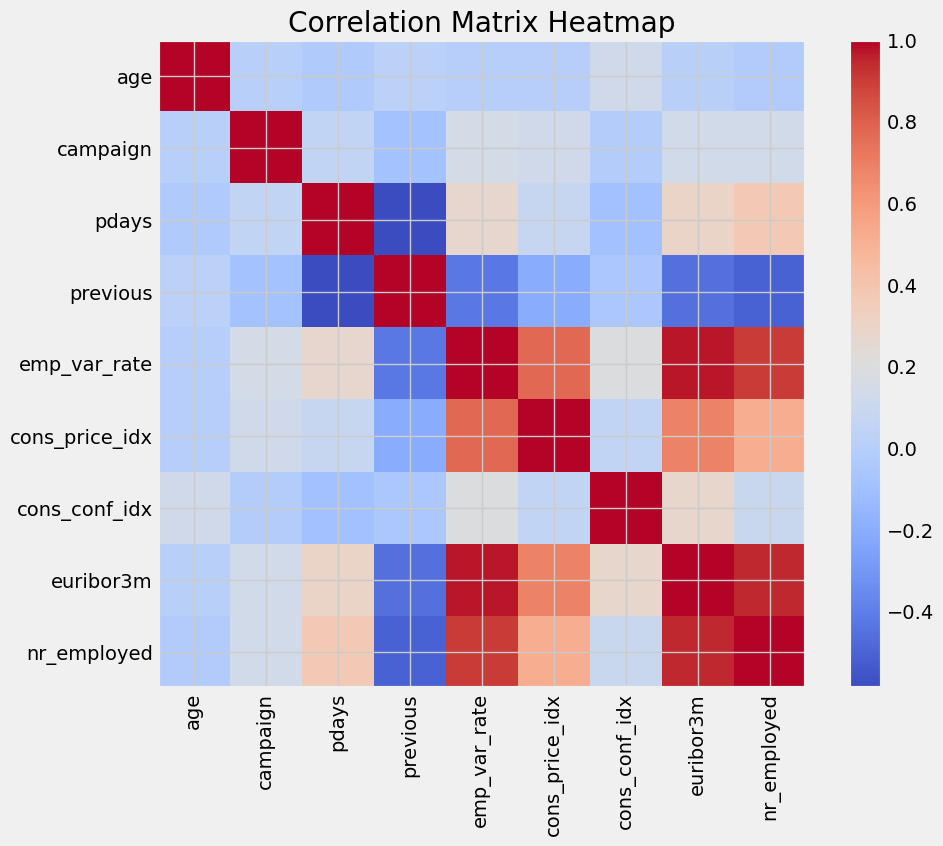

In [613]:
# Visualize correlation matrix
plt.figure(figsize=(10, 8))
plt.imshow(correlation_matrix, cmap='coolwarm', interpolation='nearest')
plt.colorbar()
plt.title("Correlation Matrix Heatmap")
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.show()

In [614]:
# Handling 'unknown' values
percent_unknown = {
    col: ((df[col] == 'unknown').sum() / len(df)) * 100
    for col in df.select_dtypes(include=['object']).columns
}

# Drop rows with 'unknown' values where % < 5, else keep as 'unknown'
for col, perc in percent_unknown.items():
    if perc < 5:
        df = df[df[col] != 'unknown']

In [615]:
df.shape

(38245, 20)

In [616]:
# Define a function to remove outliers using the IQR method for multiple columns
def remove_outliers_iqr(data, columns):
    for column in columns:
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        before_rows = data.shape[0]
        data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
        after_rows = data.shape[0]
        print(f"Number of outliers removed from '{column}': {before_rows - after_rows}")
    return data.reset_index(drop=True)

# Specify the columns from which you want to remove outliers
columns_to_clean = ['age', 'campaign', 'cons_conf_idx']

# Apply the function to remove outliers
df_cleaned = remove_outliers_iqr(df, columns_to_clean)

Number of outliers removed from 'age': 412
Number of outliers removed from 'campaign': 2208
Number of outliers removed from 'cons_conf_idx': 358


In [617]:
df_cleaned.shape

(35267, 20)

In [618]:
# Check for duplicates
df_cleaned.duplicated().sum()

1702

In [619]:
df_cleaned = df_cleaned.drop_duplicates() ##-- Dropping 1520 duplicates

### Problem 5: Engineering Features

Now that you understand your business objective, we will build a basic model to get started.  Before we can do this, we must work to encode the data.  Using just the bank information features, prepare the features and target column for modeling with appropriate encoding and transformations.

In [621]:
# 3. Feature Engineering
df_cleaned['previously_contacted'] = ((df_cleaned['pdays'] != 999) | (df_cleaned['previous'] > 0)).astype('int64')

df_cleaned['previously_contacted'].value_counts()

previously_contacted
0    28863
1     4702
Name: count, dtype: int64

In [622]:
df_cleaned['pdays_contacted'] = df_cleaned['pdays'].apply(lambda x: 0 if x == 999 else 1)
df_cleaned['pdays_contacted'].value_counts()

pdays_contacted
0    32357
1     1208
Name: count, dtype: int64

In [623]:
# Age binning
#age_bins = [17, 30, 45, 60, 100]
#age_labels = ['<30', '30-45', '45-60', '60+']
#df_processed['age_group'] = pd.cut(df_processed['age'], bins=age_bins, labels=age_labels)



In [624]:
# Campaign intensity
#df_processed['campaign_intensity'] = df_processed['campaign'] / (df_processed['previous'] + 1)



In [625]:
# Encode target variable (y)
#df_cleaned['y'] = df['y'].replace({'no': 0,  'yes': 1})
df_cleaned['y'] = df_cleaned['y'].map({'yes': 1, 'no': 0})
df_cleaned['y'].value_counts()


y
0    29773
1     3792
Name: count, dtype: int64

In [626]:
# 4. Under Sampling for Class Imbalance
#from sklearn.utils import resample

#df_majority = df_processed[df_processed['y'] == 0]
#df_minority = df_processed[df_processed['y'] == 1]

# Downsample the majority class
#df_majority_downsampled = resample(
 #   df_majority,
  #  replace=False,
   # n_samples=len(df_minority),
    #random_state=42
#)

# Combine the downsampled majority class with the minority class
#df_balanced = pd.concat([df_majority_downsampled, df_minority])

# Shuffle the dataset
#df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

In [627]:
# Unique values per column
df_cleaned.nunique()

age                      53
job                      11
marital                   3
education                 7
default                   3
housing                   2
loan                      2
contact                   2
month                    10
day_of_week               5
campaign                  6
pdays                    26
previous                  8
poutcome                  3
emp_var_rate             10
cons_price_idx           25
cons_conf_idx            25
euribor3m               305
nr_employed              11
y                         2
previously_contacted      2
pdays_contacted           2
dtype: int64

In [628]:
df_cleaned['housing'].value_counts()

housing
yes    18019
no     15546
Name: count, dtype: int64

In [629]:
df_cleaned['loan'].value_counts()

loan
no     28121
yes     5444
Name: count, dtype: int64

In [630]:
df_cleaned['contact'].value_counts()

contact
cellular     21215
telephone    12350
Name: count, dtype: int64

In [631]:
df_cleaned['month'].value_counts()

month
may    11713
jul     5535
aug     4876
jun     4331
nov     3611
apr     2248
sep      447
mar      432
oct      234
dec      138
Name: count, dtype: int64

In [632]:
df_cleaned['day_of_week'].value_counts()

day_of_week
mon    7079
thu    6910
wed    6683
tue    6581
fri    6312
Name: count, dtype: int64

In [633]:
df_cleaned['default'].value_counts()

default
no         26701
unknown     6861
yes            3
Name: count, dtype: int64

In [634]:
# Mapping yes/no to 1/0
df_cleaned['housing'] = df_cleaned['housing'].map({'yes': 1, 'no': 0})
df_cleaned['loan'] = df_cleaned['loan'].map({'yes': 1, 'no': 0})

# Mapping months to numbers
month_mapping = {'jan': 1, 'feb': 2, 'mar': 3, 'apr': 4, 'may': 5, 'jun': 6,
                 'jul': 7, 'aug': 8, 'sep': 9, 'oct': 10, 'nov': 11, 'dec': 12}
df_cleaned['month'] = df_cleaned['month'].map(month_mapping)

# Mapping days of the week to numbers (assuming 'mon' to 'sun')
day_mapping = {'mon': 1, 'tue': 2, 'wed': 3, 'thu': 4, 'fri': 5, 'sat': 6, 'sun': 7}
df_cleaned['day_of_week'] = df_cleaned['day_of_week'].map(day_mapping)

In [635]:
df_cleaned['housing'].value_counts()

housing
1    18019
0    15546
Name: count, dtype: int64

In [636]:
df_cleaned['loan'].value_counts()

loan
0    28121
1     5444
Name: count, dtype: int64

In [637]:
df_cleaned['month'].value_counts()

month
5     11713
7      5535
8      4876
6      4331
11     3611
4      2248
9       447
3       432
10      234
12      138
Name: count, dtype: int64

In [638]:
df_cleaned['day_of_week'].value_counts()

day_of_week
1    7079
4    6910
3    6683
2    6581
5    6312
Name: count, dtype: int64

In [639]:
# Check for duplicates
df_cleaned.duplicated().sum()

0

In [640]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 33565 entries, 0 to 35266
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   33565 non-null  int64  
 1   job                   33565 non-null  object 
 2   marital               33565 non-null  object 
 3   education             33565 non-null  object 
 4   default               33565 non-null  object 
 5   housing               33565 non-null  int64  
 6   loan                  33565 non-null  int64  
 7   contact               33565 non-null  object 
 8   month                 33565 non-null  int64  
 9   day_of_week           33565 non-null  int64  
 10  campaign              33565 non-null  int64  
 11  pdays                 33565 non-null  int64  
 12  previous              33565 non-null  int64  
 13  poutcome              33565 non-null  object 
 14  emp_var_rate          33565 non-null  float64
 15  cons_price_idx        33

In [641]:
# Outlier Detection using IQR method
numerical_cols = df_cleaned.select_dtypes(include=['int64', 'float64']).columns
numerical_cols
outlier_summary = {}

for col in numerical_cols:
    Q1 = np.percentile(df_cleaned[col], 25)
    Q3 = np.percentile(df_cleaned[col], 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df_cleaned[(df_cleaned[col] < lower_bound) | (df_cleaned[col] > upper_bound)]
    outlier_summary[col] = len(outliers)

outlier_summary

{'age': 48,
 'housing': 0,
 'loan': 5444,
 'month': 0,
 'day_of_week': 0,
 'campaign': 0,
 'pdays': 1208,
 'previous': 4702,
 'emp_var_rate': 0,
 'cons_price_idx': 0,
 'cons_conf_idx': 0,
 'euribor3m': 0,
 'nr_employed': 0,
 'y': 3792,
 'previously_contacted': 4702,
 'pdays_contacted': 1208}

## EDA

In [643]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 33565 entries, 0 to 35266
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   33565 non-null  int64  
 1   job                   33565 non-null  object 
 2   marital               33565 non-null  object 
 3   education             33565 non-null  object 
 4   default               33565 non-null  object 
 5   housing               33565 non-null  int64  
 6   loan                  33565 non-null  int64  
 7   contact               33565 non-null  object 
 8   month                 33565 non-null  int64  
 9   day_of_week           33565 non-null  int64  
 10  campaign              33565 non-null  int64  
 11  pdays                 33565 non-null  int64  
 12  previous              33565 non-null  int64  
 13  poutcome              33565 non-null  object 
 14  emp_var_rate          33565 non-null  float64
 15  cons_price_idx        33

In [644]:
# General Dataset Overview
numerical_cols = df_cleaned.select_dtypes(include=['int64', 'float64']).columns
numerical_cols

Index(['age', 'housing', 'loan', 'month', 'day_of_week', 'campaign', 'pdays',
       'previous', 'emp_var_rate', 'cons_price_idx', 'cons_conf_idx',
       'euribor3m', 'nr_employed', 'y', 'previously_contacted',
       'pdays_contacted'],
      dtype='object')

In [645]:
categorical_cols = df_cleaned.select_dtypes(include=['object', 'category']).columns
categorical_cols

Index(['job', 'marital', 'education', 'default', 'contact', 'poutcome'], dtype='object')

## Univariate analysis

In [647]:
# Summary statistics for numerical columns
numerical_summary = df_cleaned[numerical_cols].describe()
numerical_summary

,age,housing,loan,month,day_of_week,campaign,pdays,previous,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y,previously_contacted,pdays_contacted
count,33565.000000,33565.000000,33565.000000,33565.000000,33565.000000,33565.000000,33565.000000,33565.000000,33565.000000,33565.000000,33565.000000,33565.000000,33565.000000,33565.000000,33565.000000,33565.000000
mean,39.523462,0.536839,0.162193,6.564338,2.964100,2.087293,963.263429,0.175004,0.079050,93.575377,-40.729394,3.613994,5167.266605,0.112975,0.140086,0.035990
std,9.568053,0.498648,0.368633,2.056527,1.412988,1.298155,184.958162,0.492224,1.536623,0.570675,4.442399,1.721734,70.534529,0.316567,0.347082,0.186268
min,17.000000,0.000000,0.000000,3.000000,1.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000,0.000000,0.000000,0.000000
25%,32.000000,0.000000,0.000000,5.000000,2.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000,0.000000,0.000000,0.000000
50%,38.000000,1.000000,0.000000,6.000000,3.000000,2.000000,999.000000,0.000000,1.100000,93.444000,-41.800000,4.857000,5191.000000,0.000000,0.000000,0.000000
75%,46.000000,1.000000,0.000000,8.000000,4.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000,0.000000,0.000000,0.000000
max,69.000000,1.000000,1.000000,12.000000,5.000000,6.000000,999.000000,7.000000,1.400000,94.767000,-29.800000,5.045000,5228.100000,1.000000,1.000000,1.000000


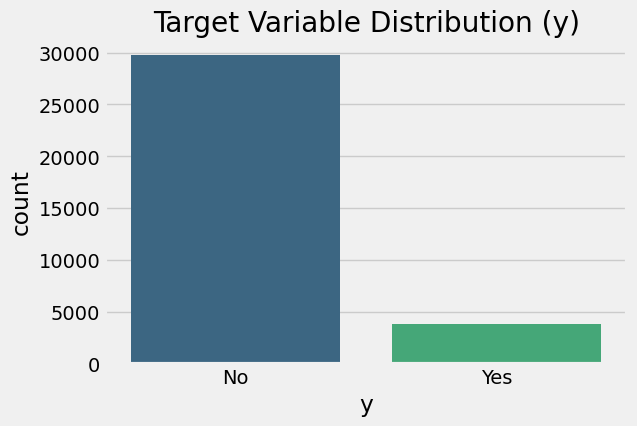

In [648]:
# Target Variable Analysis
plt.figure(figsize=(6, 4))
sns.countplot(x='y', data=df_cleaned, palette='viridis')
plt.title('Target Variable Distribution (y)')
plt.xticks(ticks=[0, 1], labels=['No', 'Yes'])
plt.show()

###  Numerical Features Analysis

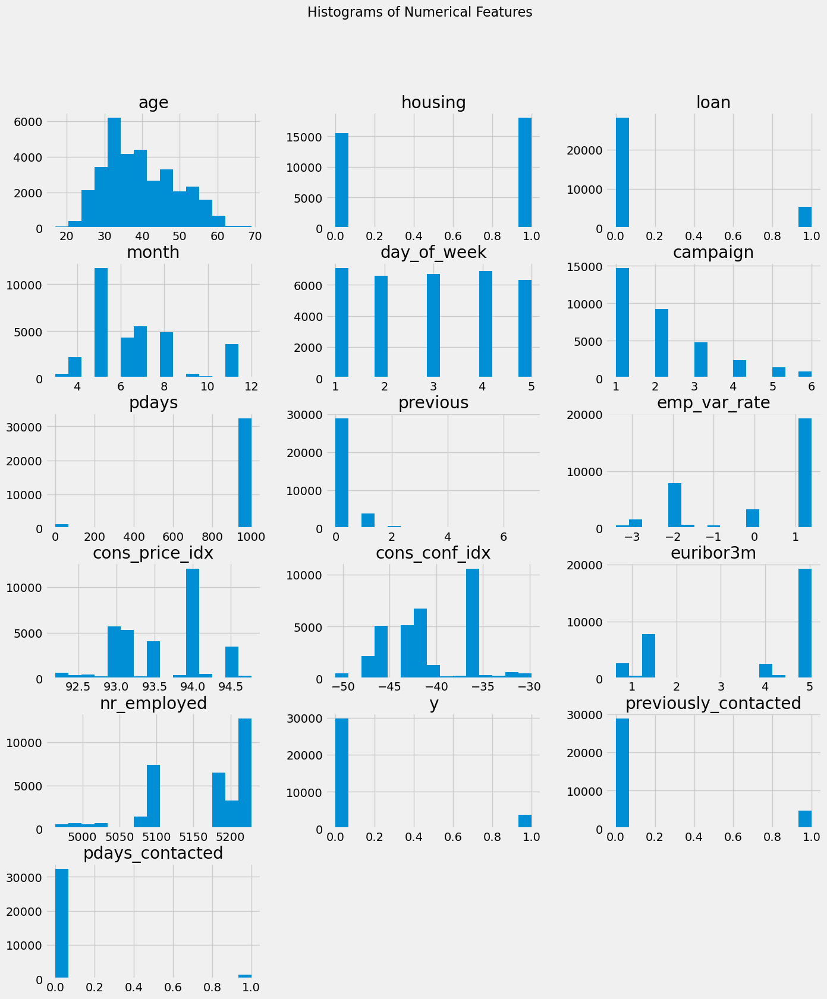

In [650]:
# Histograms
n_cols = 3  # Fixed number of columns
n_rows = math.ceil(len(numerical_cols) / n_cols)  # Dynamic number of rows


df_cleaned[numerical_cols].hist(bins=15, figsize=(15, n_rows * 3), layout=(n_rows, n_cols))
plt.suptitle('Histograms of Numerical Features', fontsize=16)
plt.show()


In [651]:
#Check for missing values
df_cleaned.isna().sum()

age                     0
job                     0
marital                 0
education               0
default                 0
housing                 0
loan                    0
contact                 0
month                   0
day_of_week             0
campaign                0
pdays                   0
previous                0
poutcome                0
emp_var_rate            0
cons_price_idx          0
cons_conf_idx           0
euribor3m               0
nr_employed             0
y                       0
previously_contacted    0
pdays_contacted         0
dtype: int64

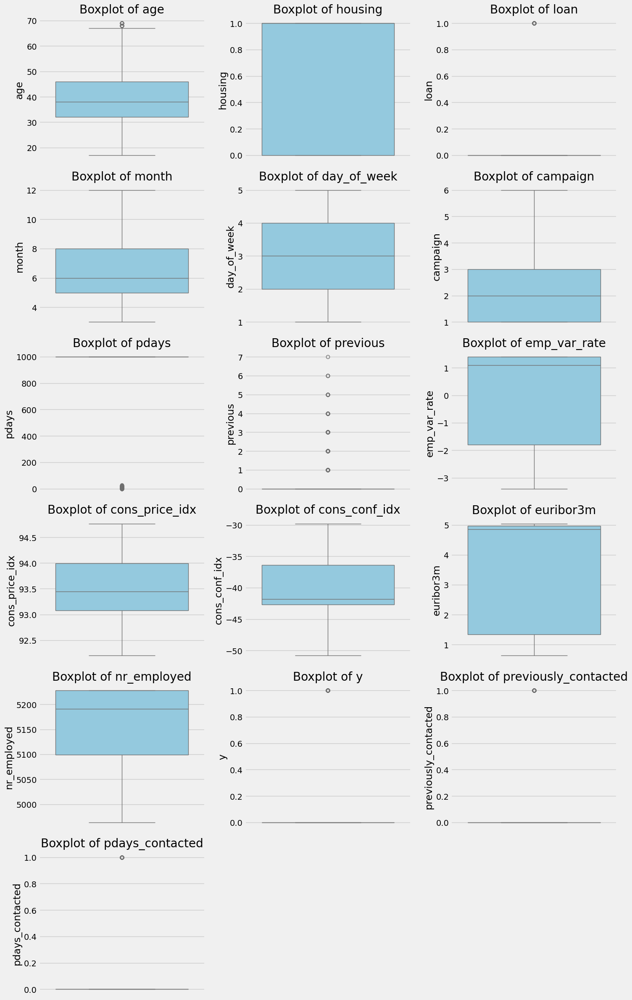

In [652]:
# Calculate number of rows and columns for the grid
n_cols = 3  # You can change this number based on preference
n_rows = int(np.ceil(len(numerical_cols) / n_cols))

# Create boxplots for each numerical feature
plt.figure(figsize=(15, n_rows * 4))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(y=df_cleaned[col], color='skyblue')
    plt.title(f'Boxplot of {col}')
    plt.xlabel('')
plt.tight_layout()
plt.show()

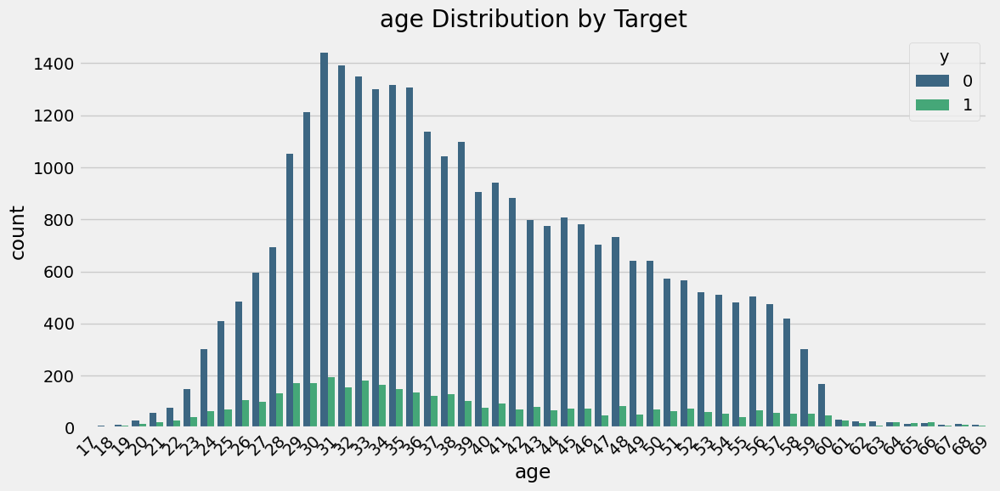

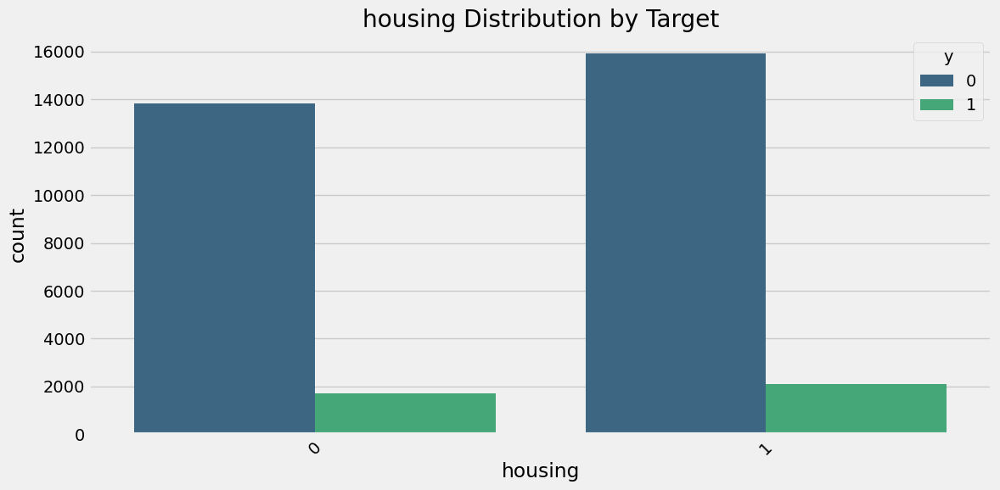

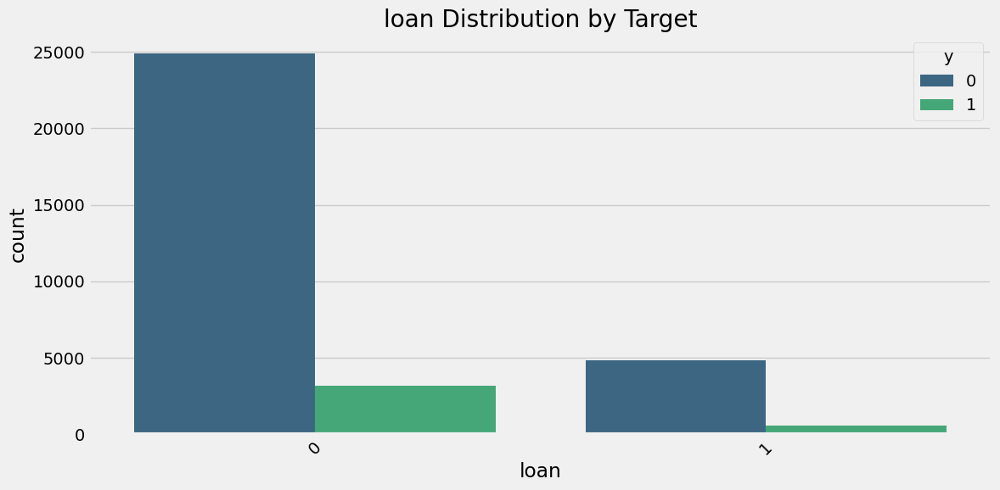

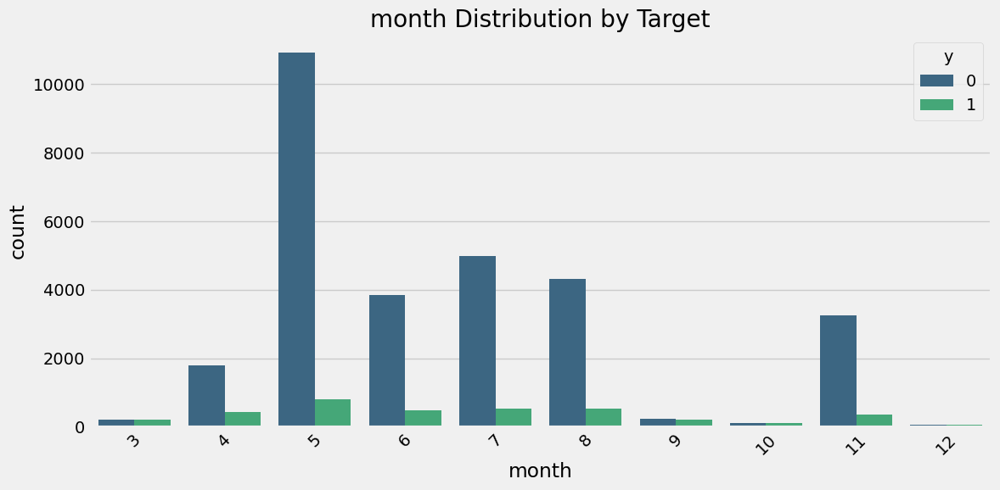

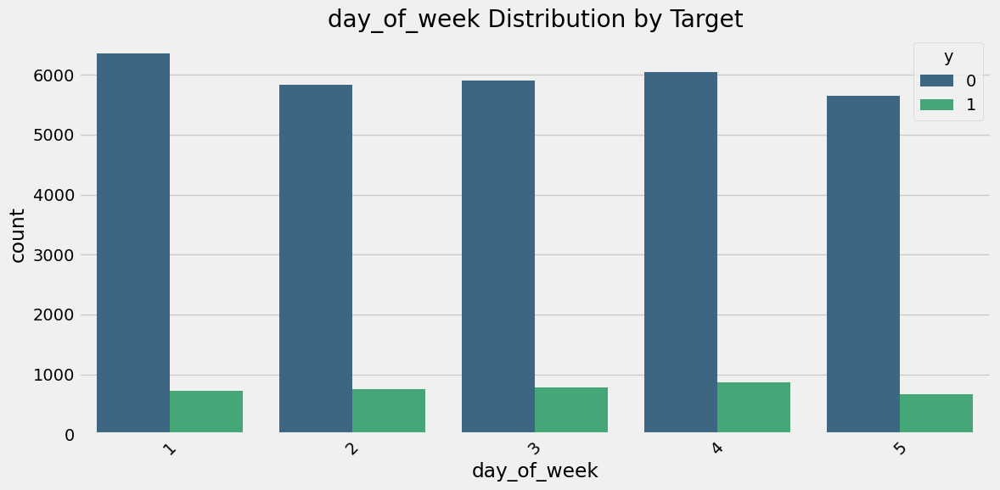

...

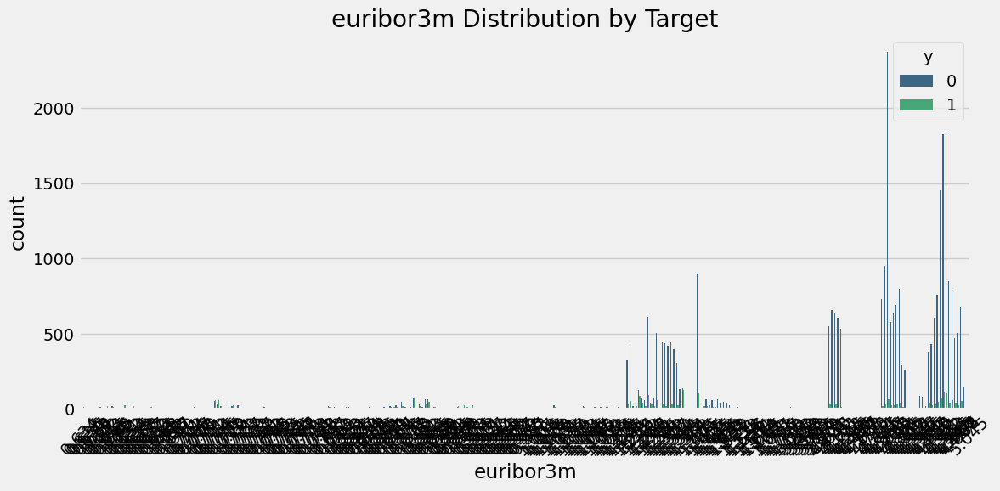

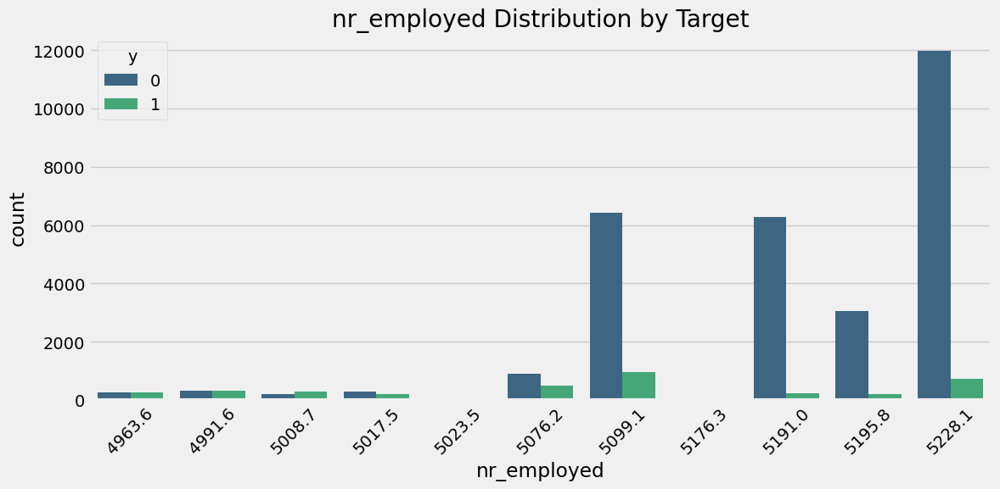

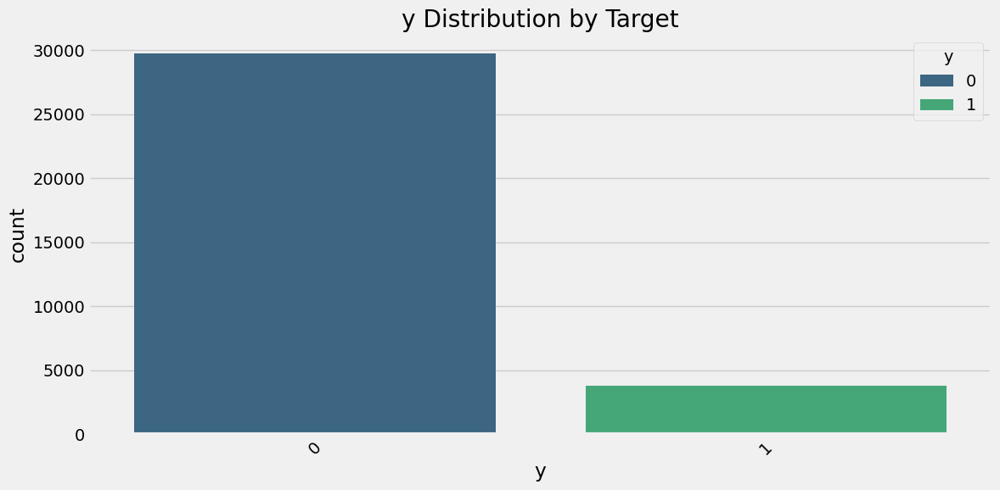

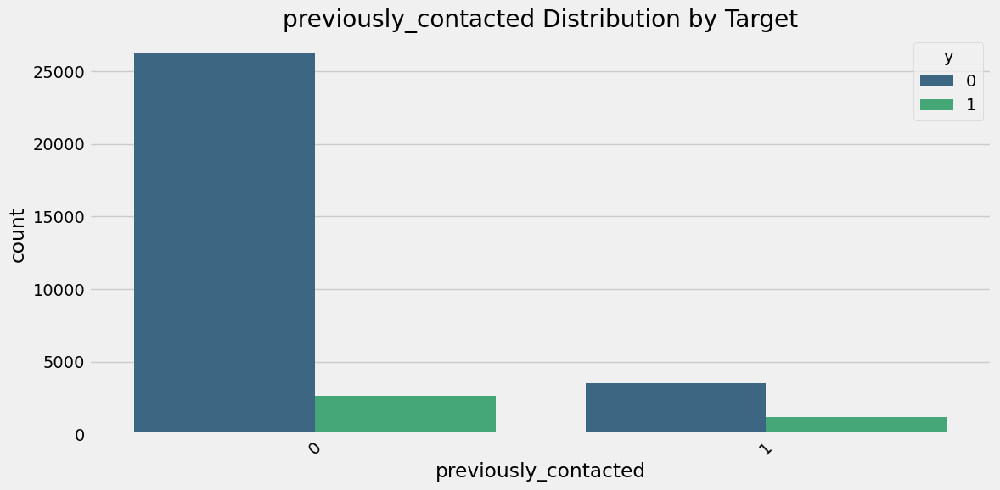

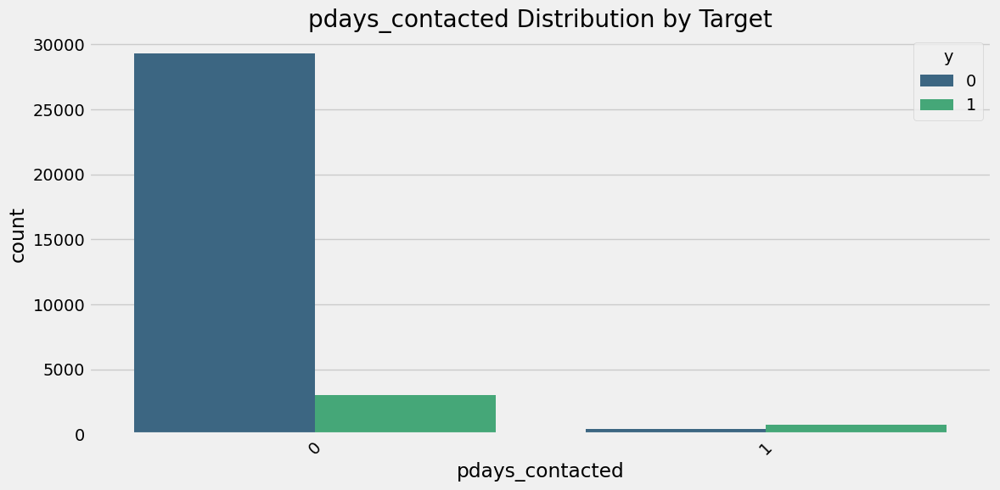

In [653]:
# Countplots
for col in numerical_cols:
    plt.figure(figsize=(12, 6))
    sns.countplot(data=df_cleaned, x=col, hue='y', palette='viridis')
    plt.title(f'{col} Distribution by Target')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()




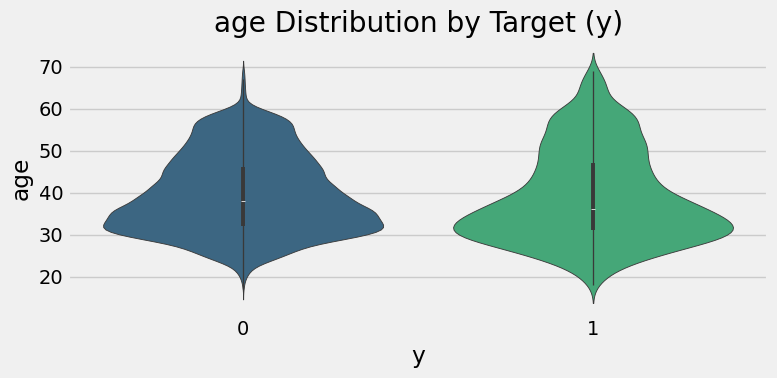

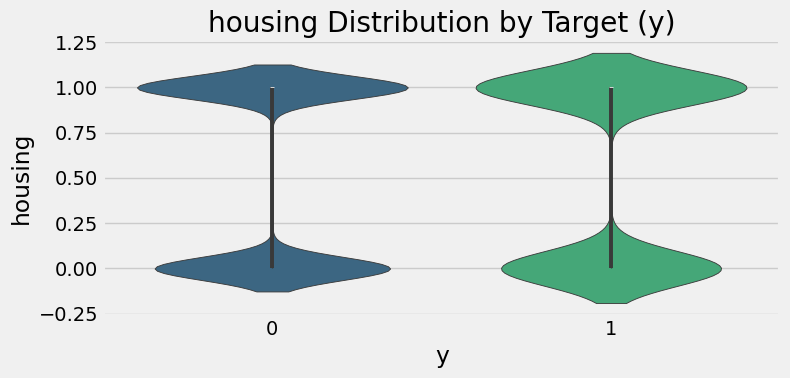

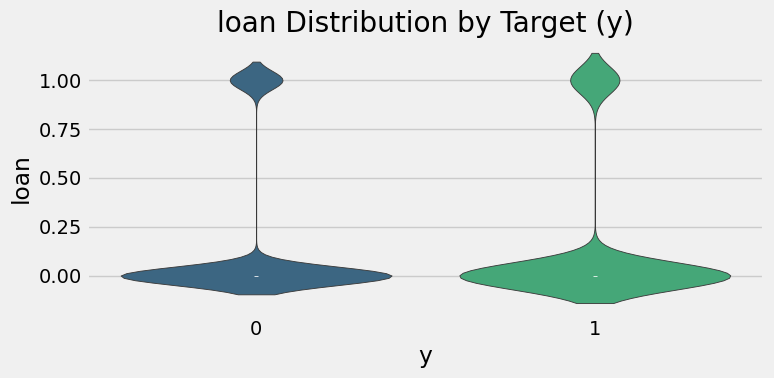

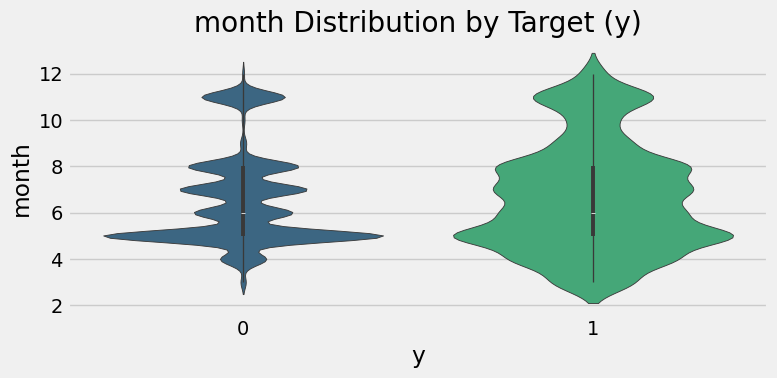

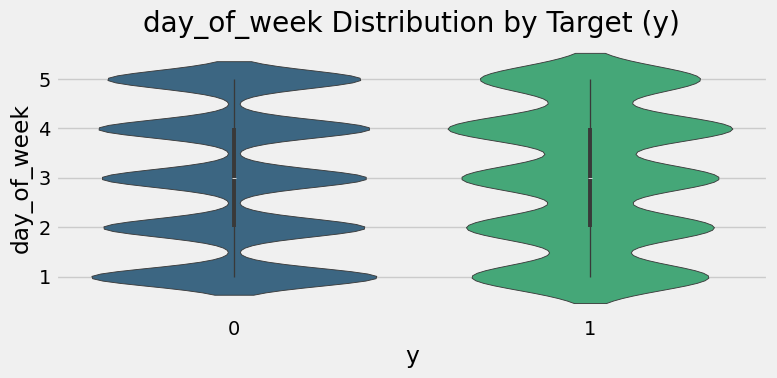

...

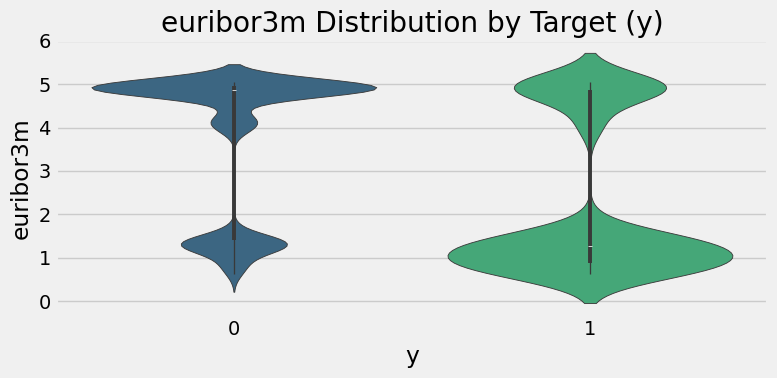

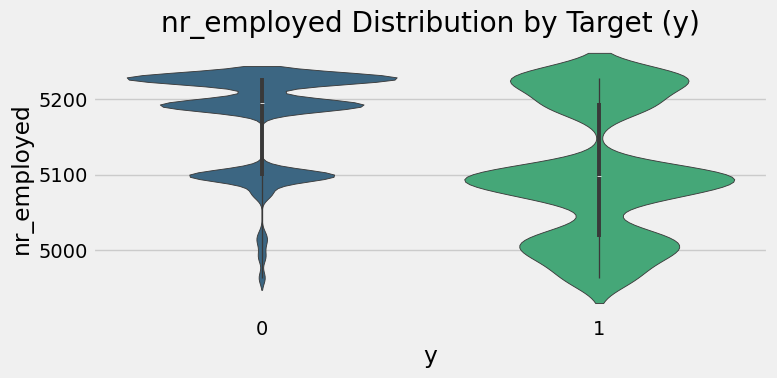

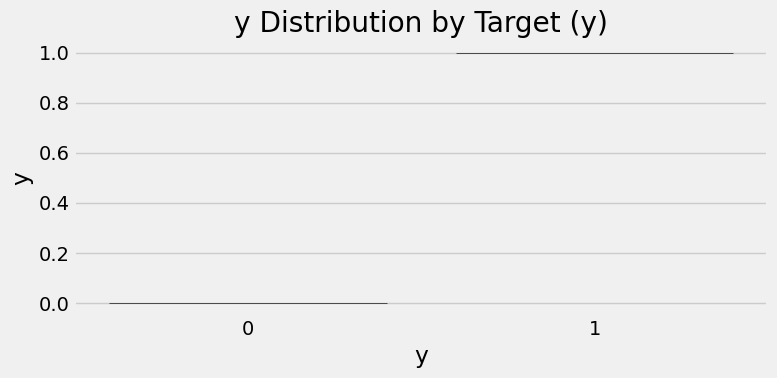

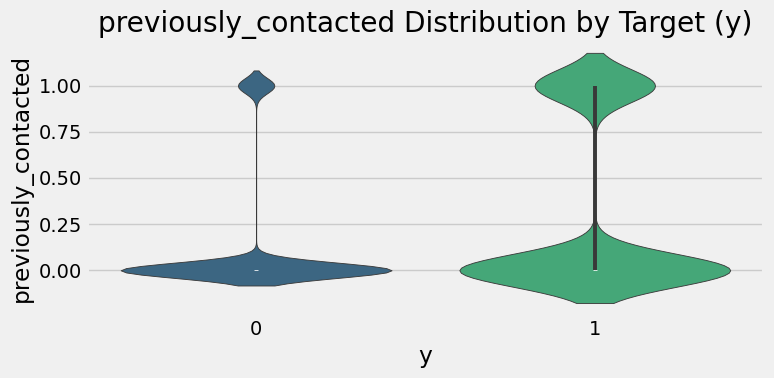

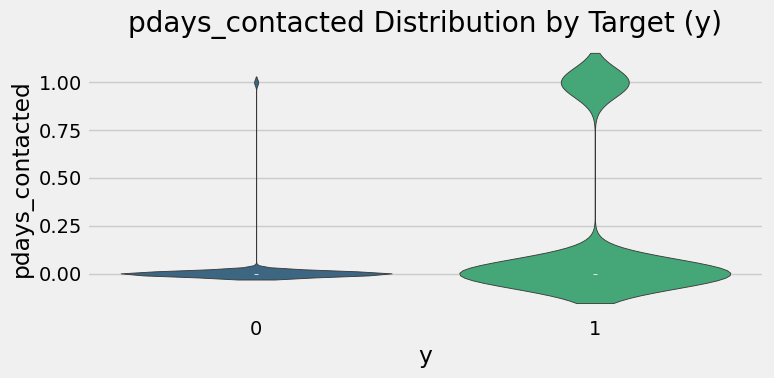

In [654]:
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.violinplot(data=df_cleaned, x='y', y=col, palette='viridis')
    plt.title(f'{col} Distribution by Target (y)')
    plt.tight_layout()
    plt.show()

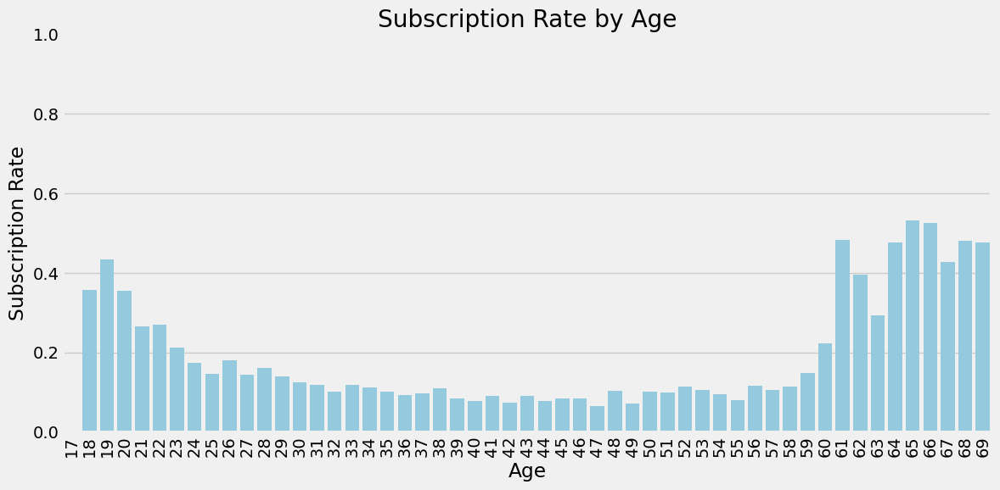

In [655]:
plt.figure(figsize=(12, 6))

sns.barplot(
    x='age',
    y='y',               # 'y' is 0 or 1, so mean(y) = subscription rate
    data=df_cleaned,
    estimator=np.mean,   # By default, barplot uses the mean, but here it's explicit
    ci=None,             # Turn off confidence intervals for a cleaner plot
    color='skyblue'
)

plt.title('Subscription Rate by Age')
plt.xlabel('Age')
plt.ylabel('Subscription Rate')
plt.ylim(0, 1)           # Subscription rate ranges from 0 to 1
plt.xticks(rotation=90)  # Rotate x-axis labels if many distinct ages
plt.tight_layout()
plt.show()

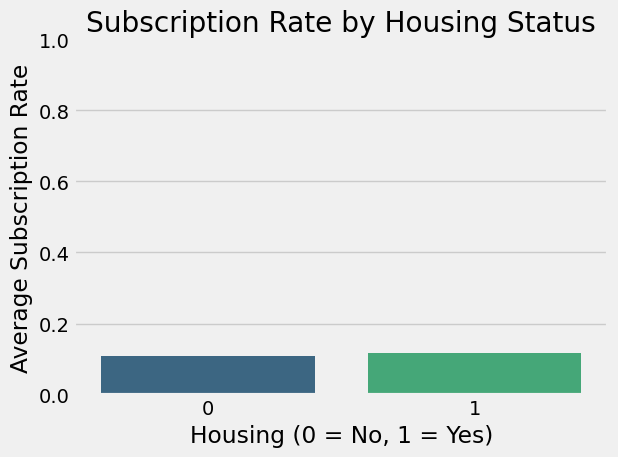

In [656]:
# Bar plot of the mean subscription rate (y) for housing=0 vs. housing=1
sns.barplot(
    x='housing',   # 0 or 1
    y='y',         # 0 or 1; the mean of y is the subscription rate
    data=df_cleaned,
    estimator=np.mean,
    ci=None,       # turn off confidence intervals for a cleaner look
    palette='viridis'
)

plt.title("Subscription Rate by Housing Status")
plt.xlabel("Housing (0 = No, 1 = Yes)")
plt.ylabel("Average Subscription Rate")
plt.ylim(0, 1)  # subscription rate ranges from 0 to 1
plt.tight_layout()
plt.show()


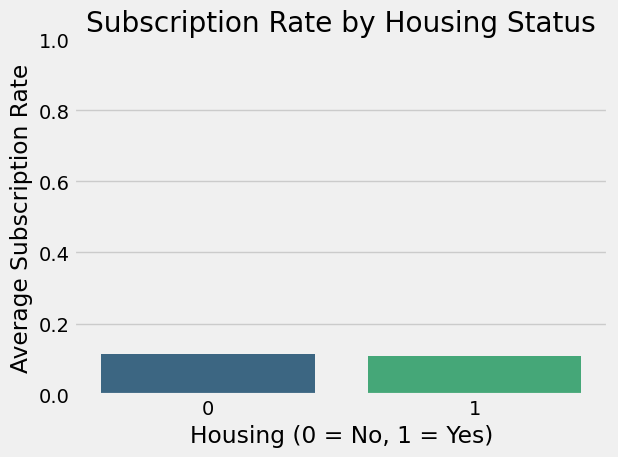

In [657]:
# Bar plot of the mean subscription rate (y) for housing=0 vs. housing=1
sns.barplot(
    x='loan',   # 0 or 1
    y='y',         # 0 or 1; the mean of y is the subscription rate
    data=df_cleaned,
    estimator=np.mean,
    ci=None,       # turn off confidence intervals for a cleaner look
    palette='viridis'
)

plt.title("Subscription Rate by Housing Status")
plt.xlabel("Housing (0 = No, 1 = Yes)")
plt.ylabel("Average Subscription Rate")
plt.ylim(0, 1)  # subscription rate ranges from 0 to 1
plt.tight_layout()
plt.show()


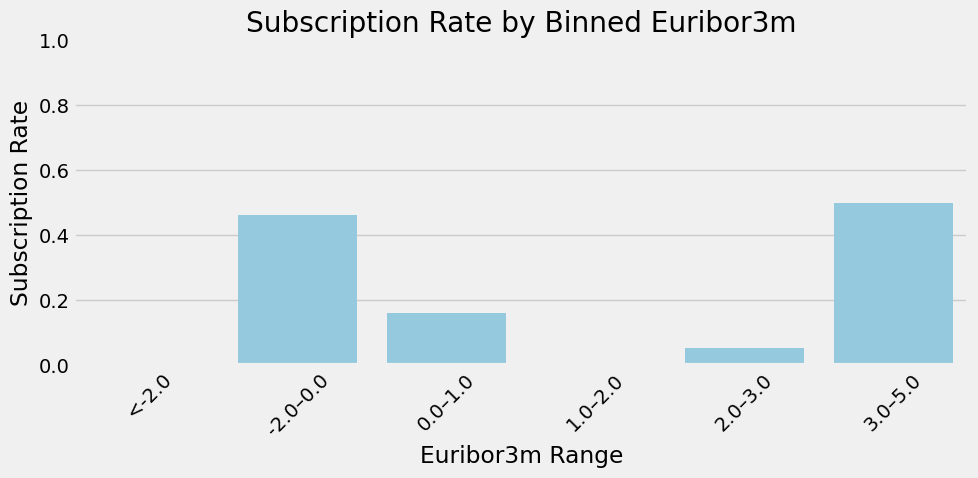

In [658]:
df_euribor3m = df_cleaned.copy()
# Adjust these edges based on your data's min/max and desired granularity
bins = [-2.0, 0.0, 1.0, 2.0, 3.0, 5.0, df_cleaned['euribor3m'].max()+0.1]
labels = ['<-2.0', '-2.0–0.0', '0.0–1.0', '1.0–2.0', '2.0–3.0', '3.0–5.0']

# 1. Create a new column with binned euribor3m ranges
df_euribor3m['euribor3m_bin'] = pd.cut(
    df_cleaned['euribor3m'],
    bins=bins,
    labels=labels,
    include_lowest=True  # ensures the lowest bin includes minimum value
)

# 2. Group by the binned column and compute the mean subscription rate (mean of y)
euribor_groups = df_euribor3m.groupby('euribor3m_bin')['y'].mean().reset_index()

# 3. Plot a bar chart of the subscription rate by euribor3m bin
plt.figure(figsize=(10, 5))
sns.barplot(x='euribor3m_bin', y='y', data=euribor_groups, color='skyblue')
plt.title('Subscription Rate by Binned Euribor3m')
plt.xlabel('Euribor3m Range')
plt.ylabel('Subscription Rate')
plt.ylim(0, 1)  # subscription rate is between 0 and 1
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

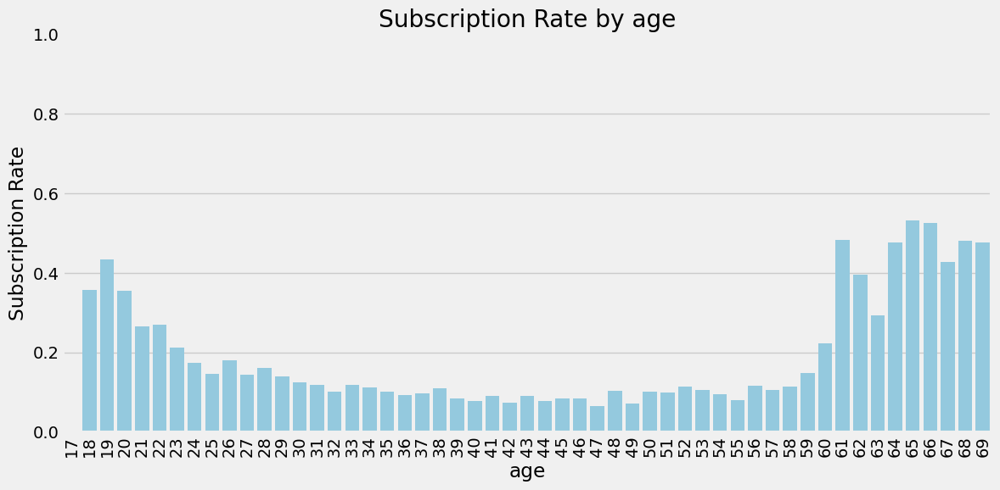

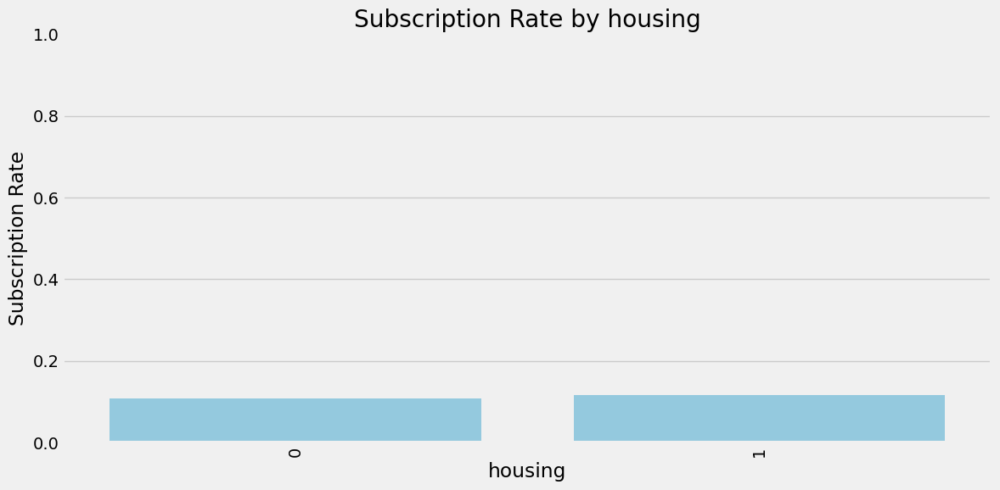

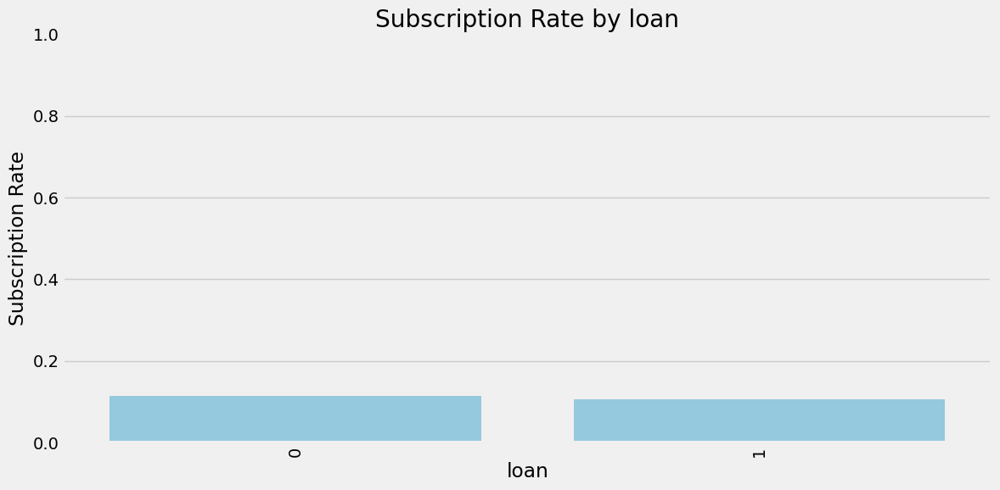

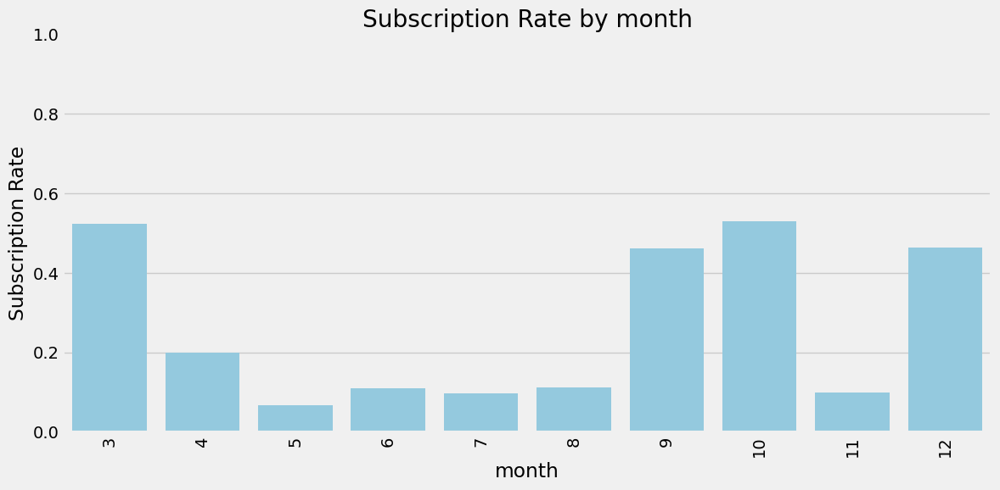

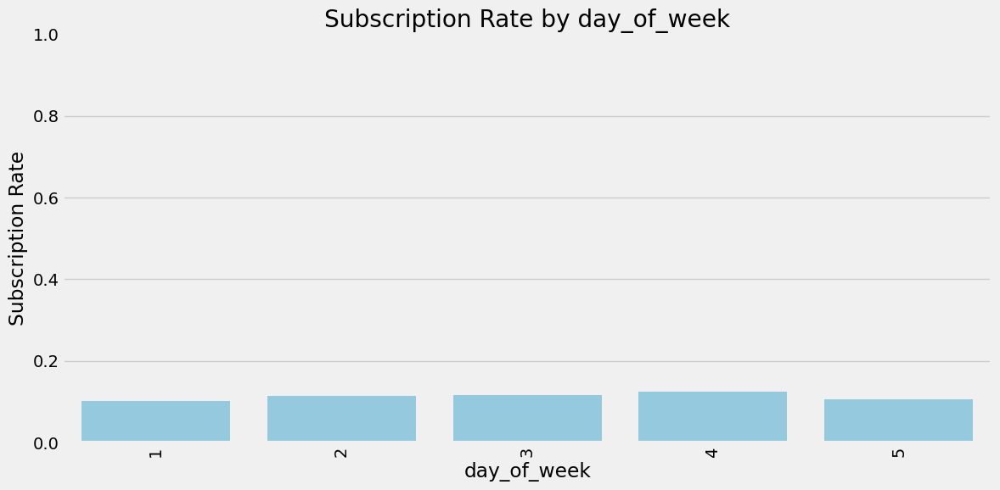

...

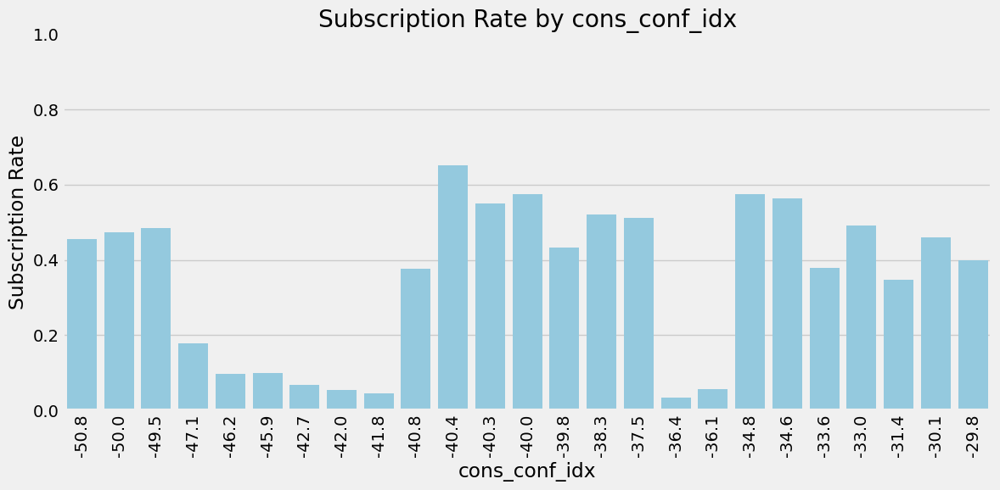

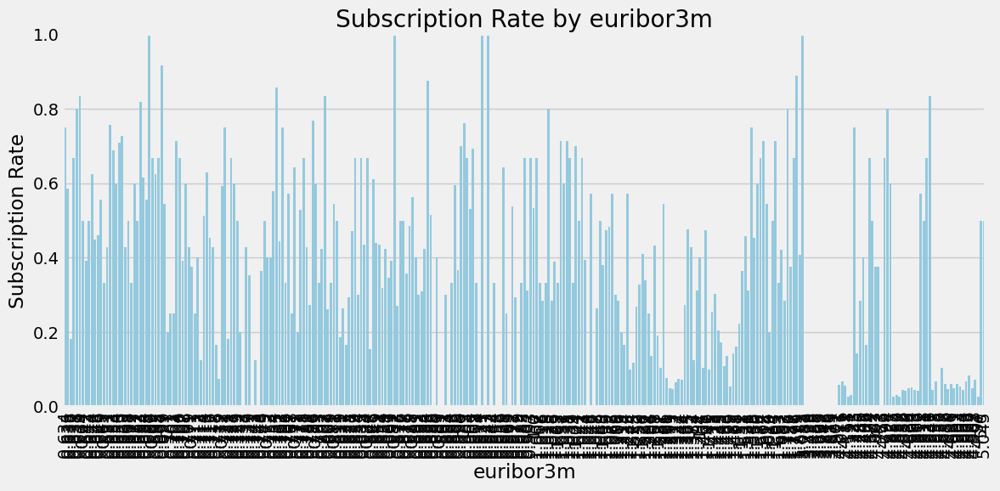

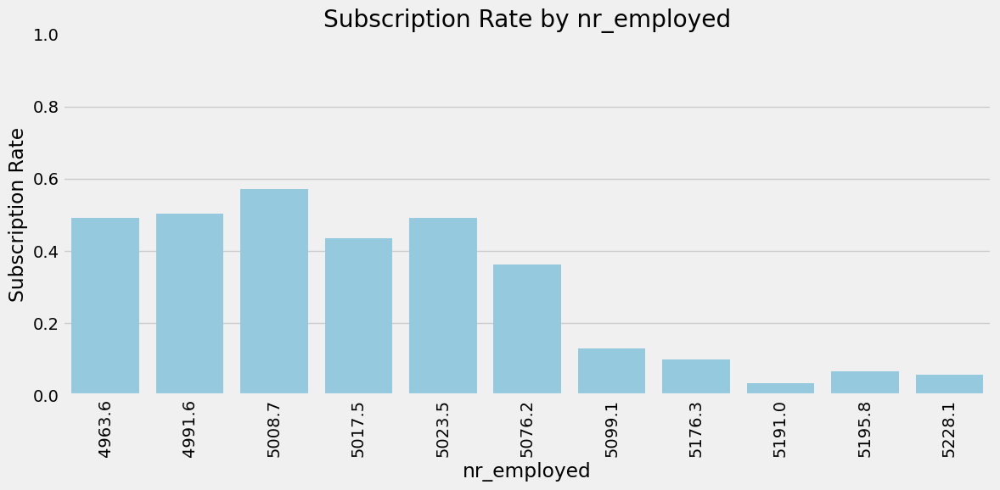

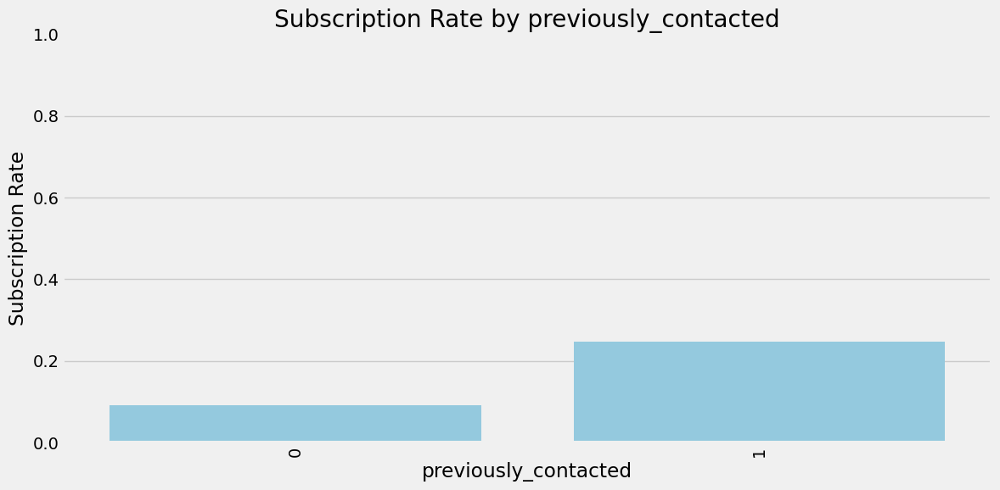

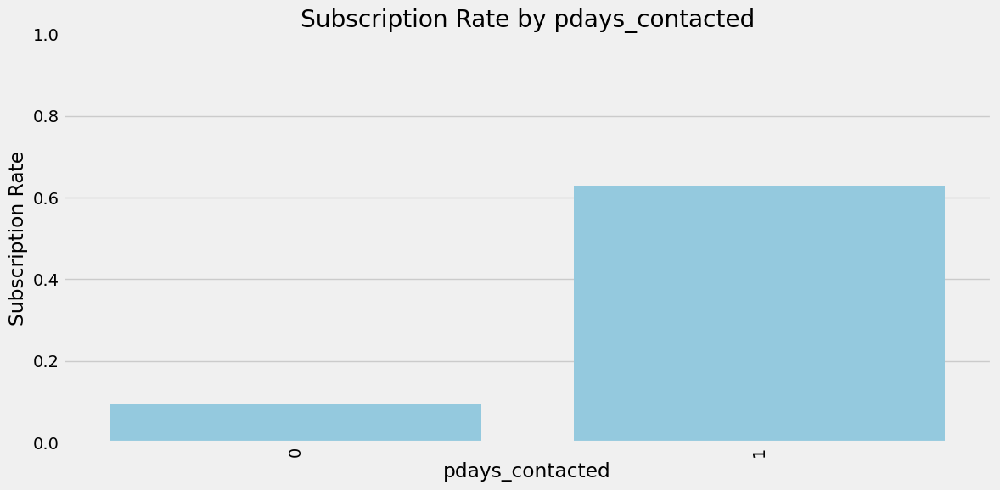

In [659]:
# Select only numeric columns (excluding 'y' if you don't want to plot it against itself)
numeric_cols = df_cleaned.select_dtypes(include=['int64', 'float64']).columns
numeric_cols = [col for col in numeric_cols if col != 'y']  # optionally remove 'y'

for col in numeric_cols:
    plt.figure(figsize=(12, 6))
    
    # Create the bar plot: mean(y) by each unique value of col
    sns.barplot(
        x=col,
        y='y',
        data=df_cleaned,
        estimator=np.mean,   # average of y => subscription rate
        ci=None,             # remove confidence intervals
        color='skyblue'
    )
    
    plt.title(f'Subscription Rate by {col}')
    plt.xlabel(col)
    plt.ylabel('Subscription Rate')
    plt.ylim(0, 1)
    plt.xticks(rotation=90)  # rotate x-axis labels for readability
    plt.tight_layout()
    plt.show()

### Categorical Features Analysis: 

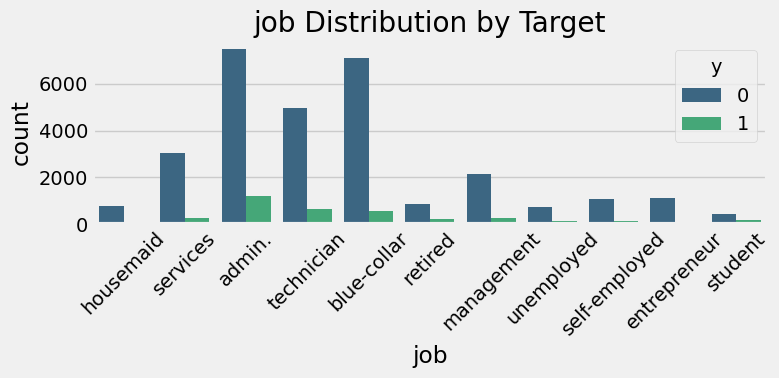

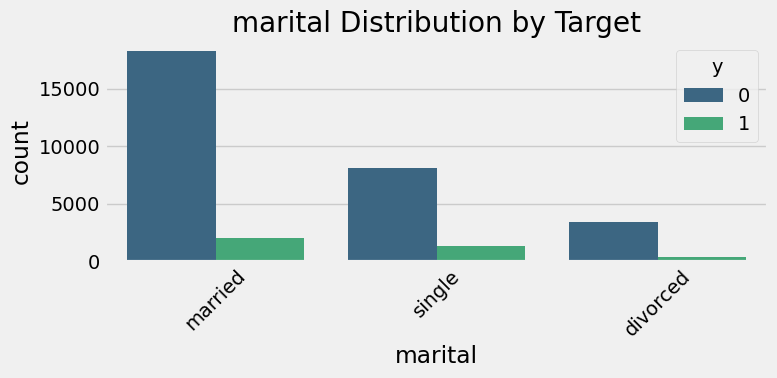

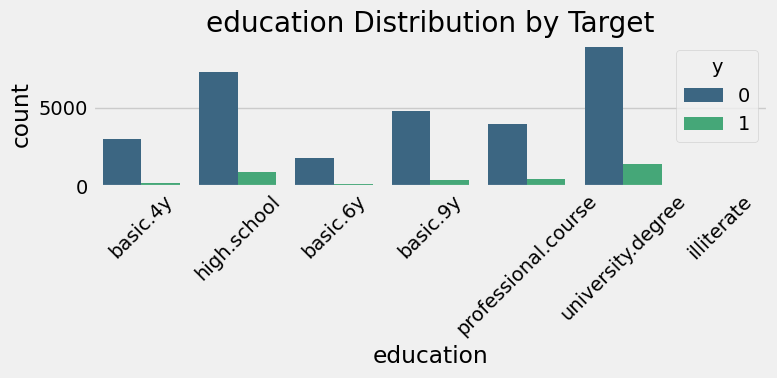

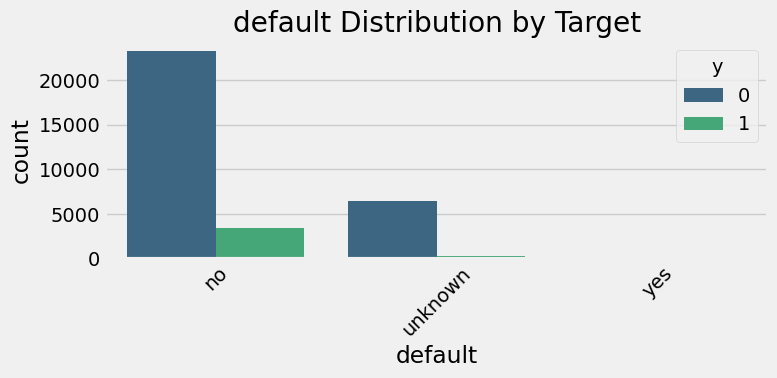

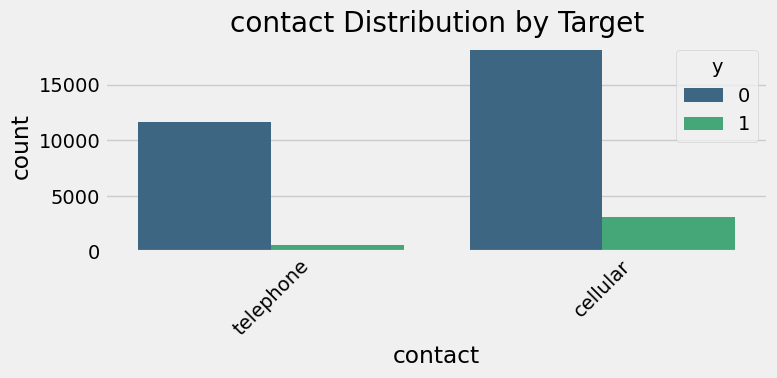

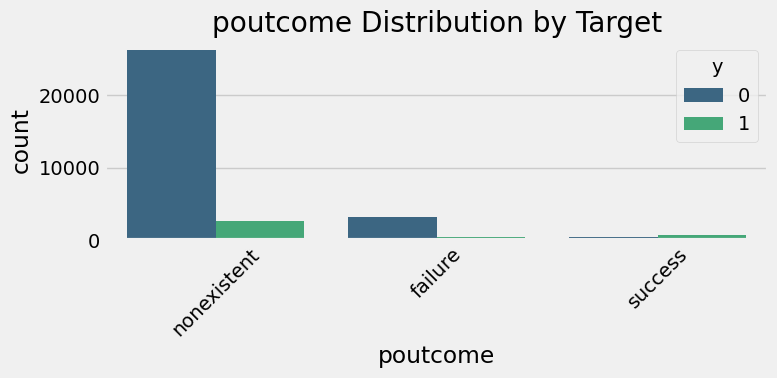

In [661]:
# Countplots
for col in categorical_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=df_cleaned, x=col, hue='y', palette='viridis')
    plt.title(f'{col} Distribution by Target')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()




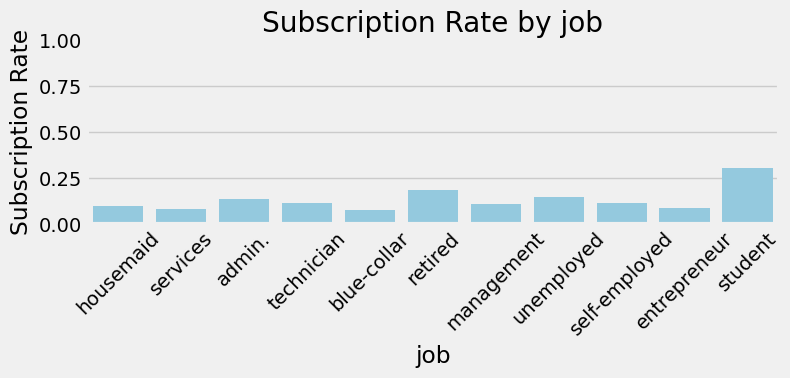

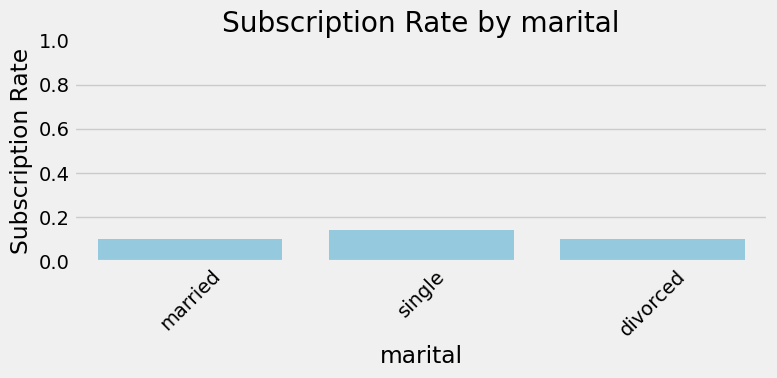

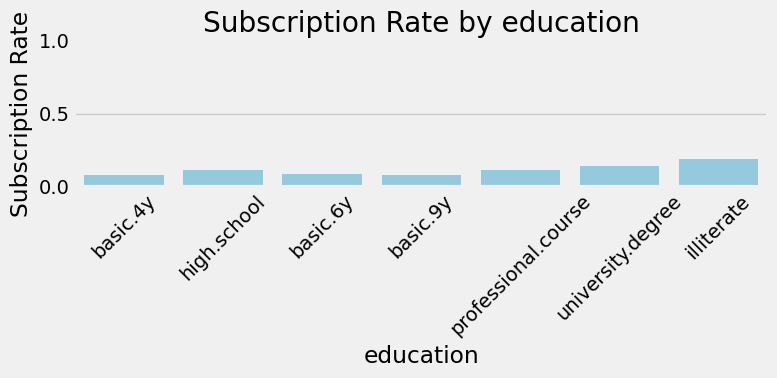

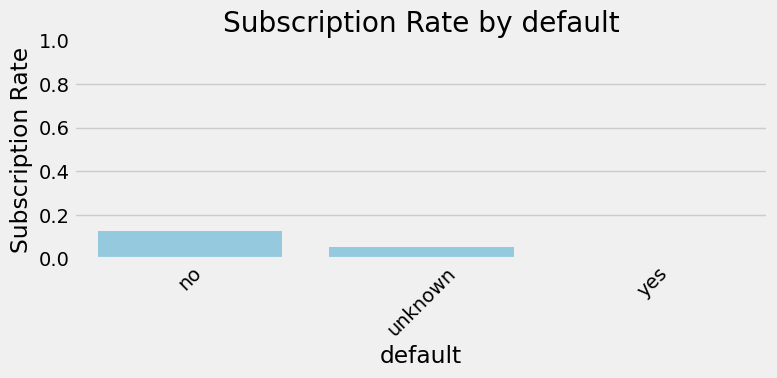

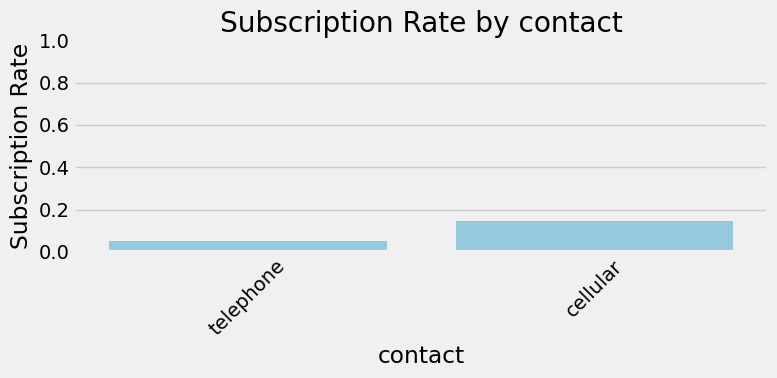

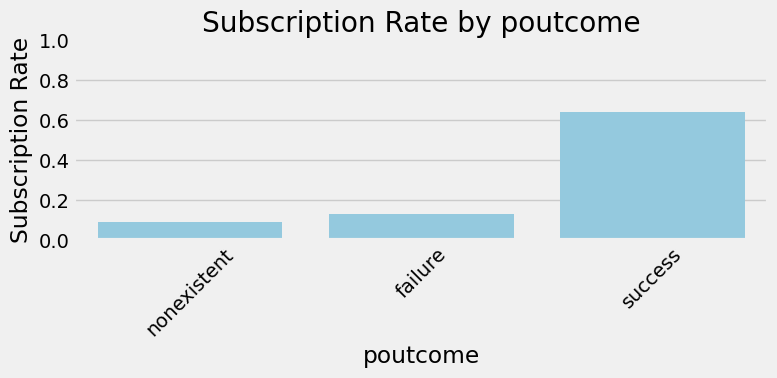

In [662]:
for col in categorical_cols:
    plt.figure(figsize=(8, 4))
    
    # Create a bar plot: mean of y for each category
    sns.barplot(
        data=df_cleaned,
        x=col,
        y='y',
        estimator=np.mean,  # average of y => subscription rate
        ci=None,            # turn off confidence intervals
        color='skyblue'
    )
    
    plt.title(f'Subscription Rate by {col}')
    plt.xlabel(col)
    plt.ylabel('Subscription Rate')
    plt.ylim(0, 1)  # subscription rate is between 0 and 1
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [663]:
# 5. Pairplot for Key Numeric Features
#key_features = ['age', 'campaign', 'cons.price.idx', 'euribor3m', 'nr.employed']
#sns.pairplot(df_cleaned[key_features + ['y']], hue='y', palette='coolwarm')
#plt.suptitle('Pairplot of Key Numeric Features', fontsize=16)
#plt.show()



## Bivariate analysis

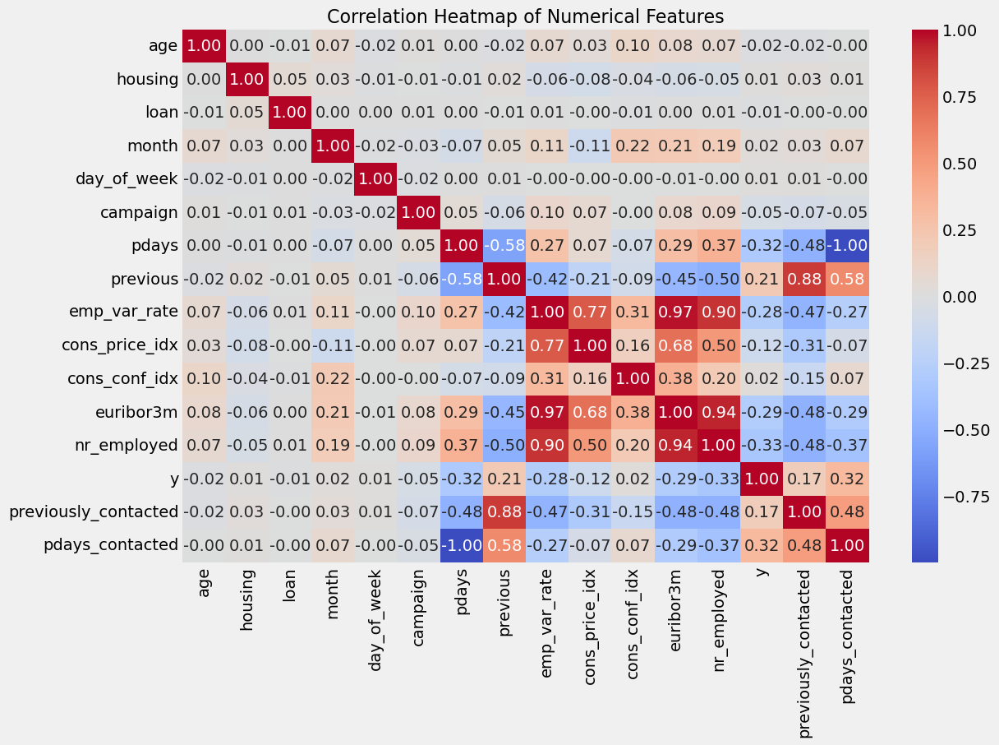

In [665]:
# Correlation Heatmap
plt.figure(figsize=(12, 8))
corr_matrix = df_cleaned[numerical_cols].corr()
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', cbar=True)
plt.title('Correlation Heatmap of Numerical Features', fontsize=16)
plt.show()

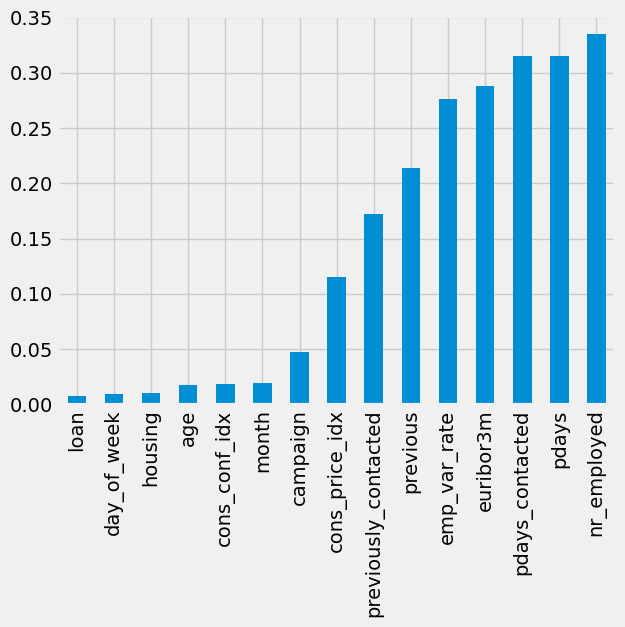

In [666]:
np.abs(corr_matrix["y"]).sort_values()[:-1].plot(kind = "bar");

In [667]:
# Cross-tabulation for selected categorical variables
cross_tab_results = {}
selected_categorical = ['job', 'marital', 'education', 'contact']

for col in selected_categorical:
    cross_tab_results[col] = pd.crosstab(
        df_cleaned[col], df_cleaned['y'], normalize='index') * 100

# Display cross-tabulations
for col, result in cross_tab_results.items():
    print(f"\nCross-tabulation of {col} vs Target:\n")
    print(result)
    print("-" * 50)



Cross-tabulation of job vs Target:

y                      0          1
job                                
admin.         86.330106  13.669894
blue-collar    92.580982   7.419018
entrepreneur   91.071429   8.928571
housemaid      90.221187   9.778813
management     88.820386  11.179614
retired        81.395349  18.604651
self-employed  88.461538  11.538462
services       91.556490   8.443510
student        69.440000  30.560000
technician     88.668808  11.331192
unemployed     85.497076  14.502924
--------------------------------------------------

Cross-tabulation of marital vs Target:

y                 0          1
marital                       
divorced  89.997354  10.002646
married   89.889299  10.110701
single    85.635768  14.364232
--------------------------------------------------

Cross-tabulation of education vs Target:

y                            0          1
education                                
basic.4y             91.676719   8.323281
basic.6y             91.3810

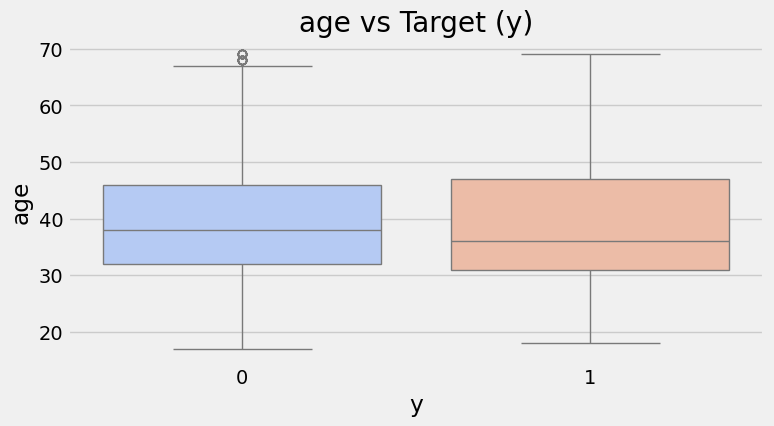

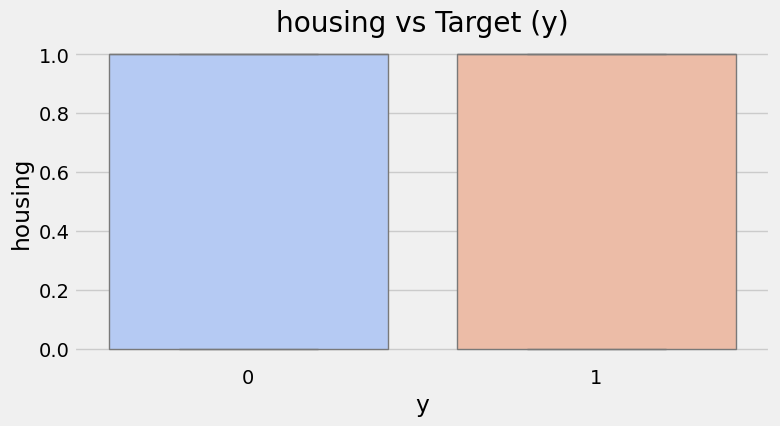

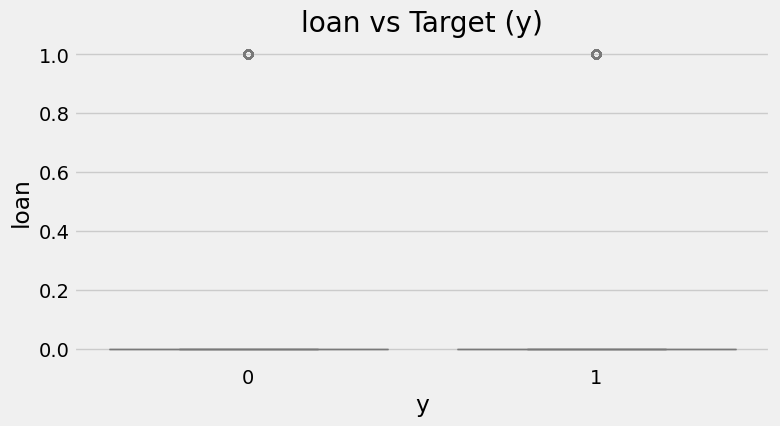

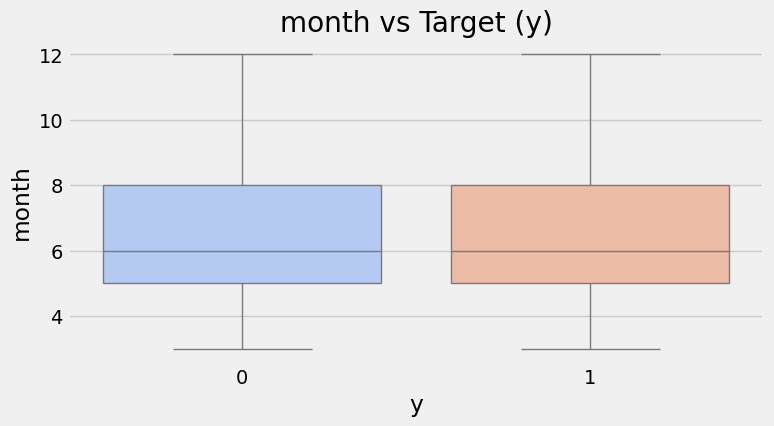

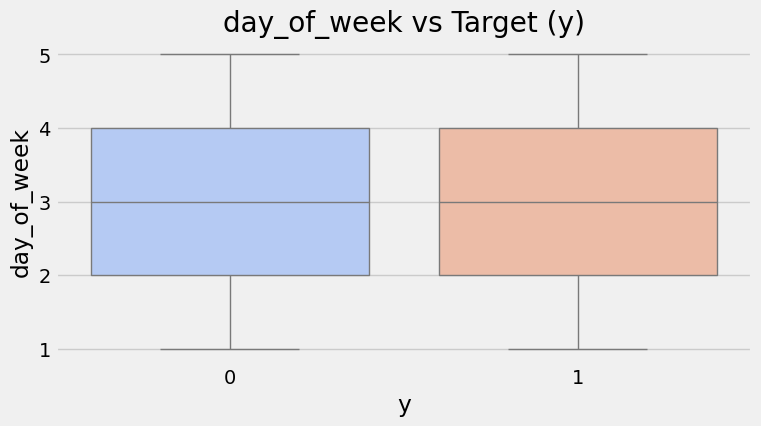

...

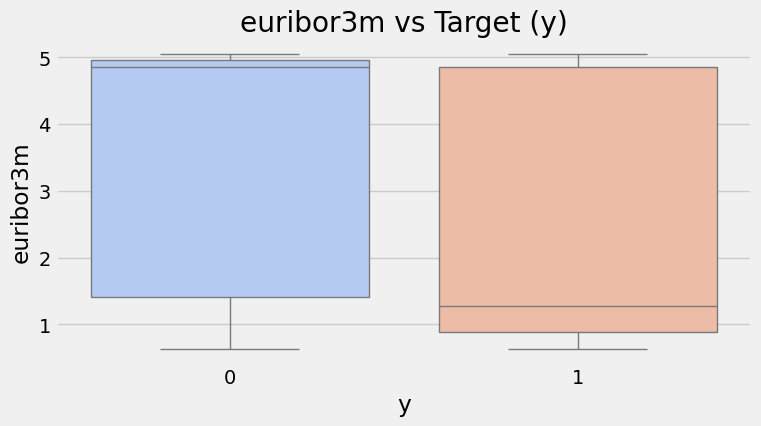

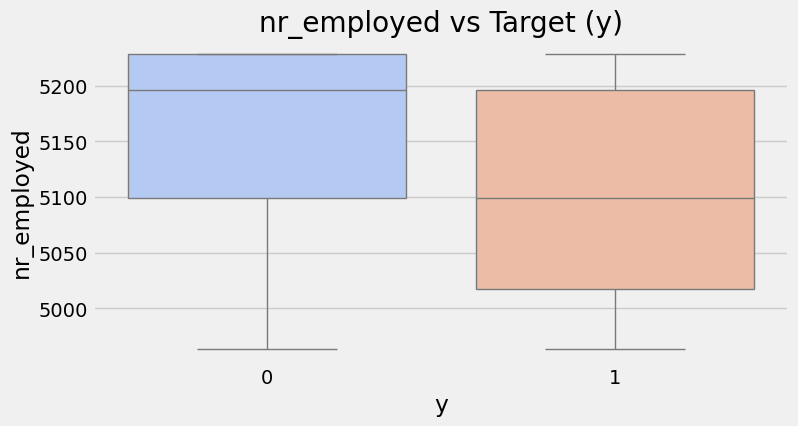

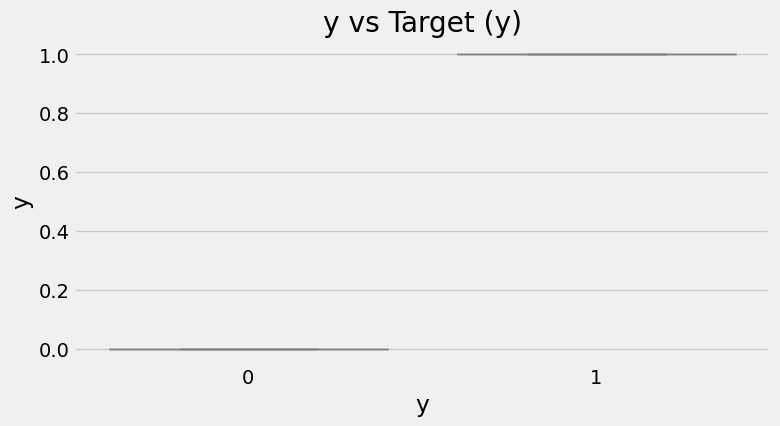

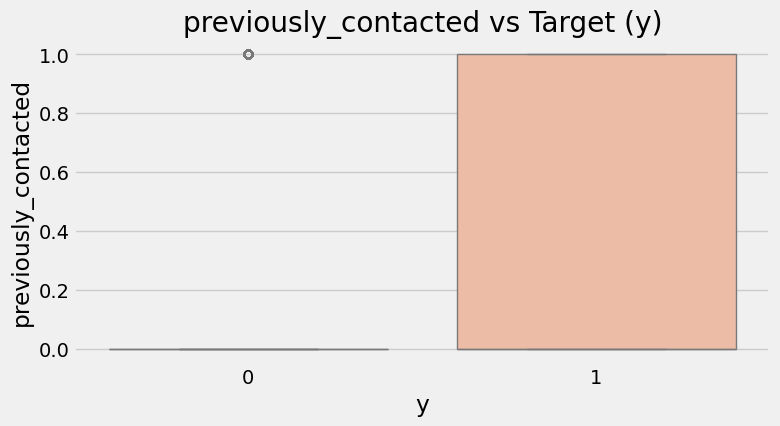

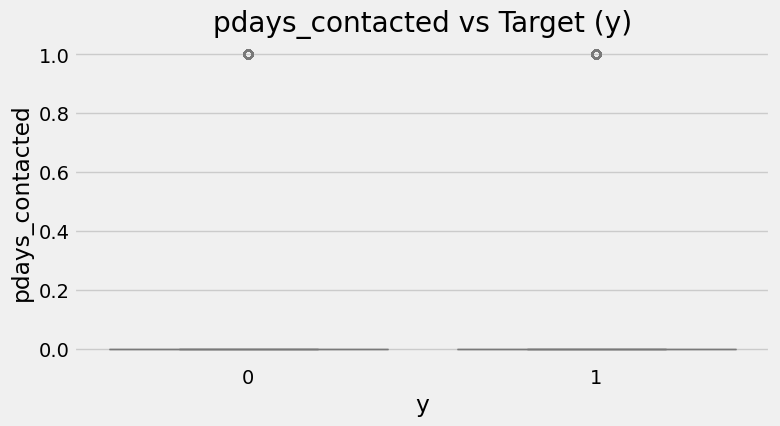

In [668]:
# Boxplots of numerical features grouped by target variable
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x='y', y=col, data=df_cleaned, palette='coolwarm')
    plt.title(f'{col} vs Target (y)')
    plt.show()


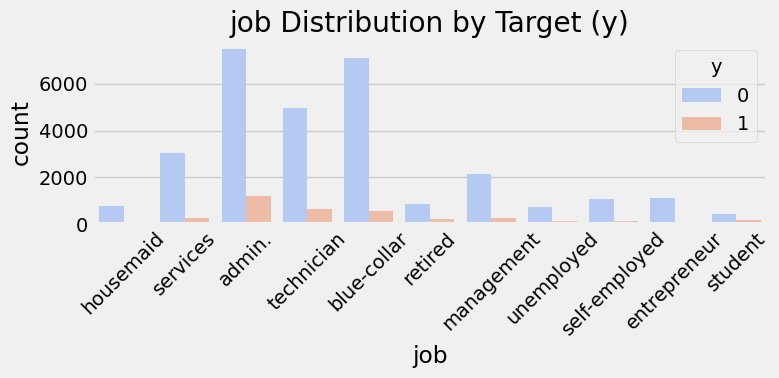

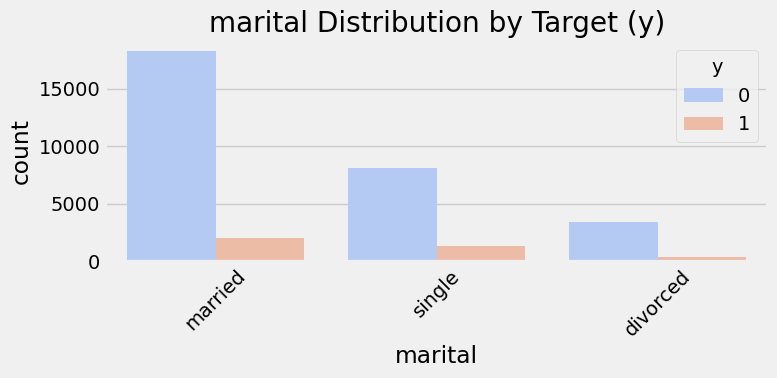

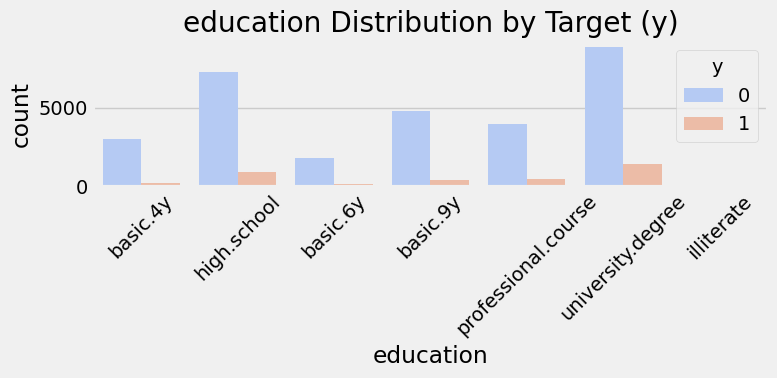

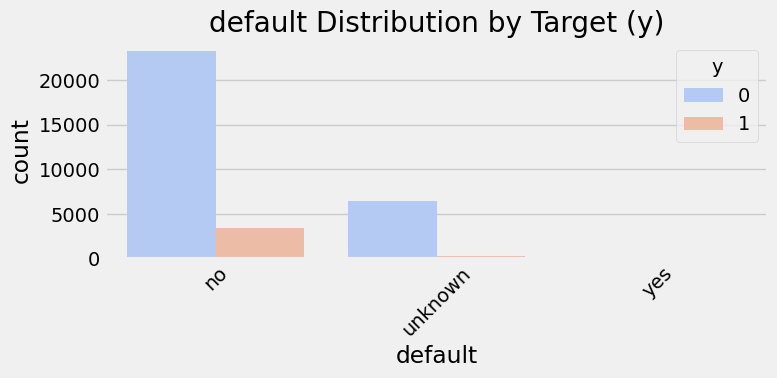

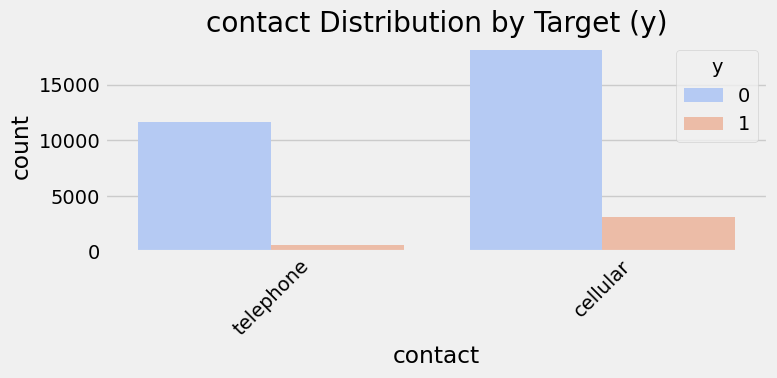

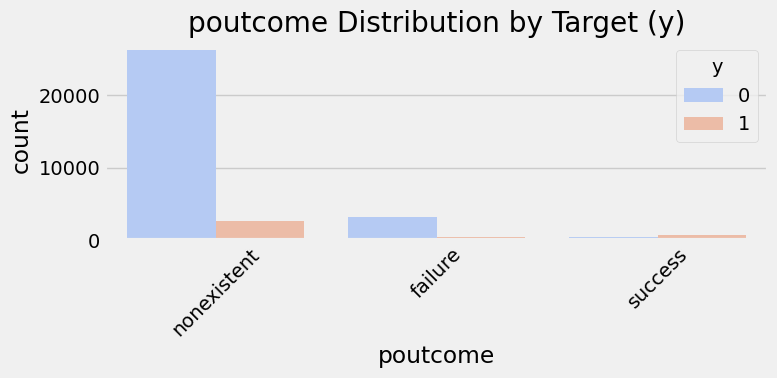

In [669]:
# Count plots of categorical features grouped by target variable
for col in categorical_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(x=col, hue='y', data=df_cleaned, palette='coolwarm')
    plt.title(f'{col} Distribution by Target (y)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    

### Multivariate analysis

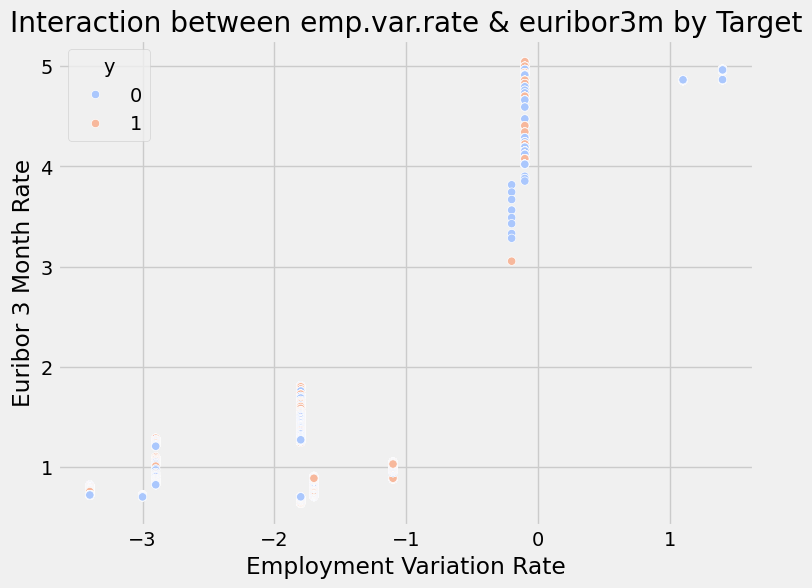

In [671]:
# Interaction plots: Relationship between 'emp.var.rate' & 'euribor3m' and target 'y'
if 'y' in df_cleaned.columns:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=df_cleaned['emp_var_rate'], y=df_cleaned['euribor3m'], hue=df_cleaned['y'], palette='coolwarm')
    plt.title('Interaction between emp.var.rate & euribor3m by Target')
    plt.xlabel('Employment Variation Rate')
    plt.ylabel('Euribor 3 Month Rate')
    plt.show()



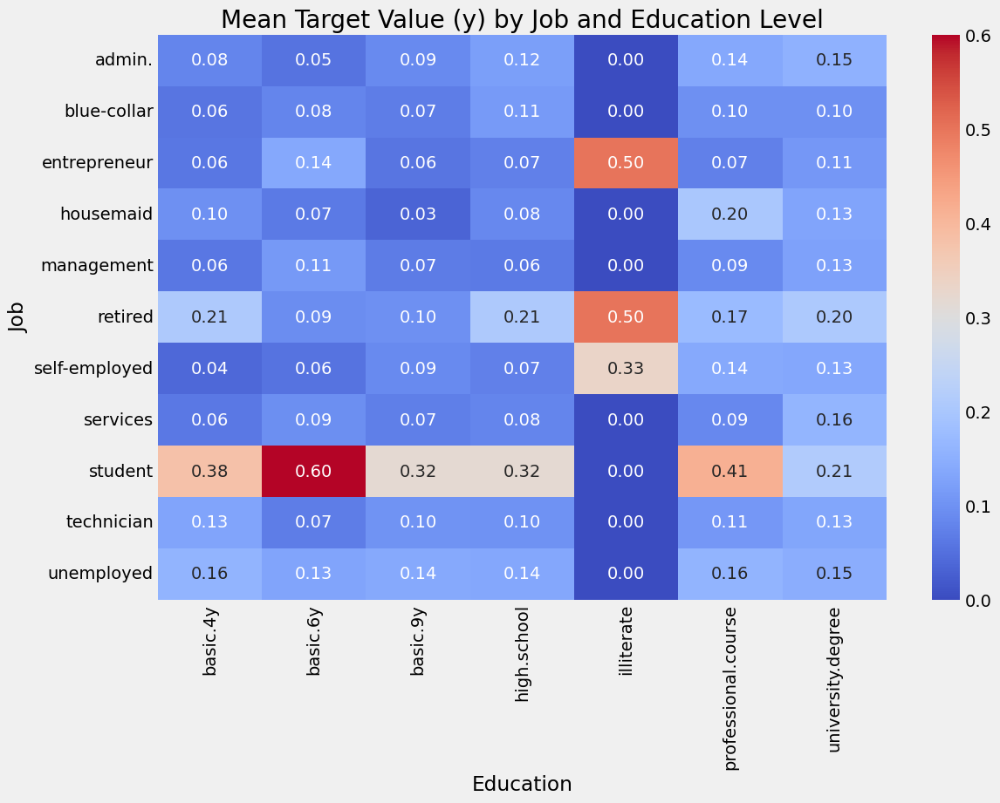

In [672]:
# 5. Grouped analysis: job & education affecting target
if 'job' in df_cleaned.columns and 'education' in df_cleaned.columns and 'y' in df.columns:
    pivot_table = pd.crosstab(index=df_cleaned['job'], columns=df_cleaned['education'], values=df_cleaned['y'], aggfunc='mean').fillna(0)

    plt.figure(figsize=(12, 8))
    sns.heatmap(pivot_table, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Mean Target Value (y) by Job and Education Level')
    plt.ylabel('Job')
    plt.xlabel('Education')
    plt.show()

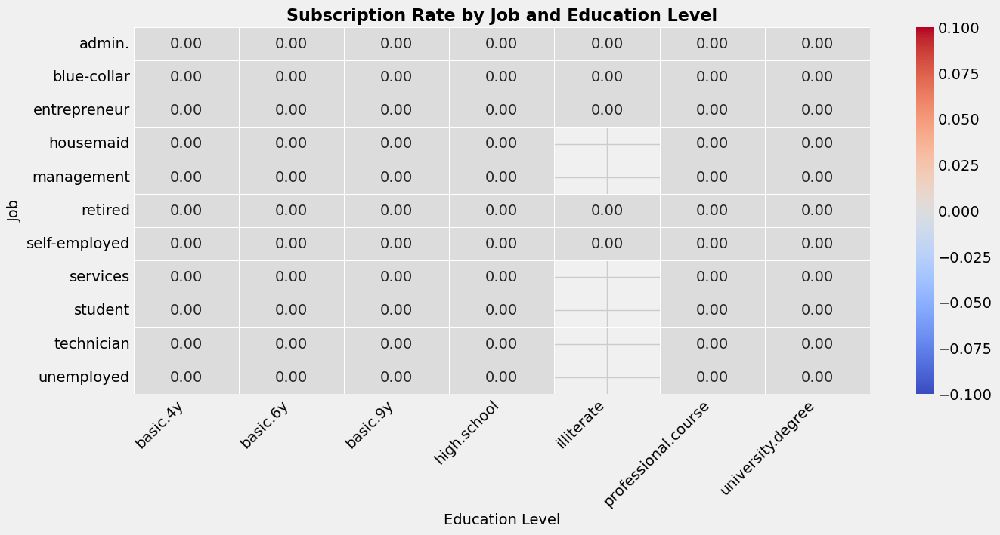

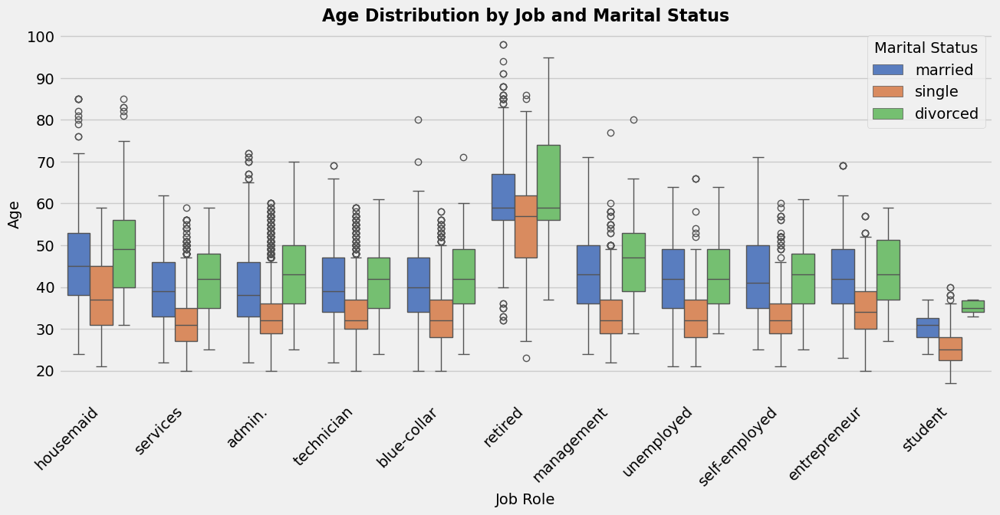

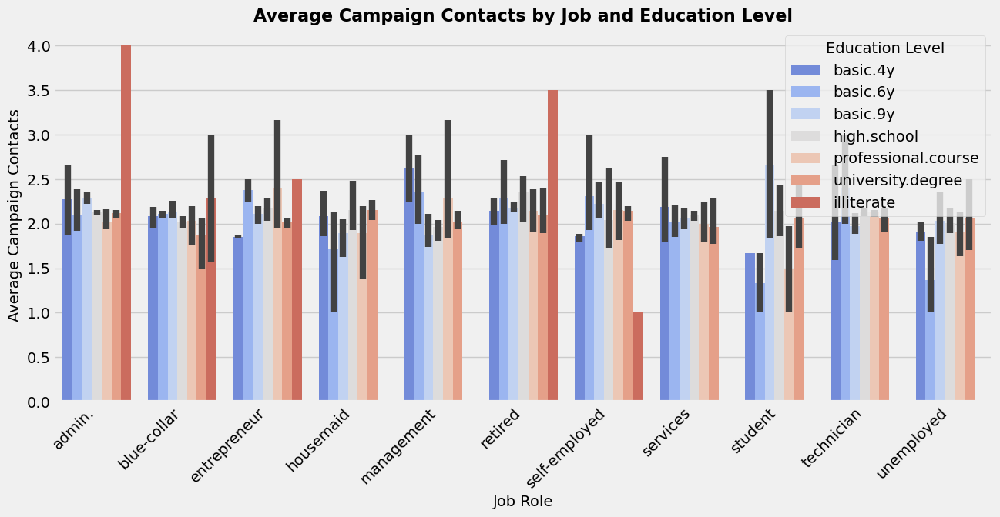

In [673]:
# Perform multivariate analysis
grouped_df = df_cleaned.groupby(['job', 'marital', 'education']).agg({
    'age': ['mean', 'median', 'count'],
    'campaign': ['mean', 'median'],
    'pdays_contacted': ['mean', 'median'],
    'previous': ['mean', 'median'],
    'cons_conf_idx': ['mean', 'median'],
    'y': lambda x: (x == 'yes').mean()  # Subscription rate
}).reset_index()

# Rename columns
grouped_df.columns = ['job', 'marital', 'education', 'age_mean', 'age_median', 'count',
                      'campaign_mean', 'campaign_median', 'pdays_mean', 'pdays_median',
                      'previous_mean', 'previous_median', 'cons_conf_idx_mean', 'cons_conf_idx_median', 'subscription_rate']

# Heatmap: Subscription Rate by Job and Education
plt.figure(figsize=(14, 6))
pivot_data = grouped_df.pivot_table(index="job", columns="education", values="subscription_rate", aggfunc="mean")
sns.heatmap(pivot_data, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Subscription Rate by Job and Education Level", fontsize=16, fontweight="bold")
plt.xlabel("Education Level", fontsize=14)
plt.ylabel("Job", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.show()

# Boxplot: Age Distribution by Job and Marital Status
plt.figure(figsize=(14, 6))
sns.boxplot(data=df, x='job', y='age', hue='marital', palette="muted")
plt.xticks(rotation=45, ha='right')
plt.title("Age Distribution by Job and Marital Status", fontsize=16, fontweight="bold")
plt.xlabel("Job Role", fontsize=14)
plt.ylabel("Age", fontsize=14)
plt.legend(title="Marital Status")
plt.show()

# Barplot: Average Campaign Contacts by Job and Education Level
plt.figure(figsize=(14, 6))
sns.barplot(data=grouped_df, x='job', y='campaign_mean', hue='education', palette="coolwarm")
plt.xticks(rotation=45, ha='right')
plt.title("Average Campaign Contacts by Job and Education Level", fontsize=16, fontweight="bold")
plt.xlabel("Job Role", fontsize=14)
plt.ylabel("Average Campaign Contacts", fontsize=14)
plt.legend(title="Education Level")
plt.show()

In [674]:
df_cleaned.groupby(['job', 'marital', 'education'])['y'].mean()

job         marital   education          
admin.      divorced  basic.4y               0.666667
                      basic.6y               0.000000
                      basic.9y               0.043478
                      high.school            0.096939
                      professional.course    0.088889
                                               ...   
unemployed  single    basic.6y               0.000000
                      basic.9y               0.227273
                      high.school            0.192982
                      professional.course    0.105263
                      university.degree      0.250000
Name: y, Length: 199, dtype: float64

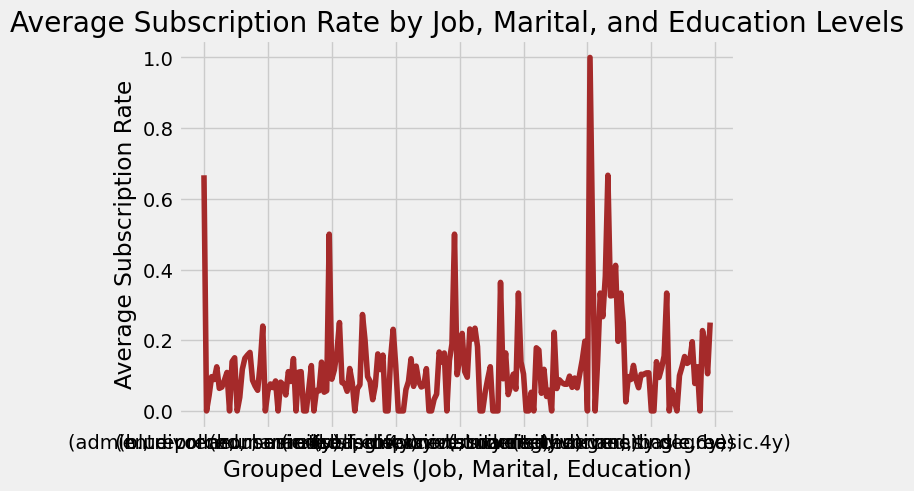

In [675]:
# Calculate the mean subscription rate grouped by job, marital, and education levels
grouped_means = df_cleaned.groupby(['job', 'marital', 'education'])['y'].mean()

# Plot the results
grouped_means.plot(kind='line', title="Average Subscription Rate by Job, Marital, and Education Levels", color="brown")

# Add labels
plt.xlabel("Grouped Levels (Job, Marital, Education)")
plt.ylabel("Average Subscription Rate")
plt.show()

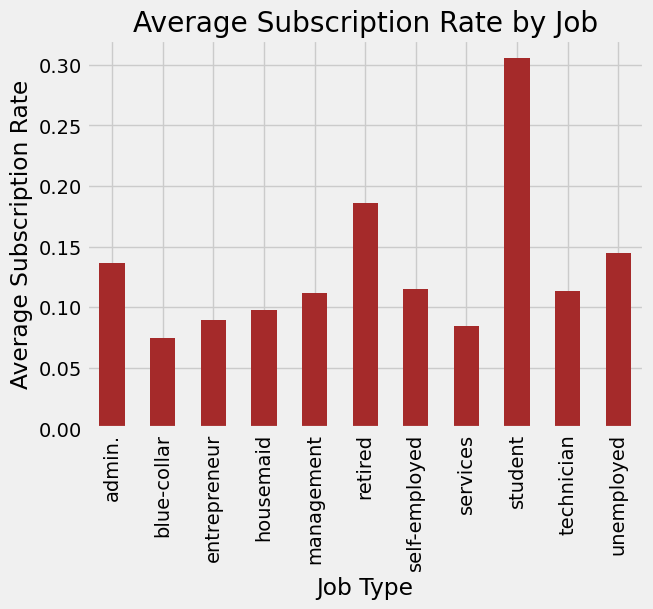

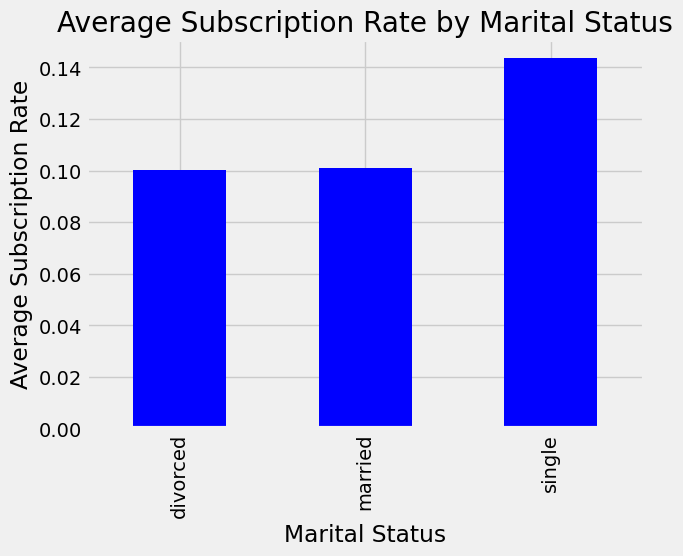

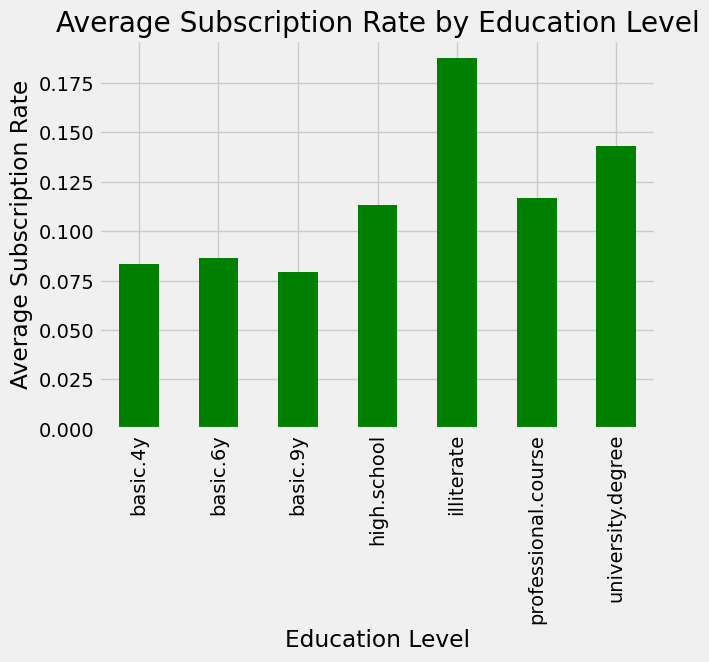

In [676]:
# Separate plots for clarity
grouped_job = df_cleaned.groupby('job')['y'].mean()
grouped_job.plot(kind='bar', title="Average Subscription Rate by Job", color="brown")
plt.xlabel("Job Type")
plt.ylabel("Average Subscription Rate")
plt.show()

grouped_marital = df_cleaned.groupby('marital')['y'].mean()
grouped_marital.plot(kind='bar', title="Average Subscription Rate by Marital Status", color="blue")
plt.xlabel("Marital Status")
plt.ylabel("Average Subscription Rate")
plt.show()

grouped_education = df_cleaned.groupby('education')['y'].mean()
grouped_education.plot(kind='bar', title="Average Subscription Rate by Education Level", color="green")
plt.xlabel("Education Level")
plt.ylabel("Average Subscription Rate")
plt.show()

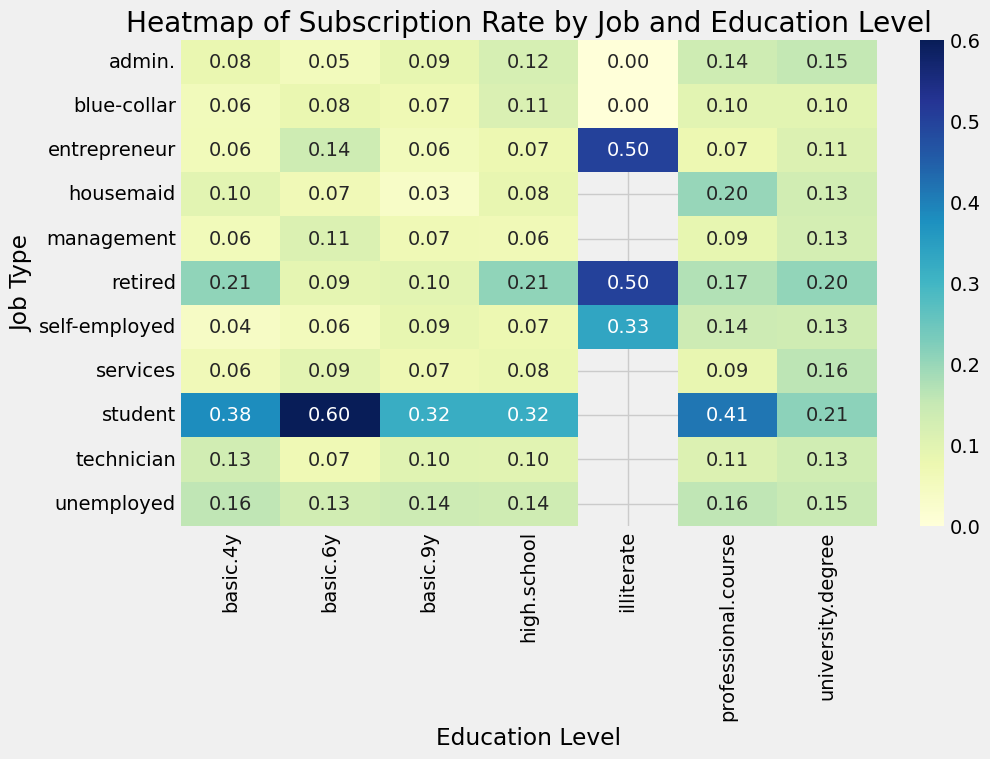

In [677]:
# Create a pivot table for heatmap
heatmap_data = df_cleaned.pivot_table(
    index='job', columns='education', values='y', aggfunc='mean'
)

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap="YlGnBu", annot=True, fmt=".2f")
plt.title("Heatmap of Subscription Rate by Job and Education Level")
plt.xlabel("Education Level")
plt.ylabel("Job Type")
plt.show()

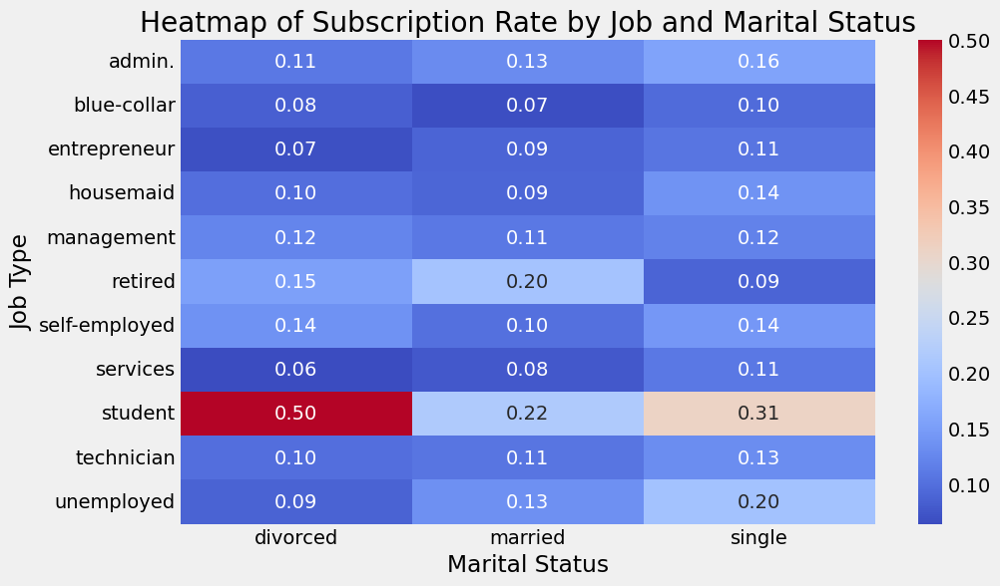

In [678]:
# Create a pivot table for the heatmap
heatmap_data_job_marital = df_cleaned.pivot_table(
    index='job', columns='marital', values='y', aggfunc='mean'
)

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data_job_marital, cmap="coolwarm", annot=True, fmt=".2f")
plt.title("Heatmap of Subscription Rate by Job and Marital Status")
plt.xlabel("Marital Status")
plt.ylabel("Job Type")
plt.show()

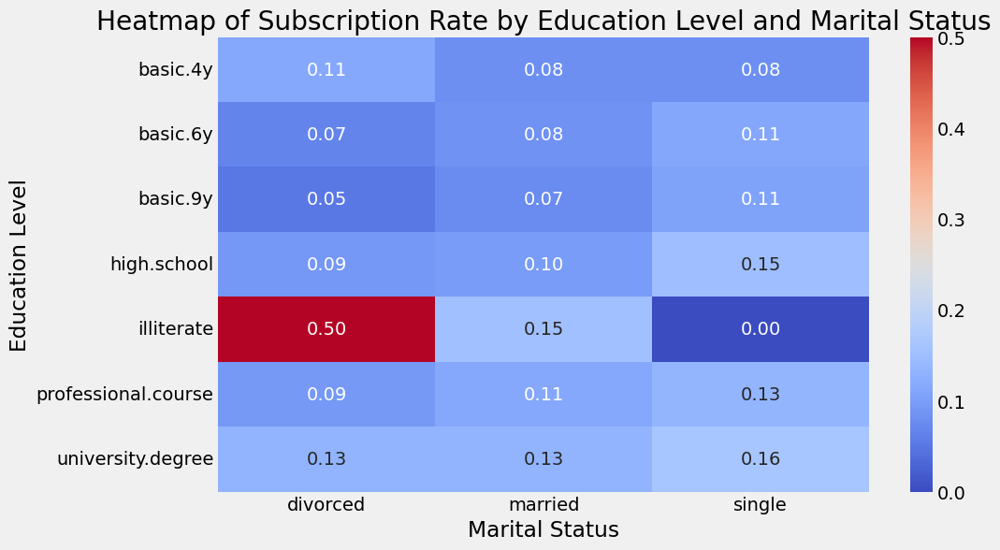

In [679]:
# Heatmap: Subscription Rate by Education Level and Marital Status
heatmap_data_edu_marital = df_cleaned.pivot_table(
    index='education', columns='marital', values='y', aggfunc='mean'
)

plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data_edu_marital, cmap="coolwarm", annot=True, fmt=".2f")
plt.title("Heatmap of Subscription Rate by Education Level and Marital Status")
plt.xlabel("Marital Status")
plt.ylabel("Education Level")
plt.show()

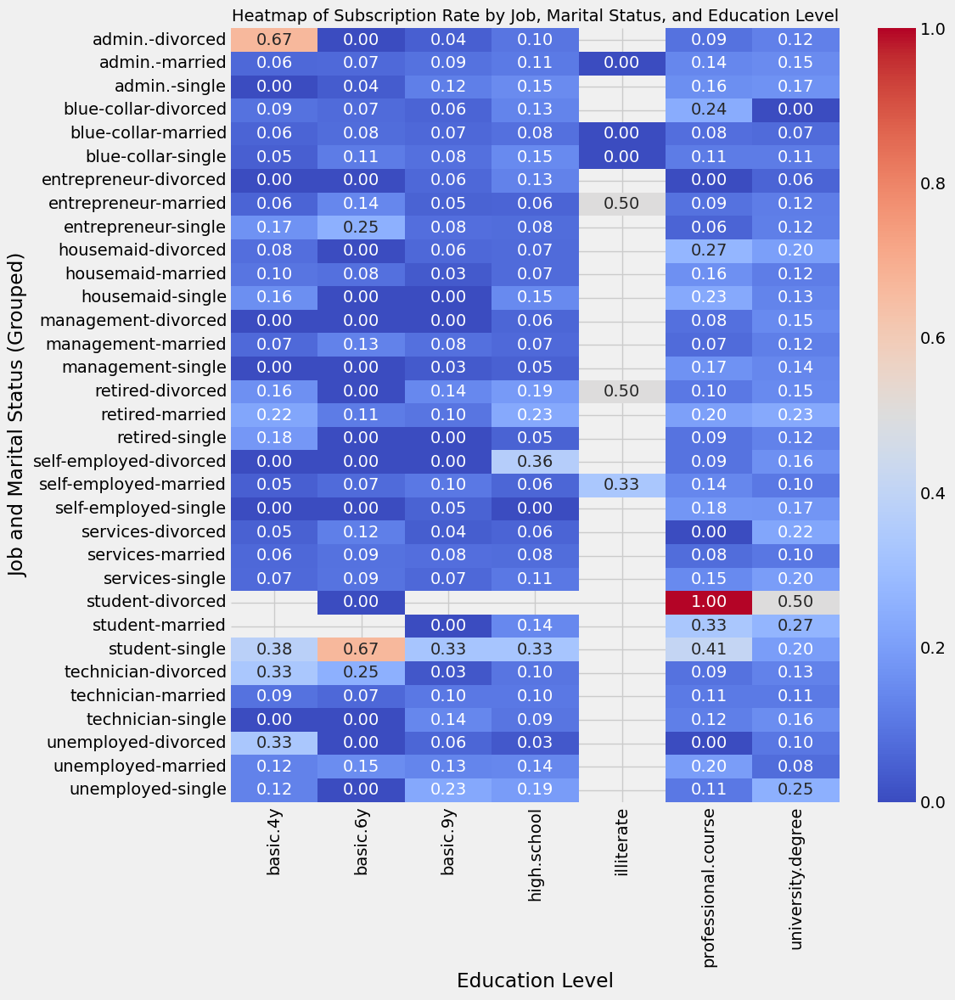

In [680]:
# Group the data to calculate the subscription rates
monthly = df_cleaned.groupby(['job', 'marital', 'education'], as_index=False)['y'].mean()

# Create a pivot table for subscription rate by job, marital status, and education level
heatmap_data_full = monthly.pivot_table(
    index=['job', 'marital'], columns='education', values='y', aggfunc='mean'
)

# Plot the heatmap
plt.figure(figsize=(12, 12))
sns.heatmap(heatmap_data_full, cmap="coolwarm", annot=True, fmt=".2f", cbar=True)

# Add titles and labels
plt.title("Heatmap of Subscription Rate by Job, Marital Status, and Education Level", fontsize=14)
plt.xlabel("Education Level")
plt.ylabel("Job and Marital Status (Grouped)")
plt.tight_layout()

plt.show()

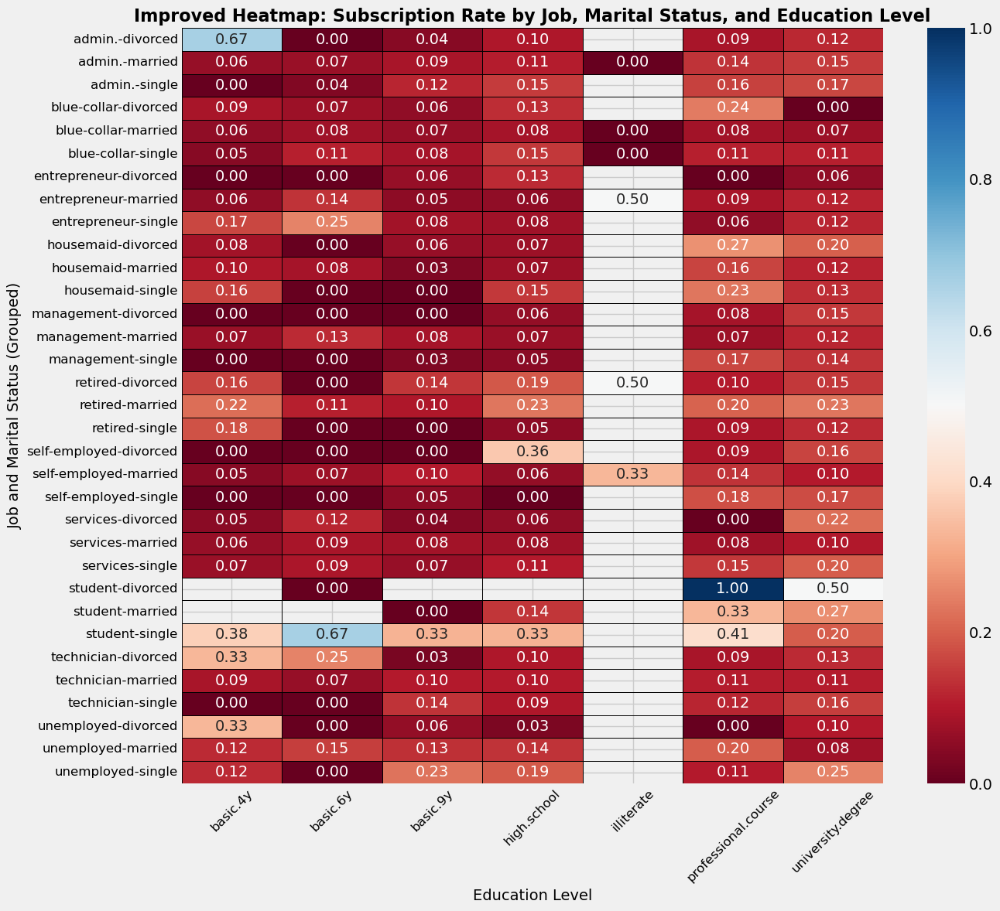

In [681]:
# Group the data to calculate the subscription rates
monthly = df_cleaned.groupby(['job', 'marital', 'education'], as_index=False)['y'].mean()

# Create a pivot table for subscription rate by job, marital status, and education level
heatmap_data_full = monthly.pivot_table(
    index=['job', 'marital'], columns='education', values='y', aggfunc='mean'
)

# Improved Heatmap: Subscription Rate by Job, Marital Status, and Education Level
plt.figure(figsize=(14, 12))

# Define a better colormap
sns.heatmap(
    heatmap_data_full, 
    cmap="RdBu",  # Diverging colormap
    annot=True, 
    fmt=".2f", 
    cbar=True, 
    linewidths=0.5,  # Add gridlines
    linecolor="black"  # Gridline color
)

# Add improved titles and labels
plt.title("Improved Heatmap: Subscription Rate by Job, Marital Status, and Education Level", fontsize=16, weight='bold')
plt.xlabel("Education Level", fontsize=14)
plt.ylabel("Job and Marital Status (Grouped)", fontsize=14)

# Adjust label sizes
plt.xticks(fontsize=12, rotation=45)  # Rotate x-axis labels
plt.yticks(fontsize=12)

# Tight layout for better spacing
plt.tight_layout()
plt.show()

In [682]:
monthly = df_cleaned.groupby(['job', 'marital', 'education'], as_index = False)['y'].mean()
monthly.head()

,job,marital,education,y
0,admin.,divorced,basic.4y,0.666667
1,admin.,divorced,basic.6y,0.000000
2,admin.,divorced,basic.9y,0.043478
3,admin.,divorced,high.school,0.096939
4,admin.,divorced,professional.course,0.088889


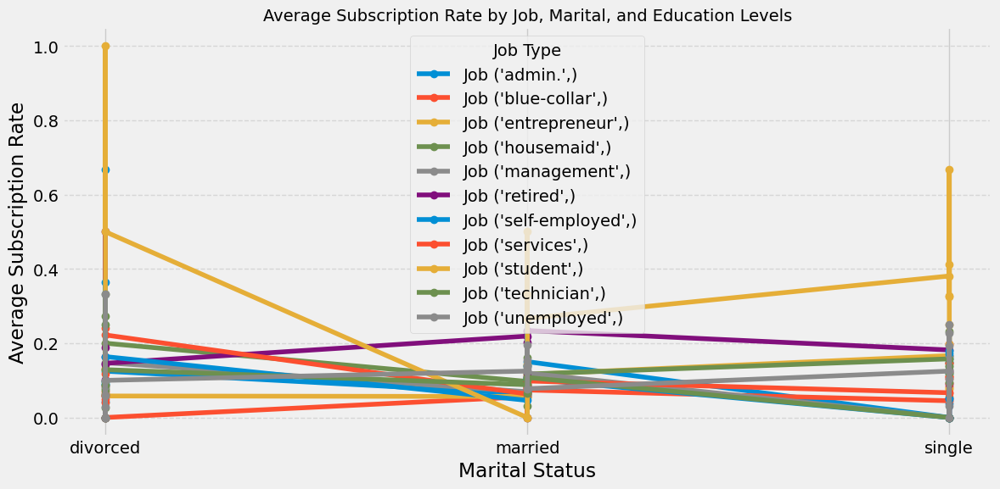

In [683]:
# Calculate the average subscription rate grouped by job, marital, and education levels
monthly = df_cleaned.groupby(['job', 'marital', 'education'], as_index=False)['y'].mean()

# Line plot for the grouped data
plt.figure(figsize=(12, 6))
for key, grp in monthly.groupby(['job']):
    plt.plot(grp['marital'], grp['y'], marker='o', label=f'Job {key}')

# Add titles and labels
plt.title("Average Subscription Rate by Job, Marital, and Education Levels", fontsize=14)
plt.xlabel("Marital Status")
plt.ylabel("Average Subscription Rate")
plt.legend(title="Job Type")
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

In [684]:
#Check for missing values
df_cleaned.isna().sum()

age                     0
job                     0
marital                 0
education               0
default                 0
housing                 0
loan                    0
contact                 0
month                   0
day_of_week             0
campaign                0
pdays                   0
previous                0
poutcome                0
emp_var_rate            0
cons_price_idx          0
cons_conf_idx           0
euribor3m               0
nr_employed             0
y                       0
previously_contacted    0
pdays_contacted         0
dtype: int64

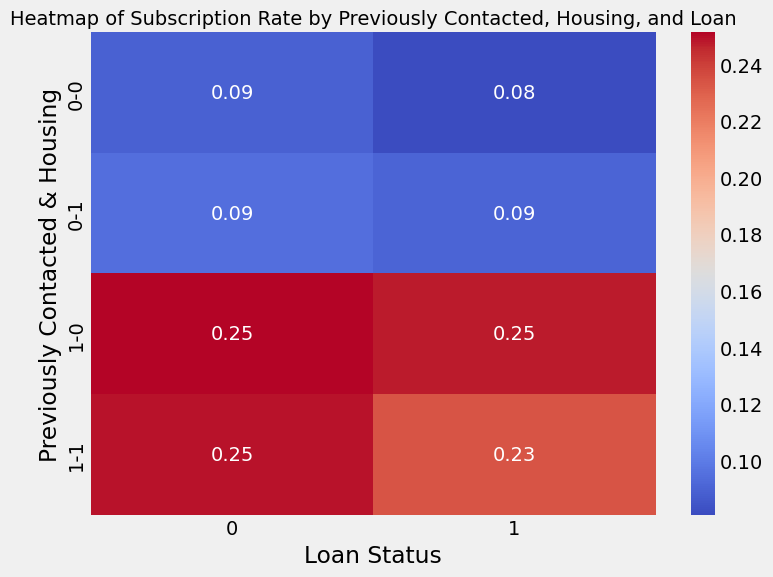

In [685]:
# Group by previously_contacted, housing, loan
monthly = df_cleaned.groupby(['previously_contacted', 'housing', 'loan'], as_index=False)['y'].mean()

# Create pivot table
heatmap_data_full = monthly.pivot_table(
    index=['previously_contacted', 'housing'],  # rows
    columns='loan',                             # columns
    values='y',
    aggfunc='mean'
)

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_full, cmap="coolwarm", annot=True, fmt=".2f", cbar=True)
plt.title("Heatmap of Subscription Rate by Previously Contacted, Housing, and Loan", fontsize=14)
plt.xlabel("Loan Status")
plt.ylabel("Previously Contacted & Housing")
plt.tight_layout()
plt.show()

### Problem 6: Train/Test Split

With your data prepared, split it into a train and test set.

In [687]:
# splitting the data 
X = df_cleaned.drop(columns = ['y', 'pdays','previous'])
y = df_cleaned['y']

# Identify columns with 'unknown' values and replace them with NaN for imputation
X.replace('unknown', np.nan, inplace=True)

# # doing train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

print("X_train: ", X_train.shape)
print("y_train: ", y_train.shape)


print("\n")

print("X_test: ", X_test.shape)
print("y_test: ", y_test.shape)

display(X_train.head())
display(y_train.head())

# Identify numerical and categorical columns dynamically
numerical_cols = X_train.select_dtypes(include=["int64", "float64"]).columns.tolist()
categorical_cols = X_train.select_dtypes(include=["object"]).columns.tolist()

# Define imputers for missing values (replacing NaN)
numerical_imputer = SimpleImputer(strategy='mean')
categorical_imputer = SimpleImputer(strategy='most_frequent')

# Define transformers for preprocessing using MinMaxScaler
numerical_transformer = Pipeline(steps=[
    ('imputer', numerical_imputer),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', categorical_imputer),
    ('encoder', OneHotEncoder(handle_unknown="ignore"))
])

# Combine transformations
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

X_train:  (23495, 19)
y_train:  (23495,)


X_test:  (10070, 19)
y_test:  (10070,)


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,previously_contacted,pdays_contacted
33845,58,housemaid,single,professional.course,no,0,0,cellular,4,1,2,success,-1.8,93.749,-34.6,0.642,5008.7,1,1
8029,32,blue-collar,married,professional.course,no,0,0,telephone,6,5,1,nonexistent,1.4,94.465,-41.8,4.967,5228.1,0,0
23236,56,technician,married,professional.course,NaN,1,0,cellular,11,5,6,nonexistent,-0.1,93.200,-42.0,4.021,5195.8,0,0
9178,35,technician,married,professional.course,no,1,0,telephone,6,2,3,nonexistent,1.4,94.465,-41.8,4.961,5228.1,0,0
35140,62,admin.,married,high.school,no,0,0,cellular,10,2,4,failure,-1.1,94.601,-49.5,1.037,4963.6,1,1


33845    0
8029     0
23236    0
9178     0
35140    1
Name: y, dtype: int64

### Problem 7: A Baseline Model

Before we build our first model, we want to establish a baseline.  What is the baseline performance that our classifier should aim to beat?

In [724]:
baseline = df_cleaned['y'].value_counts(normalize = True)[0]
print(baseline)

0.8870251750335171


Baseline Model Accuracy: 0.8863
Baseline Model Precision: 0.0000
Baseline Model Recall: 0.0000
Baseline Model F1 Score: 0.0000
ROC-AUC Score: 0.5000


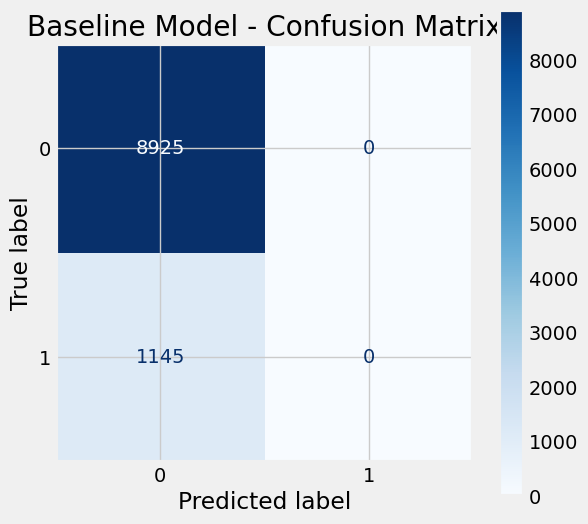


Baseline Model - Classification Report:

              precision    recall  f1-score   support

           0       0.89      1.00      0.94      8925
           1       0.00      0.00      0.00      1145

    accuracy                           0.89     10070
   macro avg       0.44      0.50      0.47     10070
weighted avg       0.79      0.89      0.83     10070



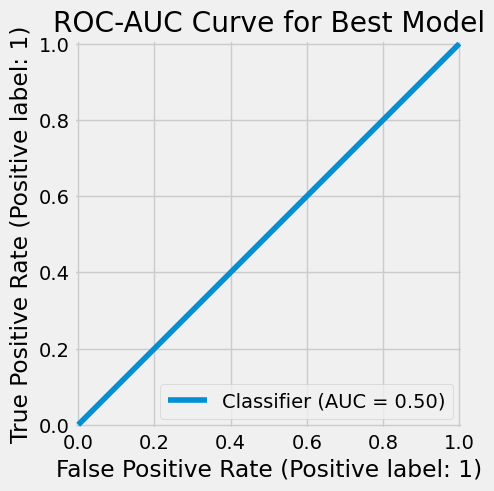


Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.0,0.0,0.0,0.00301,0.5,-


In [725]:
# Create a baseline model using DummyClassifier
baseline_model = DummyClassifier(strategy="most_frequent")  # Always predicts the most common class

# Measure training time
start_time = time.time()
baseline_model.fit(X_train, y_train)
train_time = time.time() - start_time

# Make predictions
y_baseline_pred = baseline_model.predict(X_test)
y_pred_proba = baseline_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Evaluate baseline performance
baseline_accuracy = accuracy_score(y_test, y_baseline_pred)
baseline_precision = precision_score(y_test, y_baseline_pred, zero_division=0)
baseline_recall = recall_score(y_test, y_baseline_pred, zero_division=0)
baseline_f1 = f1_score(y_test, y_baseline_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print all evaluation metrics
print(f"Baseline Model Accuracy: {baseline_accuracy:.4f}")
print(f"Baseline Model Precision: {baseline_precision:.4f}")
print(f"Baseline Model Recall: {baseline_recall:.4f}")
print(f"Baseline Model F1 Score: {baseline_f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Generate and display confusion matrix for baseline model
cm_baseline = confusion_matrix(y_test, y_baseline_pred)
disp_baseline = ConfusionMatrixDisplay(confusion_matrix=cm_baseline, display_labels=[0, 1])

fig, ax = plt.subplots(figsize=(6, 6))
disp_baseline.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Baseline Model - Confusion Matrix")
plt.show()

# Print classification report for baseline model
print("\nBaseline Model - Classification Report:\n")
print(classification_report(y_test, y_baseline_pred))

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title("ROC-AUC Curve for Best Model")
plt.show()

# Create a new DataFrame with specified columns including precision, recall, and F1
results_df = pd.DataFrame(columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

# Append baseline model results
current_results = pd.DataFrame([[
    'Baseline model',
    baseline_model.score(X_train, y_train),
    baseline_model.score(X_test, y_test),
    baseline_precision,
    baseline_recall,
    baseline_f1,
    train_time,
    roc_auc,
    '-'
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### Problem 8: A Simple Model

Use Logistic Regression to build a basic model on your data.  

### Simple logistic Regression

Accuracy: 0.8981
Precision: 0.6686
Recall: 0.2061
F1 Score: 0.3151
ROC-AUC Score: 0.7644


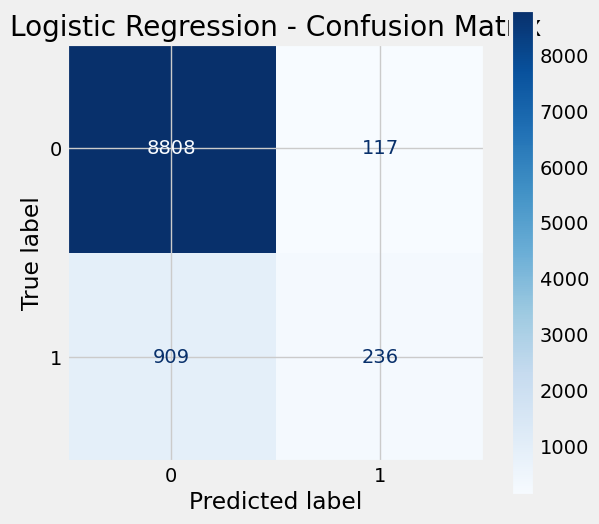


Classification Report:

              precision    recall  f1-score   support

           0       0.91      0.99      0.94      8925
           1       0.67      0.21      0.32      1145

    accuracy                           0.90     10070
   macro avg       0.79      0.60      0.63     10070
weighted avg       0.88      0.90      0.87     10070



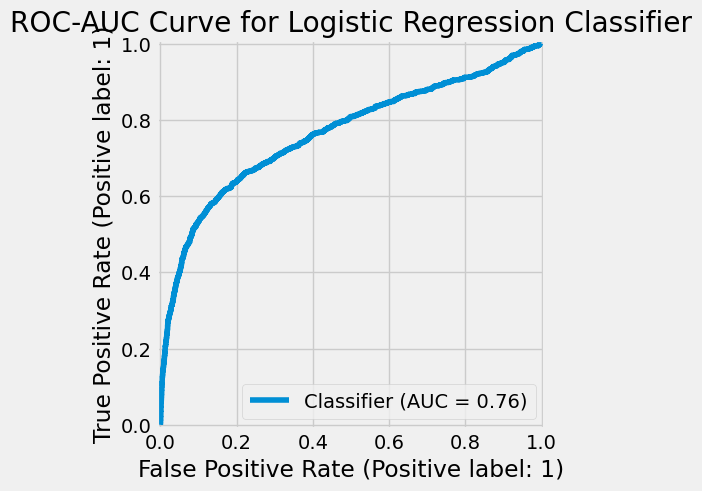

Training set shape: (23495, 19)

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-


In [728]:
# Define pipeline with Logistic Regression
pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("classifier", LogisticRegression())
])

# Train the model
start_train_time = time.time()
pipeline.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Make predictions
y_pred = pipeline.predict(X_test)
y_pred_proba = pipeline.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Evaluate performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print all evaluation metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Generate and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_numeric = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

fig, ax = plt.subplots(figsize=(6, 6))
disp_numeric.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Logistic Regression - Confusion Matrix")
plt.show()

# Print classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title("ROC-AUC Curve for Logistic Regression Classifier")
plt.show()

# Output training set shape for reference
print(f"Training set shape: {X_train.shape}")

# Create or update results DataFrame
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Simple Logistic Regression Classifier',
    pipeline.score(X_train, y_train),
    accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    '-'
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### Problem 9: Score the Model

What is the accuracy of your model?

### Problem 10: Model Comparisons

Now, we aim to compare the performance of the Logistic Regression model to our KNN algorithm, Decision Tree, and SVM models.  Using the default settings for each of the models, fit and score each.  Also, be sure to compare the fit time of each of the models.  Present your findings in a `DataFrame` similar to that below:

| Model | Train Time | Train Accuracy | Test Accuracy |
| ----- | ---------- | -------------  | -----------   |
|     |    |.     |.     |

### KNN - simple model

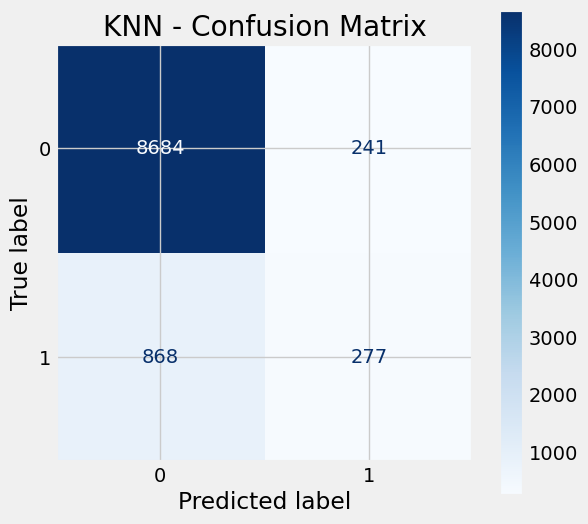


Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.97      0.94      8925
           1       0.53      0.24      0.33      1145

    accuracy                           0.89     10070
   macro avg       0.72      0.61      0.64     10070
weighted avg       0.87      0.89      0.87     10070

Accuracy: 0.8899
Precision: 0.5347
Recall: 0.2419
F1 Score: 0.3331
ROC-AUC Score: 0.6943


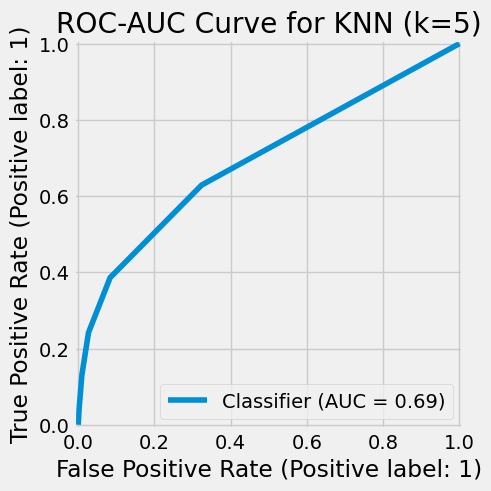


Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-


In [732]:
# Define KNN model pipeline (default n_neighbors=5 unless specified)
knn_pipe = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("knn", KNeighborsClassifier())  # Update k here if needed
])

# Step 3: Fit the Pipeline
start_train_time = time.time()
knn_pipe.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Step 4: Make Predictions
y_pred = knn_pipe.predict(X_test)
y_pred_proba = knn_pipe.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Step 5: Evaluate the Model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Generate and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_numeric = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

fig, ax = plt.subplots(figsize=(6, 6))
disp_numeric.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("KNN - Confusion Matrix")
plt.show()

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title(f"ROC-AUC Curve for KNN (k={knn_pipe.named_steps['knn'].n_neighbors})")
plt.show()

# Create or update results DataFrame
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Simple KNN Classifier',
    knn_pipe.score(X_train, y_train),
    accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    '-'
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### Decision Tree - Simple model

Training Accuracy: 0.9948
Test Accuracy: 0.8271
Precision: 0.2812
Recall: 0.3345
F1 Score: 0.3055
Depth of Tree: 36
ROC-AUC Score: 0.6146
Training Time: 0.54 seconds

Classification Report (Decision Tree):

              precision    recall  f1-score   support

           0       0.91      0.89      0.90      8925
           1       0.28      0.33      0.31      1145

    accuracy                           0.83     10070
   macro avg       0.60      0.61      0.60     10070
weighted avg       0.84      0.83      0.83     10070



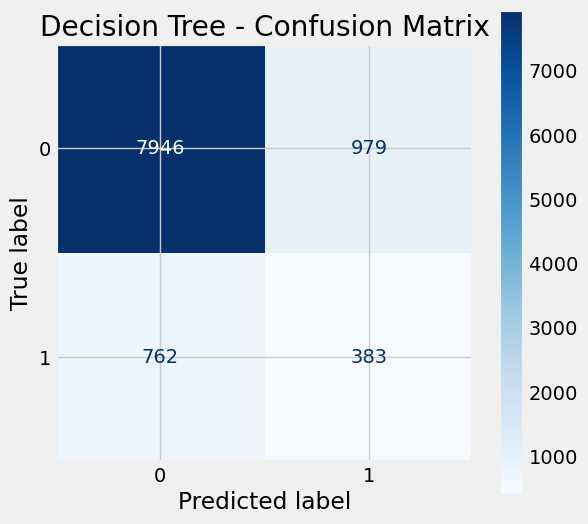

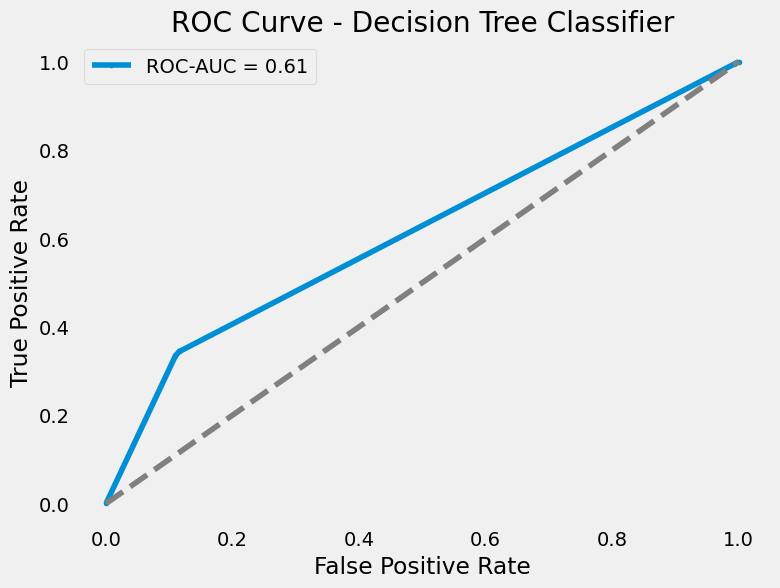


Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-


In [734]:
# Define pipeline with preprocessing and Decision Tree
pipeline_dt = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier(random_state=42))
])

# Train the Decision Tree model and track training time
start_train_time = time.time()
pipeline_dt.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Make predictions
y_pred_dt = pipeline_dt.predict(X_test)
y_pred_proba_dt = pipeline_dt.predict_proba(X_test)[:, 1]

# Calculate performance metrics
depth_1 = pipeline_dt.named_steps["classifier"].get_depth()
train_acc = pipeline_dt.score(X_train, y_train)
test_acc = pipeline_dt.score(X_test, y_test)
precision = precision_score(y_test, y_pred_dt, zero_division=0)
recall = recall_score(y_test, y_pred_dt, zero_division=0)
f1 = f1_score(y_test, y_pred_dt, zero_division=0)
roc_auc_dt = roc_auc_score(y_test, y_pred_proba_dt)

# Print key performance metrics
print(f'Training Accuracy: {train_acc:.4f}')
print(f'Test Accuracy: {test_acc:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Depth of Tree: {depth_1}')
print(f'ROC-AUC Score: {roc_auc_dt:.4f}')
print(f'Training Time: {train_time:.2f} seconds')

# Classification report
print("\nClassification Report (Decision Tree):\n")
print(classification_report(y_test, y_pred_dt))

# Confusion matrix
cm_dt = confusion_matrix(y_test, y_pred_dt)
disp_dt = ConfusionMatrixDisplay(confusion_matrix=cm_dt, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_dt.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Decision Tree - Confusion Matrix")
plt.show()

# ROC Curve
fpr_dt, tpr_dt, _ = roc_curve(y_test, y_pred_proba_dt)
plt.figure(figsize=(8, 6))
plt.plot(fpr_dt, tpr_dt, marker='.', label=f"ROC-AUC = {roc_auc_dt:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Decision Tree Classifier")
plt.legend()
plt.grid()
plt.show()

# Create or update results DataFrame
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Simple Decision Tree Classifier',
    train_acc,
    test_acc,
    precision,
    recall,
    f1,
    train_time,
    roc_auc_dt,
    '-'
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### SVM - Simple model

Training Accuracy: 0.9032
Test Accuracy: 0.9001
Precision: 0.6699
Recall: 0.2393
F1 Score: 0.3526
ROC-AUC Score: 0.6805
Training Time: 269.46 seconds

Classification Report (SVM):

              precision    recall  f1-score   support

           0       0.91      0.98      0.95      8925
           1       0.67      0.24      0.35      1145

    accuracy                           0.90     10070
   macro avg       0.79      0.61      0.65     10070
weighted avg       0.88      0.90      0.88     10070



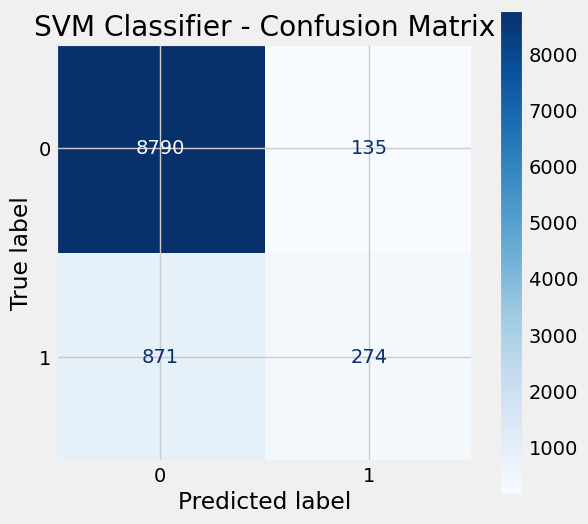

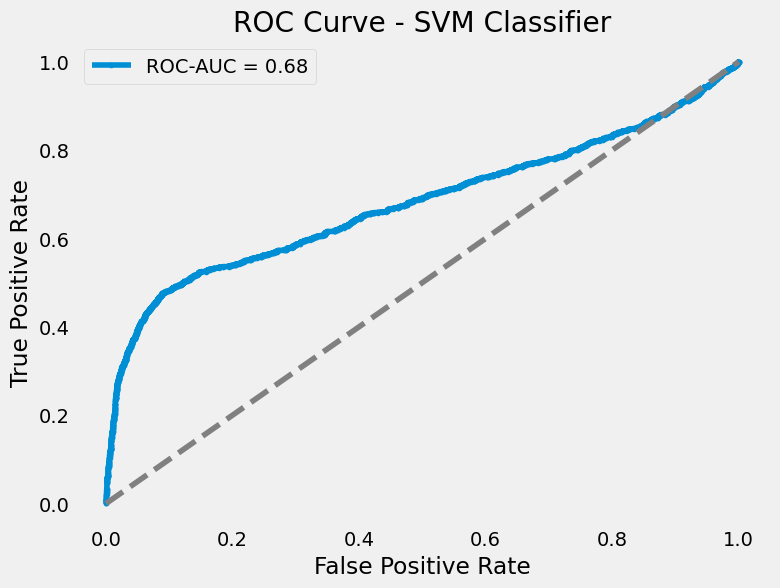


Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-


In [736]:
# Define SVM pipeline
pipeline_svm = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', SVC(probability=True, kernel='rbf', C=1, gamma='scale', random_state=42))
])

# Train the SVM model
start_time = time.time()
pipeline_svm.fit(X_train, y_train)
fit_time = time.time() - start_time

# Evaluate the SVM model
y_pred_svm = pipeline_svm.predict(X_test)
y_pred_proba_svm = pipeline_svm.predict_proba(X_test)[:, 1]

# Compute performance metrics
train_acc_svm = pipeline_svm.score(X_train, y_train)
test_acc_svm = pipeline_svm.score(X_test, y_test)
precision_svm = precision_score(y_test, y_pred_svm, zero_division=0)
recall_svm = recall_score(y_test, y_pred_svm, zero_division=0)
f1_svm = f1_score(y_test, y_pred_svm, zero_division=0)
roc_auc_svm = roc_auc_score(y_test, y_pred_proba_svm)

# Output performance metrics
print(f"Training Accuracy: {train_acc_svm:.4f}")
print(f"Test Accuracy: {test_acc_svm:.4f}")
print(f"Precision: {precision_svm:.4f}")
print(f"Recall: {recall_svm:.4f}")
print(f"F1 Score: {f1_svm:.4f}")
print(f"ROC-AUC Score: {roc_auc_svm:.4f}")
print(f"Training Time: {fit_time:.2f} seconds")

# Classification report
print("\nClassification Report (SVM):\n")
print(classification_report(y_test, y_pred_svm))

# Plot confusion matrix
cm_svm = confusion_matrix(y_test, y_pred_svm)
disp_svm = ConfusionMatrixDisplay(confusion_matrix=cm_svm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("SVM Classifier - Confusion Matrix")
plt.show()

# Plot ROC curve
fpr_svm, tpr_svm, _ = roc_curve(y_test, y_pred_proba_svm)
plt.figure(figsize=(8, 6))
plt.plot(fpr_svm, tpr_svm, marker='.', label=f"ROC-AUC = {roc_auc_svm:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM Classifier")
plt.legend()
plt.grid()
plt.show()

# Create or update results DataFrame
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Simple SVM Classifier',
    train_acc_svm,
    test_acc_svm,
    precision_svm,
    recall_svm,
    f1_svm,
    fit_time,
    roc_auc_svm,
    '-'
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### Problem 11: Improving the Model

Now that we have some basic models on the board, we want to try to improve these.  Below, we list a few things to explore in this pursuit.

- More feature engineering and exploration.  For example, should we keep the gender feature?  Why or why not?
- Hyperparameter tuning and grid search.  All of our models have additional hyperparameters to tune and explore.  For example the number of neighbors in KNN or the maximum depth of a Decision Tree.  
- Adjust your performance metric

## KNN

### KNN - Hyperparamter tuning - scoring='Recall'

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best Parameters: {'knn__metric': 'manhattan', 'knn__n_neighbors': 5, 'knn__weights': 'distance'}


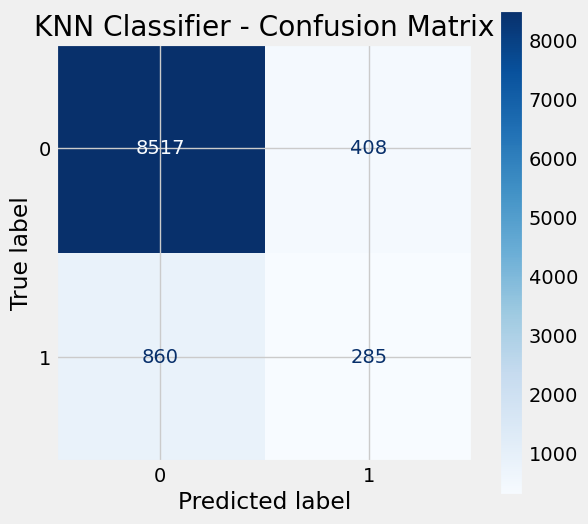


Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.95      0.93      8925
           1       0.41      0.25      0.31      1145

    accuracy                           0.87     10070
   macro avg       0.66      0.60      0.62     10070
weighted avg       0.85      0.87      0.86     10070

Accuracy: 0.8741
Precision: 0.4113
Recall: 0.2489
F1 Score: 0.3101
ROC-AUC Score: 0.6908


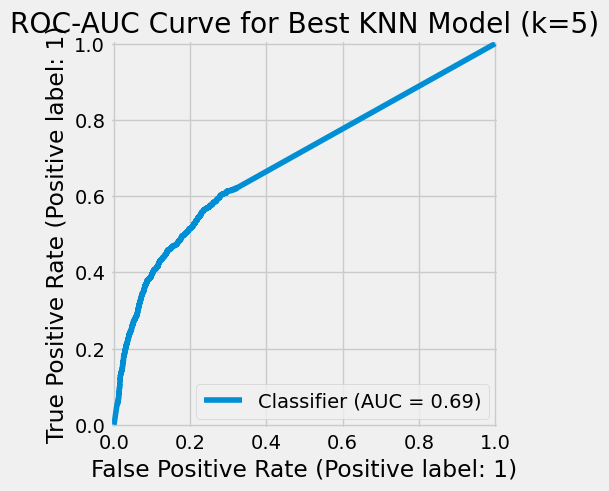


Results DataFrame:
Training set shape: (23495, 19)


In [740]:
# Define KNN model pipeline
knn_pipe = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("knn", KNeighborsClassifier())
])

# Step 2: Hyperparameter tuning using GridSearchCV
param_grid = {
    'knn__n_neighbors': [5,10,15,20],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

grid_search = GridSearchCV(knn_pipe, param_grid, cv=5, scoring='recall', n_jobs=-1, verbose=1)

# Step 3: Fit the Pipeline and calculate training time
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after hyperparameter tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")

# Step 4: Make Predictions
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Step 5: Evaluate the Model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_svm = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("KNN Classifier - Confusion Matrix")
plt.show()

# Print all evaluation metrics
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title(f"ROC-AUC Curve for Best KNN Model (k={best_params['knn__n_neighbors']})")
plt.show()

# Step 6: Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'KNN Fine Tuned',
    best_model.score(X_train, y_train),
    accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

# Output training set shape for reference
print(f"Training set shape: {X_train.shape}")

In [741]:
results_df

,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."


### KNN - Hyperparamter tuning and SelectKBest

Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best Parameters: {'feature_selection__k': 10, 'knn__metric': 'euclidean', 'knn__n_neighbors': 3, 'knn__weights': 'uniform'}
Test Accuracy: 0.8821


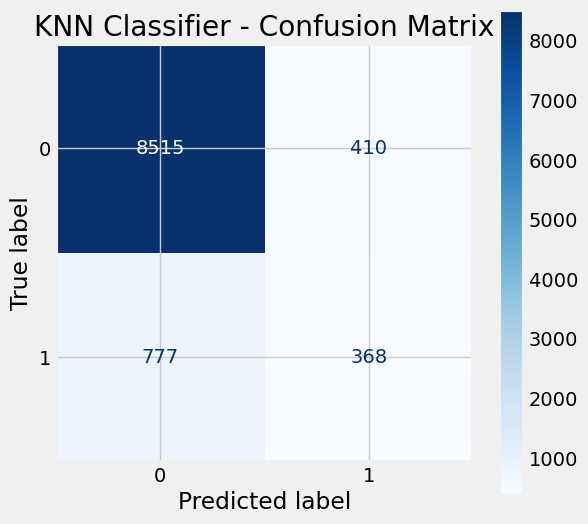


Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.95      0.93      8925
           1       0.47      0.32      0.38      1145

    accuracy                           0.88     10070
   macro avg       0.69      0.64      0.66     10070
weighted avg       0.87      0.88      0.87     10070

Accuracy: 0.8821
Precision: 0.4730
Recall: 0.3214
F1 Score: 0.3827
ROC-AUC Score: 0.6887


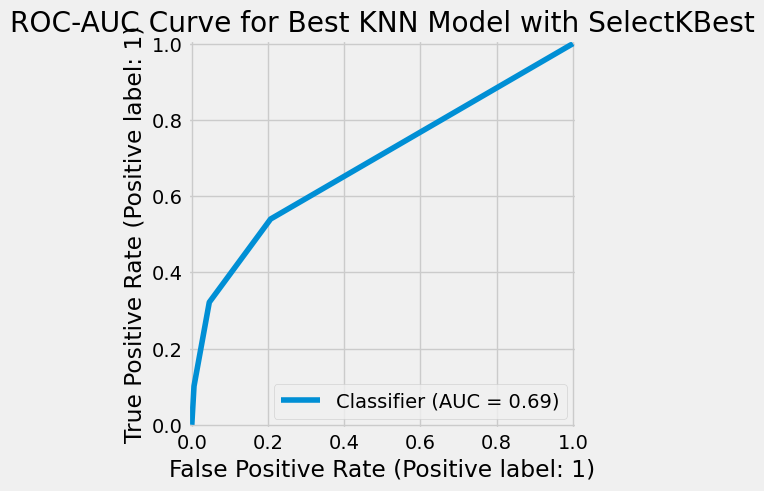


Results DataFrame:
Training set shape: (23495, 19)


In [743]:
# Define KNN model pipeline
knn_pipe = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ("knn", KNeighborsClassifier())
])

# Step 2: Hyperparameter tuning using GridSearchCV
param_grid = {
    'feature_selection__k': [5, 10, 15],                # Number of top features to select
    'knn__n_neighbors': [3, 5, 7, 9, 15],          # Different k values
    'knn__weights': ['uniform', 'distance'],            # Weighting strategies
    'knn__metric': ['euclidean', 'manhattan']
}

grid_search = GridSearchCV(knn_pipe, param_grid, cv=5, scoring='recall', n_jobs=-1, verbose=1)

# Step 3: Fit the Pipeline and calculate training time
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after hyperparameter tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")
print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")

# Step 4: Make Predictions
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Step 5: Evaluate the Model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_svm = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("KNN Classifier - Confusion Matrix")
plt.show()

# Print all evaluation metrics
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title(f"ROC-AUC Curve for Best KNN Model with SelectKBest")
plt.show()

# Step 6: Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'KNN Fine Tuned - SelectKBest',
    best_model.score(X_train, y_train),
    accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

# Output training set shape for reference
print(f"Training set shape: {X_train.shape}")

In [744]:
results_df

,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."


### KNN - Hyperparamter tuning, Slelect Kbest and threshold tuning

Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best Parameters: {'feature_selection__k': 10, 'knn__metric': 'euclidean', 'knn__n_neighbors': 3, 'knn__weights': 'uniform'}
Test Accuracy: 0.8821

Threshold | Accuracy | Precision | Recall | F1 Score
--------------------------------------------------
0.10      | 0.7644   | 0.2509   | 0.5397 | 0.3426
0.15      | 0.7644   | 0.2509   | 0.5397 | 0.3426
0.20      | 0.7644   | 0.2509   | 0.5397 | 0.3426
0.25      | 0.7644   | 0.2509   | 0.5397 | 0.3426
0.30      | 0.7644   | 0.2509   | 0.5397 | 0.3426
0.35      | 0.8821   | 0.4730   | 0.3214 | 0.3827
0.40      | 0.8821   | 0.4730   | 0.3214 | 0.3827
0.45      | 0.8821   | 0.4730   | 0.3214 | 0.3827
0.50      | 0.8821   | 0.4730   | 0.3214 | 0.3827
0.55      | 0.8821   | 0.4730   | 0.3214 | 0.3827
0.60      | 0.8821   | 0.4730   | 0.3214 | 0.3827
0.65      | 0.8821   | 0.4730   | 0.3214 | 0.3827
0.70      | 0.8927   | 0.6905   | 0.1013 | 0.1767
0.75      | 0.8927   | 0.6905   | 0.1

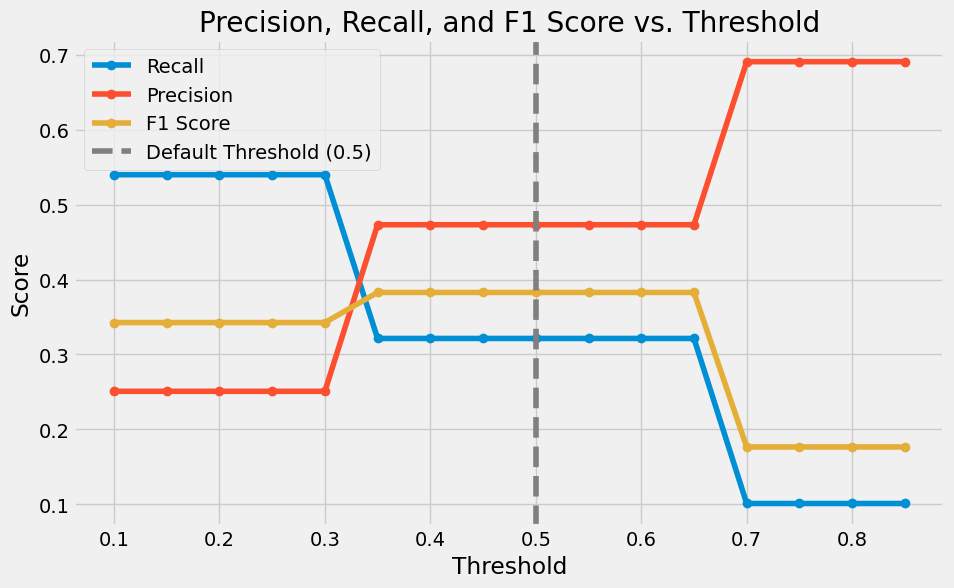


Best Threshold based on F1 Score: 0.35
Threshold    0.350000
Accuracy     0.882125
Precision    0.473008
Recall       0.321397
F1 Score     0.382735
ROC-AUC      0.688721
Name: 5, dtype: float64

Final Evaluation Metrics at Best Threshold:
Accuracy: 0.8821
Precision: 0.4730
Recall: 0.3214
F1 Score: 0.3827
ROC-AUC Score: 0.6887


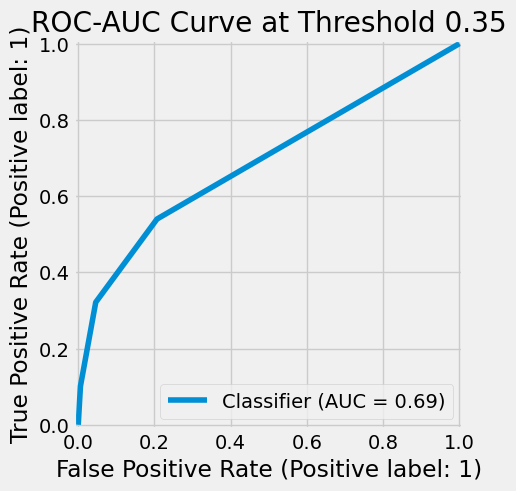

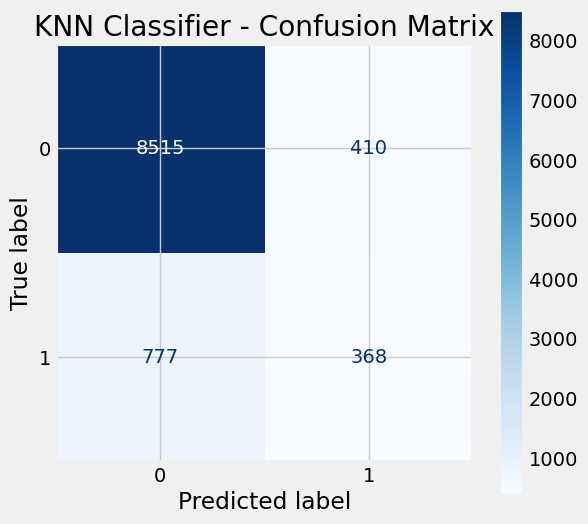


Results DataFrame:

Training set shape: (23495, 19)


In [746]:
# Step 1: Define KNN model pipeline
knn_pipe = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ("knn", KNeighborsClassifier())
])

# Step 2: Hyperparameter tuning using GridSearchCV
param_grid = {
    'feature_selection__k': [5, 10, 15],
    'knn__n_neighbors': [3, 5, 7, 9, 15],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

grid_search = GridSearchCV(knn_pipe, param_grid, cv=5, scoring='recall', n_jobs=-1, verbose=1)

# Step 3: Fit the Pipeline and calculate training time
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after hyperparameter tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")
print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")

# Step 4: Make Predictions
y_pred_proba = best_model.predict_proba(X_test)[:, 1]

# Step 5: Threshold tuning
thresholds = np.arange(0.1, 0.9, 0.05)
metrics = []

print("\nThreshold | Accuracy | Precision | Recall | F1 Score")
print("-" * 50)
for t in thresholds:
    y_pred_thresh = (y_pred_proba >= t).astype(int)
    accuracy = accuracy_score(y_test, y_pred_thresh)
    precision = precision_score(y_test, y_pred_thresh, zero_division=0)
    recall = recall_score(y_test, y_pred_thresh, zero_division=0)
    f1 = f1_score(y_test, y_pred_thresh, zero_division=0)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    metrics.append([t, accuracy, precision, recall, f1, roc_auc])
    print(f"{t:.2f}      | {accuracy:.4f}   | {precision:.4f}   | {recall:.4f} | {f1:.4f}")

# Convert to DataFrame for analysis
threshold_df = pd.DataFrame(metrics, columns=['Threshold', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])

# Plot Recall, Precision, and F1 Score against Threshold
plt.figure(figsize=(10, 6))
plt.plot(threshold_df['Threshold'], threshold_df['Recall'], label='Recall', marker='o')
plt.plot(threshold_df['Threshold'], threshold_df['Precision'], label='Precision', marker='o')
plt.plot(threshold_df['Threshold'], threshold_df['F1 Score'], label='F1 Score', marker='o')
plt.axvline(x=0.5, color='gray', linestyle='--', label='Default Threshold (0.5)')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision, Recall, and F1 Score vs. Threshold")
plt.legend()
plt.grid(True)
plt.show()

# Identify the best threshold (based on F1 Score)
best_threshold_row = threshold_df.loc[threshold_df['F1 Score'].idxmax()]
best_threshold = best_threshold_row['Threshold']
print(f"\nBest Threshold based on F1 Score: {best_threshold:.2f}")
print(best_threshold_row)

# Final Predictions using the best threshold
y_pred_final = (y_pred_proba >= best_threshold).astype(int)
final_accuracy = accuracy_score(y_test, y_pred_final)
final_precision = precision_score(y_test, y_pred_final, zero_division=0)
final_recall = recall_score(y_test, y_pred_final, zero_division=0)
final_f1 = f1_score(y_test, y_pred_final, zero_division=0)
final_roc_auc = roc_auc_score(y_test, y_pred_proba)

# Final Evaluation Results
print("\nFinal Evaluation Metrics at Best Threshold:")
print(f"Accuracy: {final_accuracy:.4f}")
print(f"Precision: {final_precision:.4f}")
print(f"Recall: {final_recall:.4f}")
print(f"F1 Score: {final_f1:.4f}")
print(f"ROC-AUC Score: {final_roc_auc:.4f}")

RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title(f"ROC-AUC Curve at Threshold {best_threshold:.2f}")
plt.show()

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred_final)
disp_svm = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("KNN Classifier - Confusion Matrix")
plt.show()

# Step 6: Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'KNN Fine Tuned - SelectKBest - Best Threshold',
    best_model.score(X_train, y_train),
    final_accuracy,
    final_precision,
    final_recall,
    final_f1,
    train_time,
    final_roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

# Output training set shape for reference
print(f"\nTraining set shape: {X_train.shape}")

In [747]:
results_df

,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."


### KNN - Best params - MinMaxScaler

Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best Parameters: {'feature_selection__k': 10, 'knn__metric': 'manhattan', 'knn__n_neighbors': 5, 'knn__weights': 'uniform'}
Test Accuracy: 0.8922

Threshold | Accuracy | Precision | Recall | F1 Score
--------------------------------------------------
0.10      | 0.6766   | 0.2118   | 0.6777 | 0.3227
0.15      | 0.6766   | 0.2118   | 0.6777 | 0.3227
0.20      | 0.8862   | 0.4995   | 0.4009 | 0.4448
0.25      | 0.8862   | 0.4995   | 0.4009 | 0.4448
0.30      | 0.8862   | 0.4995   | 0.4009 | 0.4448
0.35      | 0.8862   | 0.4995   | 0.4009 | 0.4448
0.40      | 0.8922   | 0.5511   | 0.2777 | 0.3693
0.45      | 0.8922   | 0.5511   | 0.2777 | 0.3693
0.50      | 0.8922   | 0.5511   | 0.2777 | 0.3693
0.55      | 0.8922   | 0.5511   | 0.2777 | 0.3693
0.60      | 0.8960   | 0.6433   | 0.1921 | 0.2959
0.65      | 0.8960   | 0.6433   | 0.1921 | 0.2959
0.70      | 0.8960   | 0.6433   | 0.1921 | 0.2959
0.75      | 0.8960   | 0.6433   | 0.1

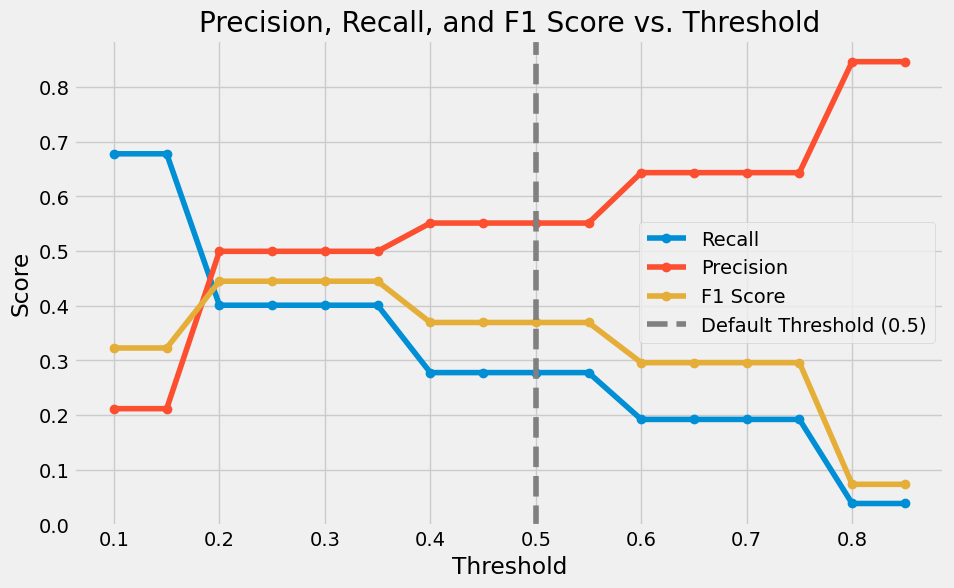


Best Threshold based on F1 Score: 0.20
Threshold    0.200000
Accuracy     0.886197
Precision    0.499456
Recall       0.400873
F1 Score     0.444767
ROC-AUC      0.726872
Name: 2, dtype: float64

Final Evaluation Metrics at Best Threshold:
Accuracy: 0.8862
Precision: 0.4995
Recall: 0.4009
F1 Score: 0.4448
ROC-AUC Score: 0.7269


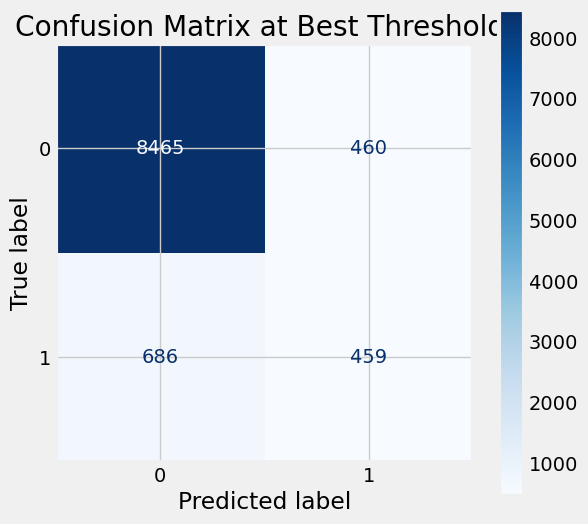

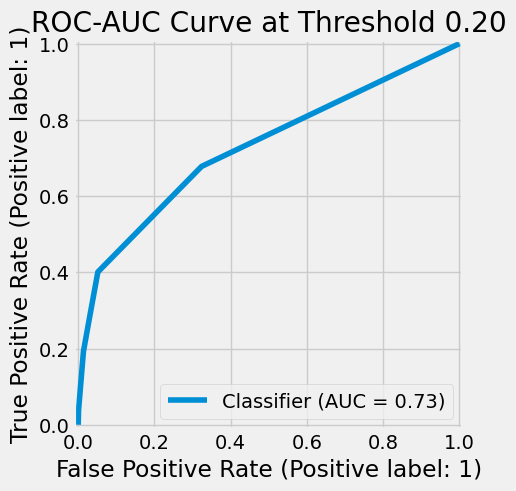


Results DataFrame:

Training set shape: (23495, 19)


In [749]:
# Define transformers for preprocessing using MinMaxScaler
numerical_transformer = Pipeline(steps=[
    ('imputer', numerical_imputer),
    ('scaler', MinMaxScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', categorical_imputer),
    ('encoder', OneHotEncoder(handle_unknown="ignore"))
])

# Combine transformations
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

# Step 1: Define KNN model pipeline
knn_pipe = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ("knn", KNeighborsClassifier())
])

# Step 2: Hyperparameter tuning using GridSearchCV
param_grid = {
    'feature_selection__k': [5, 10, 15],
    'knn__n_neighbors': [3, 5, 7, 9, 15],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

grid_search = GridSearchCV(knn_pipe, param_grid, cv=5, scoring='recall', n_jobs=-1, verbose=1)

# Step 3: Fit the Pipeline and calculate training time
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after hyperparameter tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")
print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")

# Step 4: Make Predictions
y_pred_proba = best_model.predict_proba(X_test)[:, 1]

# Step 5: Threshold tuning
thresholds = np.arange(0.1, 0.9, 0.05)
metrics = []

print("\nThreshold | Accuracy | Precision | Recall | F1 Score")
print("-" * 50)
for t in thresholds:
    y_pred_thresh = (y_pred_proba >= t).astype(int)
    accuracy = accuracy_score(y_test, y_pred_thresh)
    precision = precision_score(y_test, y_pred_thresh, zero_division=0)
    recall = recall_score(y_test, y_pred_thresh, zero_division=0)
    f1 = f1_score(y_test, y_pred_thresh, zero_division=0)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    metrics.append([t, accuracy, precision, recall, f1, roc_auc])
    print(f"{t:.2f}      | {accuracy:.4f}   | {precision:.4f}   | {recall:.4f} | {f1:.4f}")

# Convert to DataFrame for analysis
threshold_df = pd.DataFrame(metrics, columns=['Threshold', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC-AUC'])

# Plot Recall, Precision, and F1 Score against Threshold
plt.figure(figsize=(10, 6))
plt.plot(threshold_df['Threshold'], threshold_df['Recall'], label='Recall', marker='o')
plt.plot(threshold_df['Threshold'], threshold_df['Precision'], label='Precision', marker='o')
plt.plot(threshold_df['Threshold'], threshold_df['F1 Score'], label='F1 Score', marker='o')
plt.axvline(x=0.5, color='gray', linestyle='--', label='Default Threshold (0.5)')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision, Recall, and F1 Score vs. Threshold")
plt.legend()
plt.grid(True)
plt.show()

# Identify the best threshold (based on F1 Score)
best_threshold_row = threshold_df.loc[threshold_df['F1 Score'].idxmax()]
best_threshold = best_threshold_row['Threshold']
print(f"\nBest Threshold based on F1 Score: {best_threshold:.2f}")
print(best_threshold_row)

# Final Predictions using the best threshold
y_pred_final = (y_pred_proba >= best_threshold).astype(int)
final_accuracy = accuracy_score(y_test, y_pred_final)
final_precision = precision_score(y_test, y_pred_final, zero_division=0)
final_recall = recall_score(y_test, y_pred_final, zero_division=0)
final_f1 = f1_score(y_test, y_pred_final, zero_division=0)
final_roc_auc = roc_auc_score(y_test, y_pred_proba)

# Final Evaluation Results
print("\nFinal Evaluation Metrics at Best Threshold:")
print(f"Accuracy: {final_accuracy:.4f}")
print(f"Precision: {final_precision:.4f}")
print(f"Recall: {final_recall:.4f}")
print(f"F1 Score: {final_f1:.4f}")
print(f"ROC-AUC Score: {final_roc_auc:.4f}")

# Confusion Matrix at Best Threshold

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred_final)
disp_svm = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Confusion Matrix at Best Threshold:")
plt.show()

RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title(f"ROC-AUC Curve at Threshold {best_threshold:.2f}")
plt.show()

# Step 6: Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'KNN Fine Tuned - SelectKBest,Best Threshold,MinMaxScaler',
    best_model.score(X_train, y_train),
    final_accuracy,
    final_precision,
    final_recall,
    final_f1,
    train_time,
    final_roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

# Output training set shape for reference
print(f"\nTraining set shape: {X_train.shape}")

In [750]:
results_df

,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."


### Logistic Regression

### Logistic Regression - Hyperparameter tuning

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best Parameters: {'classifier__C': 10, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}
Test Accuracy: 0.8979


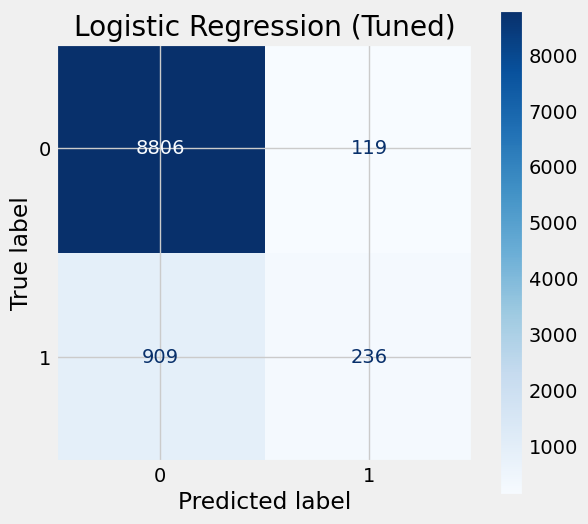


Classification Report:

              precision    recall  f1-score   support

           0       0.91      0.99      0.94      8925
           1       0.66      0.21      0.31      1145

    accuracy                           0.90     10070
   macro avg       0.79      0.60      0.63     10070
weighted avg       0.88      0.90      0.87     10070

Train Accuracy: 0.8992
Test Accuracy: 0.8979
Precision: 0.6648
Recall: 0.2061
F1 Score: 0.3147
ROC-AUC Score: 0.7643


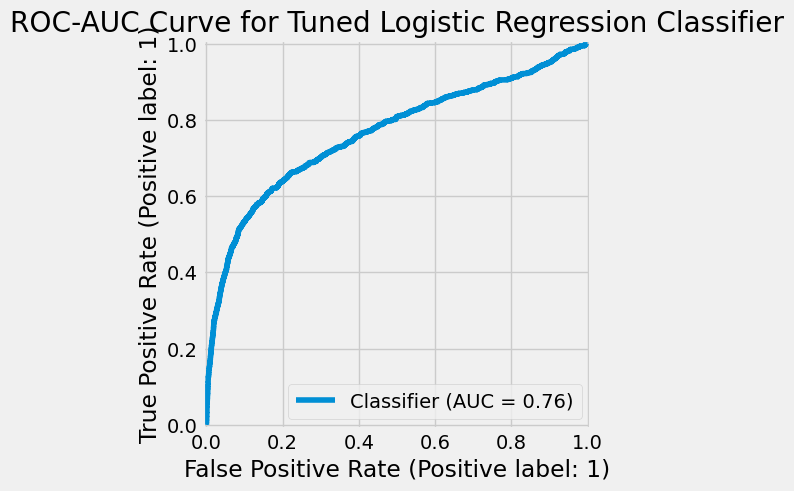

Training set shape: (23495, 19)

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.899213,0.897915,0.664789,0.206114,0.314667,31.668682,0.764328,"{'classifier__C': 10, 'classifier__penalty': '..."


In [753]:
# Define pipeline with Logistic Regression
pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("classifier", LogisticRegression())
])

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'classifier__C': [0.01, 0.1, 1, 10],
    'classifier__penalty': ['l1', 'l2'],
    'classifier__solver': ['liblinear', 'saga']
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='recall', n_jobs=-1, verbose=1)

# Train the model Fine Tuned
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")
print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")

# Make predictions
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Generate and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_numeric = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(6, 6))
disp_numeric.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Logistic Regression (Tuned)")
plt.show()

# Calculate key metrics
train_accuracy = best_model.score(X_train, y_train)
test_accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print all evaluation metrics
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title("ROC-AUC Curve for Tuned Logistic Regression Classifier")
plt.show()

# Output training set shape for reference
print(f"Training set shape: {X_train.shape}")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Logistic Regression Classifier Fine Tuned',
    train_accuracy,
    test_accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### Logistic Regression - Hyperparameter tuning and SelectKBest

Fitting 5 folds for each of 64 candidates, totalling 320 fits
Best Parameters: {'classifier__C': 10, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'feature_selection__k': 20}
Test Accuracy: 0.8958


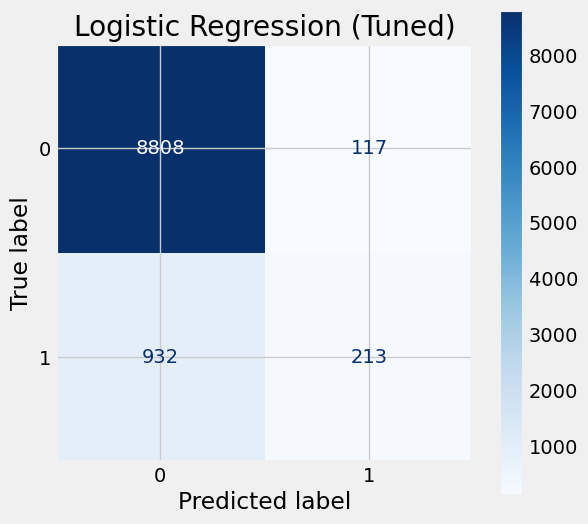


Classification Report:

              precision    recall  f1-score   support

           0       0.90      0.99      0.94      8925
           1       0.65      0.19      0.29      1145

    accuracy                           0.90     10070
   macro avg       0.77      0.59      0.62     10070
weighted avg       0.87      0.90      0.87     10070

Train Accuracy: 0.8993
Test Accuracy: 0.8958
Precision: 0.6455
Recall: 0.1860
F1 Score: 0.2888
ROC-AUC Score: 0.7653


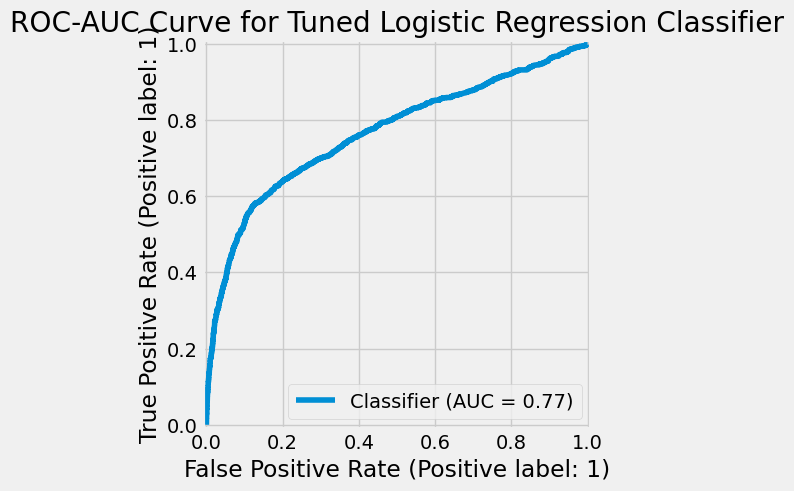

Training set shape: (23495, 19)

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.899213,0.897915,0.664789,0.206114,0.314667,31.668682,0.764328,"{'classifier__C': 10, 'classifier__penalty': '..."


In [755]:
# Define pipeline with Logistic Regression
pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("feature_selection", SelectKBest(score_func=f_classif)),
    ("classifier", LogisticRegression())
])

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'feature_selection__k': [5, 10, 15, 20],
    'classifier__C': [0.01, 0.1, 1, 10],
    'classifier__penalty': ['l1', 'l2'],
    'classifier__solver': ['liblinear', 'saga']
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='recall', n_jobs=-1, verbose=1)

# Train the model Fine Tuned
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")
print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")

# Make predictions
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Generate and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_numeric = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(6, 6))
disp_numeric.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Logistic Regression (Tuned)")
plt.show()

# Calculate key metrics
train_accuracy = best_model.score(X_train, y_train)
test_accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print all evaluation metrics
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title("ROC-AUC Curve for Tuned Logistic Regression Classifier")
plt.show()

# Output training set shape for reference
print(f"Training set shape: {X_train.shape}")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Logistic Regression Classifier Fine Tuned - SelectKBest',
    train_accuracy,
    test_accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### Logistic Regression - Hyperparameter tuning and SelectKBest, Class_weight=balanced

Fitting 5 folds for each of 64 candidates, totalling 320 fits
Best Parameters: {'classifier__C': 0.01, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'feature_selection__k': 5}
Test Accuracy: 0.7116


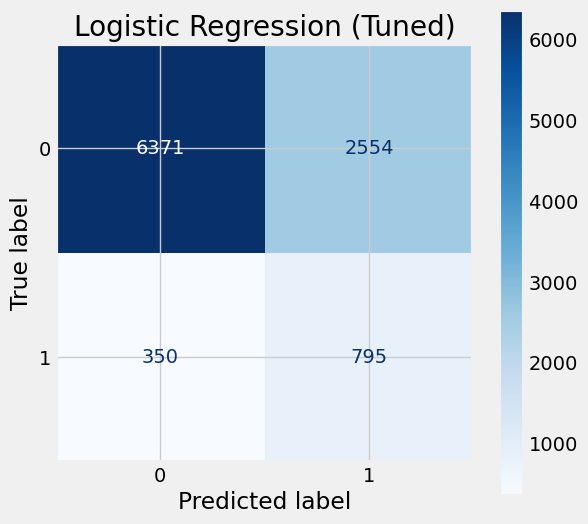


Classification Report:

              precision    recall  f1-score   support

           0       0.95      0.71      0.81      8925
           1       0.24      0.69      0.35      1145

    accuracy                           0.71     10070
   macro avg       0.59      0.70      0.58     10070
weighted avg       0.87      0.71      0.76     10070

Train Accuracy: 0.7125
Test Accuracy: 0.7116
Precision: 0.2374
Recall: 0.6943
F1 Score: 0.3538
ROC-AUC Score: 0.7421


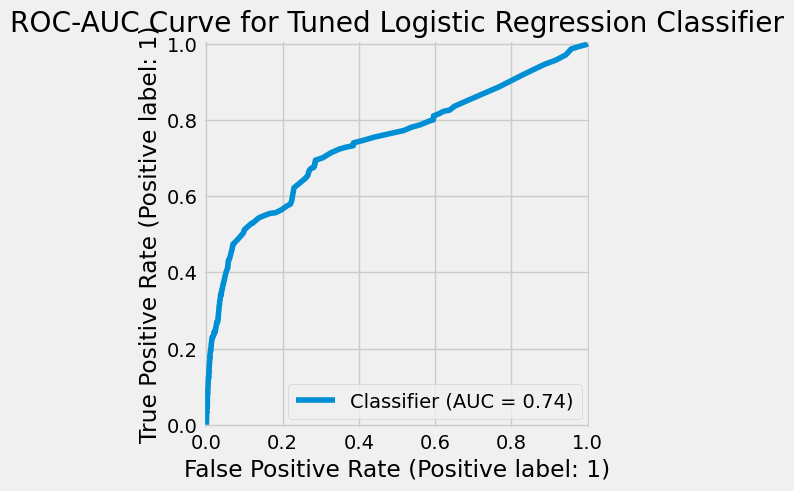

Training set shape: (23495, 19)

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.899213,0.897915,0.664789,0.206114,0.314667,31.668682,0.764328,"{'classifier__C': 10, 'classifier__penalty': '..."


In [757]:
# Define pipeline with Logistic Regression
pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("feature_selection", SelectKBest(score_func=f_classif)),
    ("classifier", LogisticRegression(class_weight='balanced', max_iter=500))
])

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'feature_selection__k': [5, 10, 15, 20],
    'classifier__C': [0.01, 0.1, 1, 10],
    'classifier__penalty': ['l1', 'l2'],
    'classifier__solver': ['liblinear', 'saga']
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='recall', n_jobs=-1, verbose=1)

# Train the model Fine Tuned
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")
print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")

# Make predictions
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Generate and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_numeric = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(6, 6))
disp_numeric.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Logistic Regression (Tuned)")
plt.show()

# Calculate key metrics
train_accuracy = best_model.score(X_train, y_train)
test_accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print all evaluation metrics
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title("ROC-AUC Curve for Tuned Logistic Regression Classifier")
plt.show()

# Output training set shape for reference
print(f"Training set shape: {X_train.shape}")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Logistic Regression Classifier Fine Tuned - SelectKBest,class_weight="balanced"',
    train_accuracy,
    test_accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df


 Top Positive Coefficients:
                  Feature  Coefficient
3   num__pdays_contacted     1.061207
4  cat__poutcome_success     0.199502
0      num__emp_var_rate     0.000000
1         num__euribor3m    -0.837151
2       num__nr_employed    -1.214834

 Top Negative Coefficients:
                  Feature  Coefficient
3   num__pdays_contacted     1.061207
4  cat__poutcome_success     0.199502
0      num__emp_var_rate     0.000000
1         num__euribor3m    -0.837151
2       num__nr_employed    -1.214834


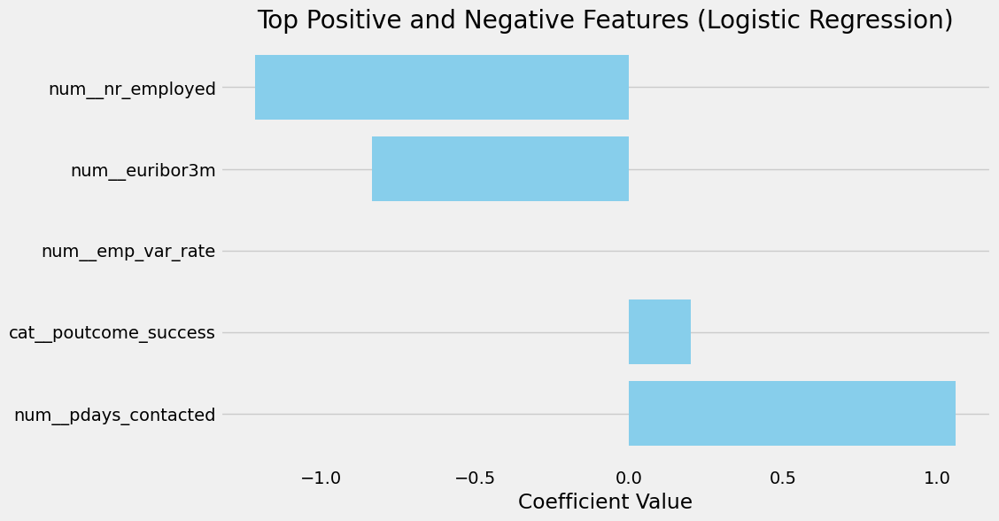

In [758]:
# ============================
# DISPLAY TOP COEFFICIENTS
# ============================

# Extract logistic regression model and feature names
logistic_model = best_model.named_steps['classifier']
preprocessor = best_model.named_steps['preprocessor']
feature_selector = best_model.named_steps['feature_selection']

# Get feature names after preprocessing
feature_names = preprocessor.get_feature_names_out()

# Apply feature selection mask (SelectKBest)
support_mask = feature_selector.get_support()
selected_features = np.array(feature_names)[support_mask]

# Extract coefficients
coefficients = logistic_model.coef_.flatten()

# Create DataFrame for feature importance
coef_df = pd.DataFrame({'Feature': selected_features, 'Coefficient': coefficients})
coef_df = coef_df.sort_values(by='Coefficient', ascending=False)

# Display top positive and negative coefficients
print("\n Top Positive Coefficients:\n", coef_df.head(10))
print("\n Top Negative Coefficients:\n", coef_df.tail(10))

# Optional Visualization
top_features = pd.concat([coef_df.head(10), coef_df.tail(10)])

plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'], top_features['Coefficient'], color='skyblue')
plt.xlabel("Coefficient Value")
plt.title("Top Positive and Negative Features (Logistic Regression)")
plt.grid(axis='x')
plt.show()


### Logistic Regression - Best params - MinMaxScaler

Fitting 5 folds for each of 64 candidates, totalling 320 fits
Best Parameters: {'classifier__C': 0.01, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'feature_selection__k': 5}
Test Accuracy: 0.7116


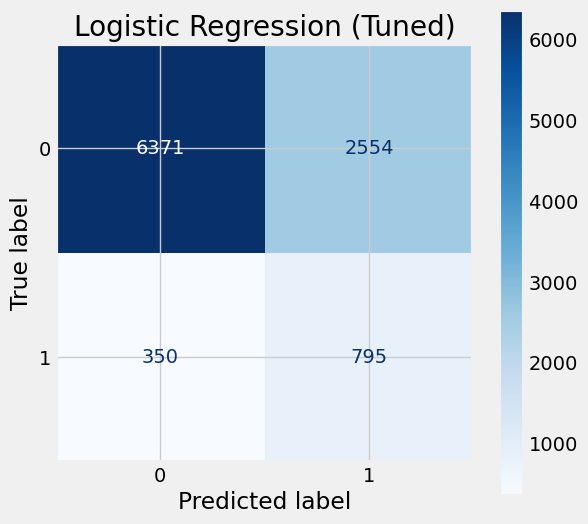


Classification Report:

              precision    recall  f1-score   support

           0       0.95      0.71      0.81      8925
           1       0.24      0.69      0.35      1145

    accuracy                           0.71     10070
   macro avg       0.59      0.70      0.58     10070
weighted avg       0.87      0.71      0.76     10070

Train Accuracy: 0.7125
Test Accuracy: 0.7116
Precision: 0.2374
Recall: 0.6943
F1 Score: 0.3538
ROC-AUC Score: 0.7421


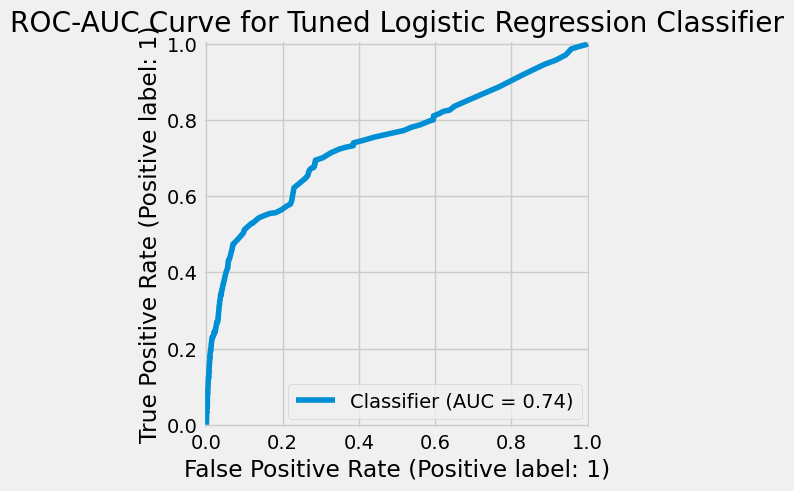

Training set shape: (23495, 19)

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.899213,0.897915,0.664789,0.206114,0.314667,31.668682,0.764328,"{'classifier__C': 10, 'classifier__penalty': '..."


In [760]:
# Define transformers for preprocessing using MinMaxScaler
numerical_transformer = Pipeline(steps=[
    ('imputer', numerical_imputer),
    ('scaler', MinMaxScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', categorical_imputer),
    ('encoder', OneHotEncoder(handle_unknown="ignore"))
])

# Combine transformations
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

# Define pipeline with Logistic Regression
pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor),
    ("feature_selection", SelectKBest(score_func=f_classif)),
    ("classifier", LogisticRegression(class_weight='balanced', max_iter=500))
])

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'feature_selection__k': [5, 10, 15, 20],
    'classifier__C': [0.01, 0.1, 1, 10],
    'classifier__penalty': ['l1', 'l2'],
    'classifier__solver': ['liblinear', 'saga']
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='recall', n_jobs=-1, verbose=1)

# Train the model Fine Tuned
start_train_time = time.time()
grid_search.fit(X_train, y_train)
train_time = time.time() - start_train_time

# Best estimator after tuning
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")
print(f"Test Accuracy: {best_model.score(X_test, y_test):.4f}")

# Make predictions
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]  # Probability estimates for ROC-AUC

# Generate and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp_numeric = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(6, 6))
disp_numeric.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Logistic Regression (Tuned)")
plt.show()

# Calculate key metrics
train_accuracy = best_model.score(X_train, y_train)
test_accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# Print all evaluation metrics
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))
print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc:.4f}")

# Plot ROC-AUC Curve
RocCurveDisplay.from_predictions(y_test, y_pred_proba)
plt.title("ROC-AUC Curve for Tuned Logistic Regression Classifier")
plt.show()

# Output training set shape for reference
print(f"Training set shape: {X_train.shape}")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Logistic Regression Classifier Fine Tuned - SelectKBest,class_weight="balanced",MinMaxScaler',
    train_accuracy,
    test_accuracy,
    precision,
    recall,
    f1,
    train_time,
    roc_auc,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

## Decision Tree

### Decision Tree - Hyperparameter tuning

Fitting 5 folds for each of 54 candidates, totalling 270 fits

Classification Report (Decision Tree - Tuned):

              precision    recall  f1-score   support

           0       0.91      0.96      0.94      8925
           1       0.47      0.27      0.34      1145

    accuracy                           0.88     10070
   macro avg       0.69      0.61      0.64     10070
weighted avg       0.86      0.88      0.87     10070



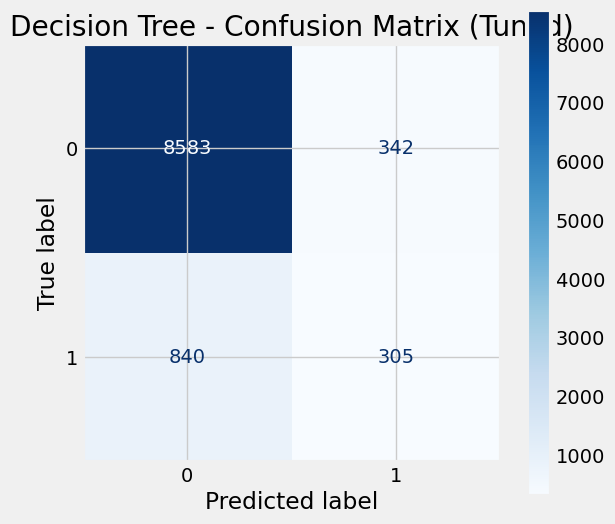

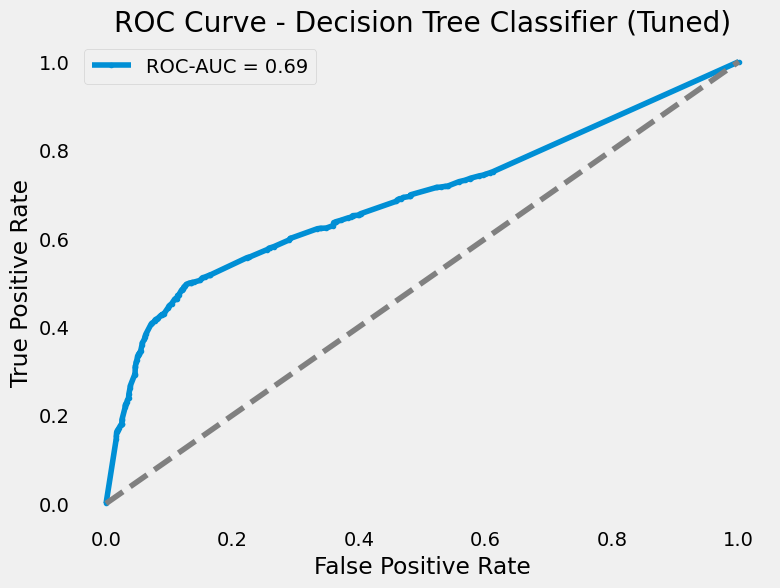

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 15, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 10}
Training Accuracy: 0.9291
Test Accuracy: 0.8826
Precision: 0.4714
Recall: 0.2664
F1 Score: 0.3404
ROC-AUC Score: 0.6892
Depth of Best Tree: 15
Training Time: 28.34 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.899213,0.897915,0.664789,0.206114,0.314667,31.668682,0.764328,"{'classifier__C': 10, 'classifier__penalty': '..."


In [763]:
# Define pipeline with preprocessing and Decision Tree
pipeline_dt = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier(random_state=42))
])

# Define hyperparameter grid for tuning
param_grid = {
    "classifier__max_depth": [5, 10, 15],
    "classifier__min_samples_split": [2, 5, 10],
    "classifier__min_samples_leaf": [1, 2, 5],
    "classifier__criterion": ["gini", "entropy"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search = GridSearchCV(pipeline_dt, param_grid, cv=5, scoring="recall", n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline = grid_search.best_estimator_
best_params = grid_search.best_params_

# Evaluate the best model
y_pred_best = best_pipeline.predict(X_test)
y_pred_proba_best = best_pipeline.predict_proba(X_test)[:, 1]
train_acc = best_pipeline.score(X_train, y_train)
test_acc = best_pipeline.score(X_test, y_test)
precision = precision_score(y_test, y_pred_best, zero_division=0)
recall = recall_score(y_test, y_pred_best, zero_division=0)
f1 = f1_score(y_test, y_pred_best, zero_division=0)
roc_auc_best = roc_auc_score(y_test, y_pred_proba_best)
depth_best = best_pipeline.named_steps['classifier'].get_depth()

# Classification report
print("\nClassification Report (Decision Tree - Tuned):\n")
print(classification_report(y_test, y_pred_best))

# Confusion matrix
cm_best = confusion_matrix(y_test, y_pred_best)
disp_best = ConfusionMatrixDisplay(confusion_matrix=cm_best, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Decision Tree - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best, tpr_best, _ = roc_curve(y_test, y_pred_proba_best)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best, tpr_best, marker='.', label=f"ROC-AUC = {roc_auc_best:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Decision Tree Classifier (Tuned)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params}")
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc_best:.4f}")
print(f"Depth of Best Tree: {depth_best}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Decision Tree Fine Tuned',
    train_acc,
    test_acc,
    precision,
    recall,
    f1,
    fit_time,
    roc_auc_best,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

#### Feature importance


 Top 10 Most Important Features:

                  Feature  Importance
10       num__nr_employed    0.292108
0                num__age    0.140296
9          num__euribor3m    0.116260
8      num__cons_conf_idx    0.062138
5           num__campaign    0.048076
4        num__day_of_week    0.041590
40  cat__poutcome_success    0.031620
7     num__cons_price_idx    0.028079
14   cat__job_blue-collar    0.013464
2               num__loan    0.013322


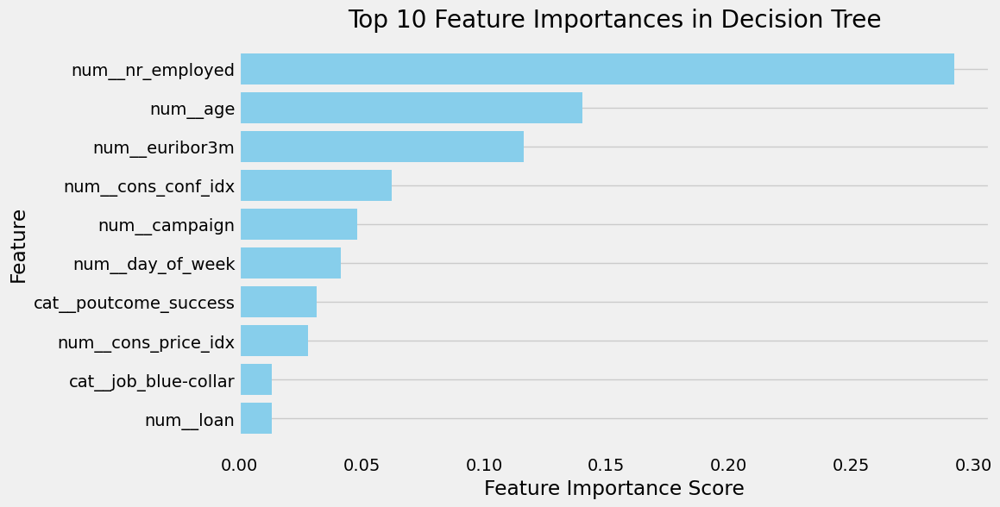

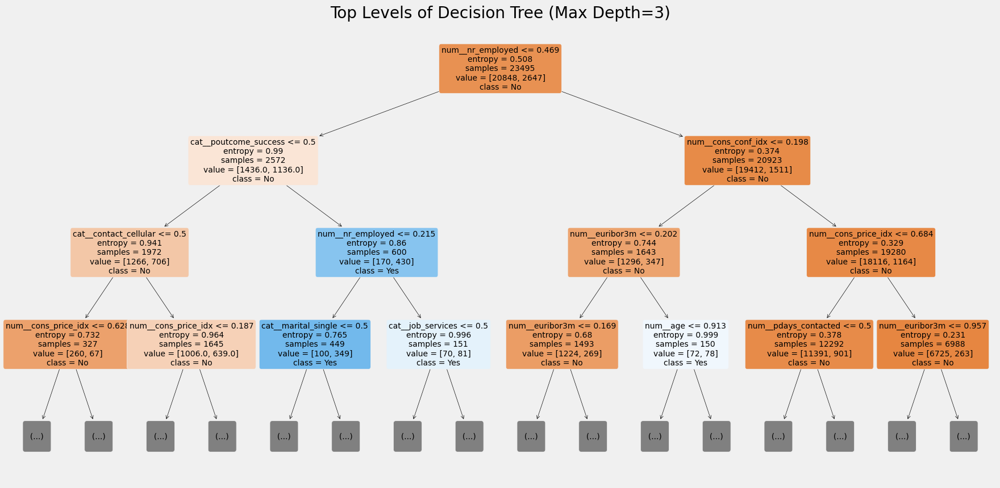

In [765]:
# Extract feature importance
dt_model = best_pipeline.named_steps['classifier']
feature_names = best_pipeline.named_steps['preprocessor'].get_feature_names_out()

importances = dt_model.feature_importances_
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Display top 10 most important features
print("\n Top 10 Most Important Features:\n")
print(importance_df.head(10))

# Plot top 10 feature importances
plt.figure(figsize=(10, 6))
plt.barh(importance_df.head(10)['Feature'], importance_df.head(10)['Importance'], color='skyblue')
plt.xlabel('Feature Importance Score')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances in Decision Tree')
plt.gca().invert_yaxis()
plt.grid(axis='x')
plt.show()

# Visualize the top levels of the decision tree
plt.figure(figsize=(20, 10))
plot_tree(
    dt_model,
    feature_names=feature_names,
    class_names=["No", "Yes"],
    filled=True,
    rounded=True,
    fontsize=10,
    max_depth=3  # Limit depth for clearer visualization
)
plt.title("Top Levels of Decision Tree (Max Depth=3)")
plt.show()

### Decision Tree - Hyperparameter tuning and SelectKBest

Fitting 5 folds for each of 162 candidates, totalling 810 fits

Classification Report (Decision Tree - Tuned):

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      8925
           1       0.58      0.28      0.37      1145

    accuracy                           0.90     10070
   macro avg       0.75      0.62      0.66     10070
weighted avg       0.88      0.90      0.88     10070



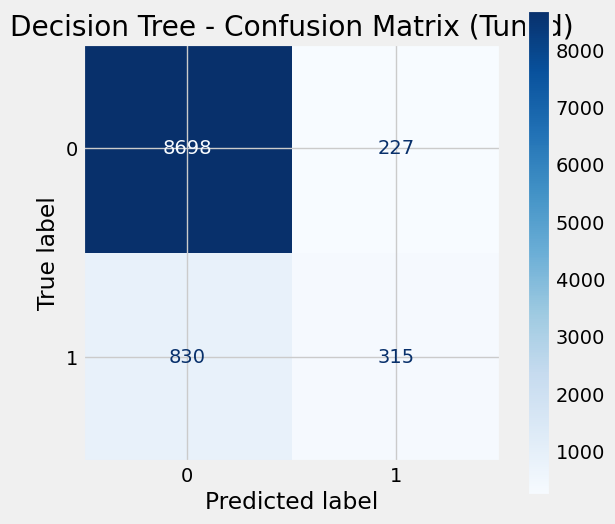

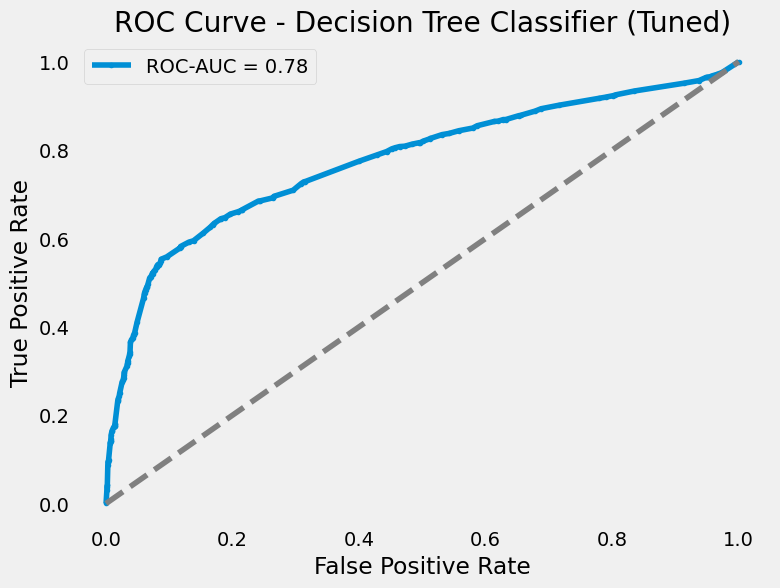

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 10, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 10, 'feature_selection__k': 10}
Training Accuracy: 0.9070
Test Accuracy: 0.8950
Precision: 0.5812
Recall: 0.2751
F1 Score: 0.3734
ROC-AUC Score: 0.7759
Depth of Best Tree: 10
Training Time: 63.53 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.899213,0.897915,0.664789,0.206114,0.314667,31.668682,0.764328,"{'classifier__C': 10, 'classifier__penalty': '..."


In [767]:
# Define pipeline with preprocessing and Decision Tree
pipeline_dt = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ('classifier', DecisionTreeClassifier(random_state=42))
])

# Define hyperparameter grid for tuning
param_grid = {
    "feature_selection__k": [5, 10, 15],
    "classifier__max_depth": [5, 10, 15],
    "classifier__min_samples_split": [2, 5, 10],
    "classifier__min_samples_leaf": [1, 2, 5],
    "classifier__criterion": ["gini", "entropy"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search = GridSearchCV(pipeline_dt, param_grid, cv=5, scoring="recall", n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline = grid_search.best_estimator_
best_params = grid_search.best_params_

# Evaluate the best model
y_pred_best = best_pipeline.predict(X_test)
y_pred_proba_best = best_pipeline.predict_proba(X_test)[:, 1]
train_acc = best_pipeline.score(X_train, y_train)
test_acc = best_pipeline.score(X_test, y_test)
precision = precision_score(y_test, y_pred_best, zero_division=0)
recall = recall_score(y_test, y_pred_best, zero_division=0)
f1 = f1_score(y_test, y_pred_best, zero_division=0)
roc_auc_best = roc_auc_score(y_test, y_pred_proba_best)
depth_best = best_pipeline.named_steps['classifier'].get_depth()

# Classification report
print("\nClassification Report (Decision Tree - Tuned):\n")
print(classification_report(y_test, y_pred_best))

# Confusion matrix
cm_best = confusion_matrix(y_test, y_pred_best)
disp_best = ConfusionMatrixDisplay(confusion_matrix=cm_best, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Decision Tree - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best, tpr_best, _ = roc_curve(y_test, y_pred_proba_best)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best, tpr_best, marker='.', label=f"ROC-AUC = {roc_auc_best:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Decision Tree Classifier (Tuned)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params}")
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc_best:.4f}")
print(f"Depth of Best Tree: {depth_best}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Decision Tree Fine Tuned - SelectKBest',
    train_acc,
    test_acc,
    precision,
    recall,
    f1,
    fit_time,
    roc_auc_best,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### Feature Importance

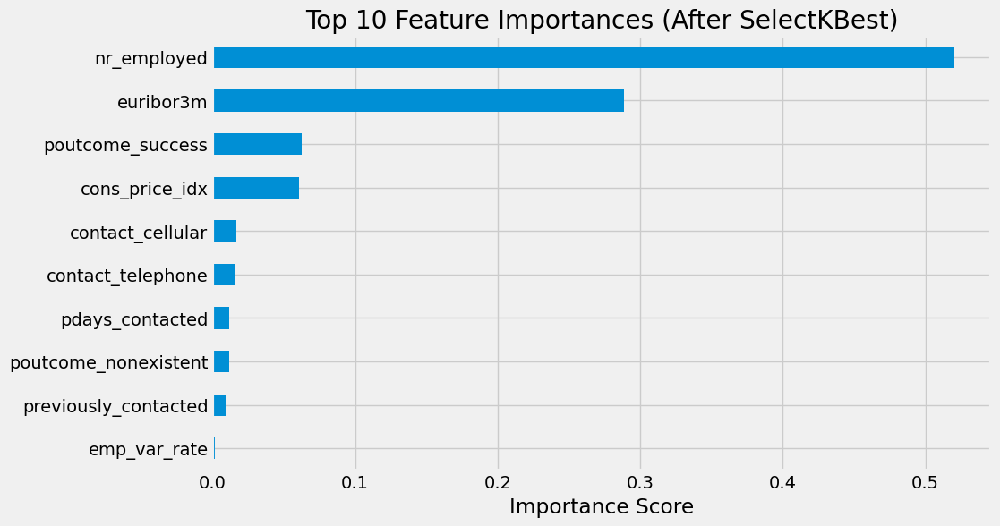

In [769]:
# Retrieve feature names after preprocessing
feature_names = numerical_cols + list(
    best_pipeline.named_steps['preprocessor']
    .transformers_[1][1].named_steps['encoder']
    .get_feature_names_out(categorical_cols)
)

# Get the mask of selected features from SelectKBest
selected_mask = best_pipeline.named_steps['feature_selection'].get_support()

# Filter feature names based on selected features
selected_feature_names = np.array(feature_names)[selected_mask]

# Retrieve feature importances
importances = best_pipeline.named_steps['classifier'].feature_importances_

# Create a DataFrame/Series for visualization
feat_importances = pd.Series(importances, index=selected_feature_names).sort_values(ascending=False)

# Plot top 10 feature importances
plt.figure(figsize=(10, 6))
feat_importances.head(10).plot(kind='barh')
plt.title("Top 10 Feature Importances (After SelectKBest)")
plt.xlabel("Importance Score")
plt.gca().invert_yaxis()
plt.show()

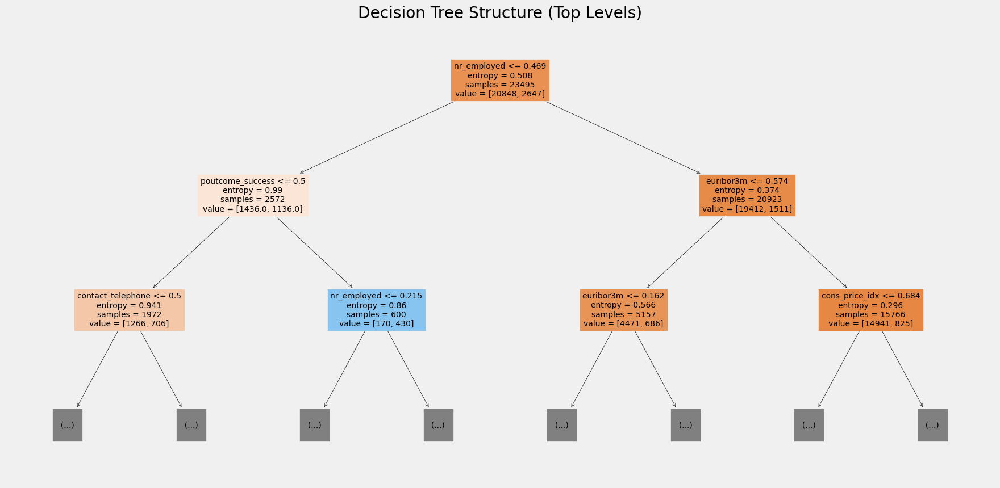

In [770]:
# Plot the tree structure
plt.figure(figsize=(20, 10))
plot_tree(best_pipeline.named_steps['classifier'], filled=True, feature_names=selected_feature_names, max_depth=2, fontsize=10)
plt.title("Decision Tree Structure (Top Levels)")
plt.show()


### Decision Tree - Class_weight=balanced

Fitting 5 folds for each of 162 candidates, totalling 810 fits

Classification Report (Decision Tree - Tuned):

              precision    recall  f1-score   support

           0       0.95      0.82      0.88      8925
           1       0.31      0.64      0.42      1145

    accuracy                           0.80     10070
   macro avg       0.63      0.73      0.65     10070
weighted avg       0.87      0.80      0.83     10070



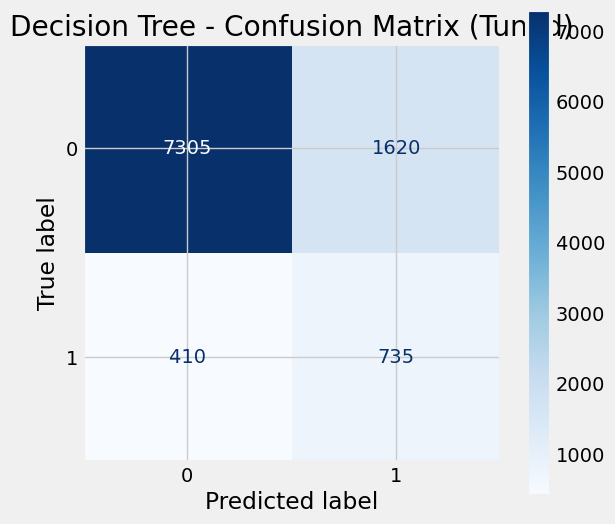

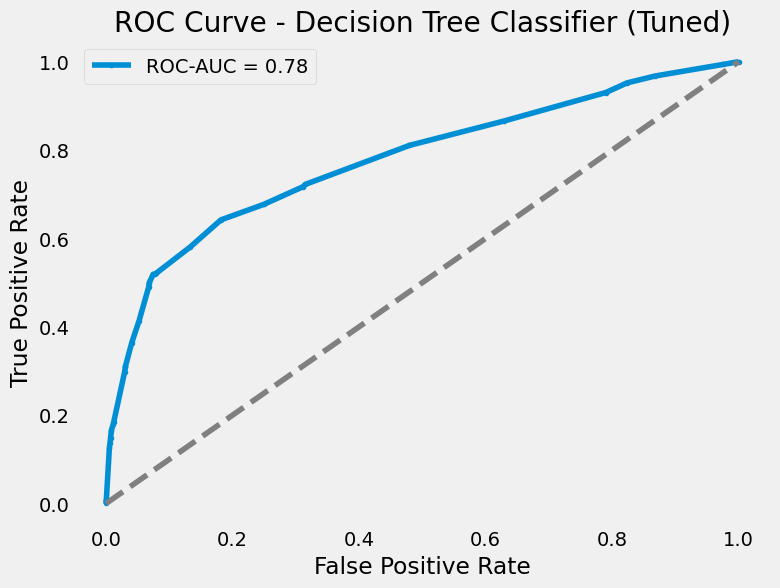

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 5, 'classifier__min_samples_split': 2, 'feature_selection__k': 10}
Training Accuracy: 0.7984
Test Accuracy: 0.7984
Precision: 0.3121
Recall: 0.6419
F1 Score: 0.4200
ROC-AUC Score: 0.7767
Depth of Best Tree: 5
Training Time: 67.75 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.899213,0.897915,0.664789,0.206114,0.314667,31.668682,0.764328,"{'classifier__C': 10, 'classifier__penalty': '..."


In [776]:
# Define pipeline with preprocessing and Decision Tree
pipeline_dt = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ('classifier', DecisionTreeClassifier(class_weight='balanced', random_state=42))
])

# Define hyperparameter grid for tuning
param_grid = {
    "feature_selection__k": [5, 10, 15],
    "classifier__max_depth": [5, 10, 15],
    "classifier__min_samples_split": [2, 5, 10],
    "classifier__min_samples_leaf": [1, 2, 5],
    "classifier__criterion": ["gini", "entropy"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search = GridSearchCV(pipeline_dt, param_grid, cv=5, scoring="recall", n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline = grid_search.best_estimator_
best_params = grid_search.best_params_

# Evaluate the best model
y_pred_best = best_pipeline.predict(X_test)
y_pred_proba_best = best_pipeline.predict_proba(X_test)[:, 1]
train_acc = best_pipeline.score(X_train, y_train)
test_acc = best_pipeline.score(X_test, y_test)
precision = precision_score(y_test, y_pred_best, zero_division=0)
recall = recall_score(y_test, y_pred_best, zero_division=0)
f1 = f1_score(y_test, y_pred_best, zero_division=0)
roc_auc_best = roc_auc_score(y_test, y_pred_proba_best)
depth_best = best_pipeline.named_steps['classifier'].get_depth()

# Classification report
print("\nClassification Report (Decision Tree - Tuned):\n")
print(classification_report(y_test, y_pred_best))

# Confusion matrix
cm_best = confusion_matrix(y_test, y_pred_best)
disp_best = ConfusionMatrixDisplay(confusion_matrix=cm_best, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Decision Tree - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best, tpr_best, _ = roc_curve(y_test, y_pred_proba_best)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best, tpr_best, marker='.', label=f"ROC-AUC = {roc_auc_best:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Decision Tree Classifier (Tuned)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params}")
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc_best:.4f}")
print(f"Depth of Best Tree: {depth_best}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Decision Tree Fine Tuned - SelectKBest,class_weight="balanced"',
    train_acc,
    test_acc,
    precision,
    recall,
    f1,
    fit_time,
    roc_auc_best,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

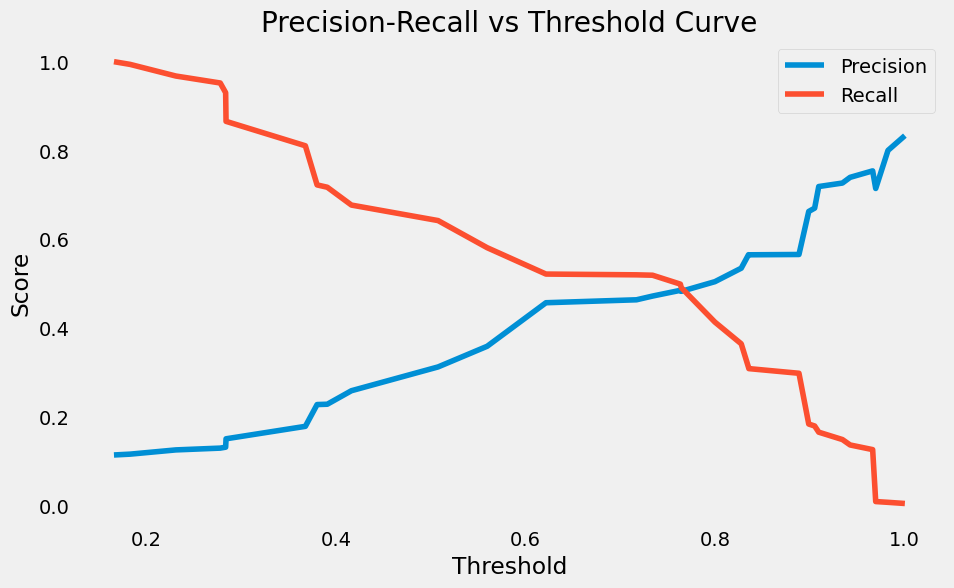

In [777]:
from sklearn.metrics import precision_recall_curve

# Threshold tuning for better balance
y_scores = best_pipeline.predict_proba(X_test)[:, 1]
precisions, recalls, thresholds = precision_recall_curve(y_test, y_scores)

plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions[:-1], label="Precision")
plt.plot(thresholds, recalls[:-1], label="Recall")
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall vs Threshold Curve")
plt.legend()
plt.grid()
plt.show()

### Decision Tree - Class_weight=balanced, MinMaxScaler

Fitting 5 folds for each of 162 candidates, totalling 810 fits

Classification Report (Decision Tree - Tuned):

              precision    recall  f1-score   support

           0       0.95      0.82      0.88      8925
           1       0.31      0.64      0.42      1145

    accuracy                           0.80     10070
   macro avg       0.63      0.73      0.65     10070
weighted avg       0.87      0.80      0.83     10070



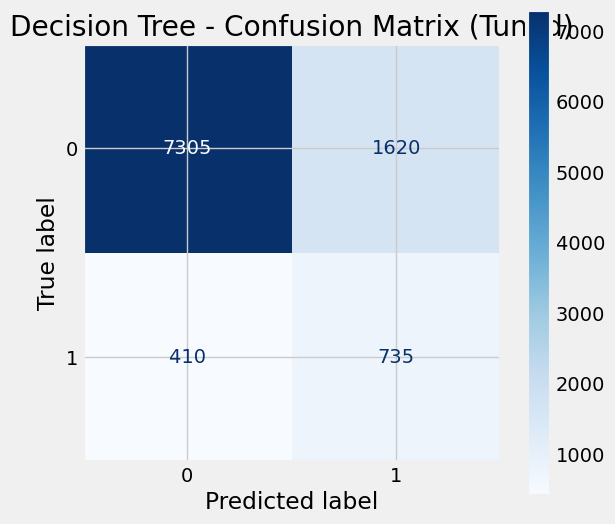

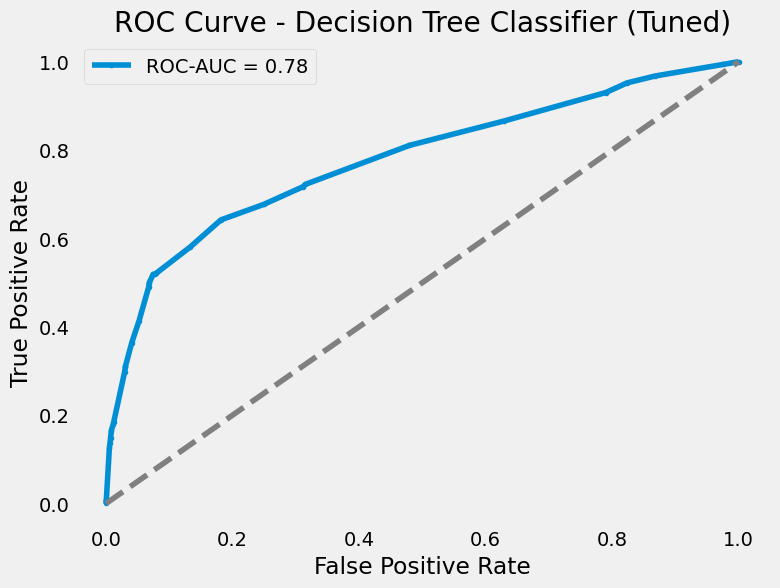

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 5, 'classifier__min_samples_split': 2, 'feature_selection__k': 10}
Training Accuracy: 0.7984
Test Accuracy: 0.7984
Precision: 0.3121
Recall: 0.6419
F1 Score: 0.4200
ROC-AUC Score: 0.7767
Depth of Best Tree: 5
Training Time: 71.54 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.899213,0.897915,0.664789,0.206114,0.314667,31.668682,0.764328,"{'classifier__C': 10, 'classifier__penalty': '..."


In [779]:
# Define transformers for preprocessing using MinMaxScaler
numerical_transformer = Pipeline(steps=[
    ('imputer', numerical_imputer),
    ('scaler', MinMaxScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', categorical_imputer),
    ('encoder', OneHotEncoder(handle_unknown="ignore"))
])

# Combine transformations
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

# Define pipeline with preprocessing and Decision Tree
pipeline_dt = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ('classifier', DecisionTreeClassifier(class_weight='balanced', random_state=42))
])

# Define hyperparameter grid for tuning
param_grid = {
    "feature_selection__k": [5, 10, 15],
    "classifier__max_depth": [5, 10, 15],
    "classifier__min_samples_split": [2, 5, 10],
    "classifier__min_samples_leaf": [1, 2, 5],
    "classifier__criterion": ["gini", "entropy"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search = GridSearchCV(pipeline_dt, param_grid, cv=5, scoring="recall", n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline = grid_search.best_estimator_
best_params = grid_search.best_params_

# Evaluate the best model
y_pred_best = best_pipeline.predict(X_test)
y_pred_proba_best = best_pipeline.predict_proba(X_test)[:, 1]
train_acc = best_pipeline.score(X_train, y_train)
test_acc = best_pipeline.score(X_test, y_test)
precision = precision_score(y_test, y_pred_best, zero_division=0)
recall = recall_score(y_test, y_pred_best, zero_division=0)
f1 = f1_score(y_test, y_pred_best, zero_division=0)
roc_auc_best = roc_auc_score(y_test, y_pred_proba_best)
depth_best = best_pipeline.named_steps['classifier'].get_depth()

# Classification report
print("\nClassification Report (Decision Tree - Tuned):\n")
print(classification_report(y_test, y_pred_best))

# Confusion matrix
cm_best = confusion_matrix(y_test, y_pred_best)
disp_best = ConfusionMatrixDisplay(confusion_matrix=cm_best, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("Decision Tree - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best, tpr_best, _ = roc_curve(y_test, y_pred_proba_best)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best, tpr_best, marker='.', label=f"ROC-AUC = {roc_auc_best:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Decision Tree Classifier (Tuned)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params}")
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC Score: {roc_auc_best:.4f}")
print(f"Depth of Best Tree: {depth_best}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'Decision Tree Fine Tuned - SelectKBest,class_weight="balanced",MinMaxScaler',
    train_acc,
    test_acc,
    precision,
    recall,
    f1,
    fit_time,
    roc_auc_best,
    best_params
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

## SVM

### SVM - Hyperparamter tuning

Fitting 5 folds for each of 4 candidates, totalling 20 fits

Classification Report (SVM - Tuned):

              precision    recall  f1-score   support

           0       0.91      0.99      0.94      8925
           1       0.67      0.19      0.30      1145

    accuracy                           0.90     10070
   macro avg       0.79      0.59      0.62     10070
weighted avg       0.88      0.90      0.87     10070



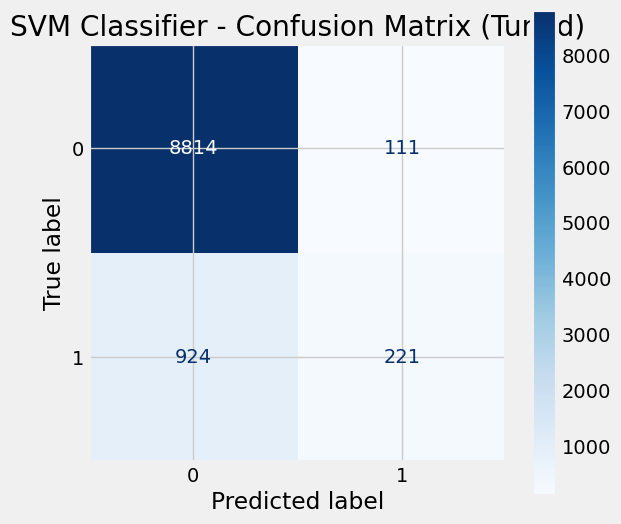

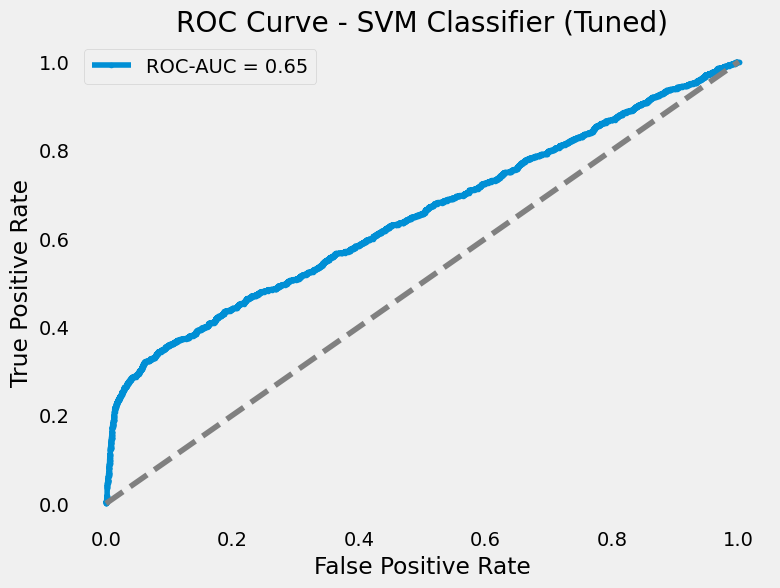

Best Hyperparameters: {'classifier__C': 0.1, 'classifier__gamma': 'scale', 'classifier__kernel': 'linear'}
Training Accuracy: 0.8958
Test Accuracy: 0.8972
Precision: 0.6657
Recall: 0.1930
F1 Score: 0.2993
ROC-AUC Score: 0.6480
Training Time: 868.32 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.899213,0.897915,0.664789,0.206114,0.314667,31.668682,0.764328,"{'classifier__C': 10, 'classifier__penalty': '..."


In [782]:
# Define SVM pipeline
pipeline_svm = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', SVC(probability=True, random_state=42))
])

# Define hyperparameter grid for tuning
param_grid = {
    "classifier__C": [0.1, 1],
    "classifier__kernel": ["linear", "rbf"],
    "classifier__gamma": ["scale"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search_svm = GridSearchCV(pipeline_svm, param_grid, cv=5, scoring="recall", n_jobs=-1, verbose=1)
grid_search_svm.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline_svm = grid_search_svm.best_estimator_
best_params_svm = grid_search_svm.best_params_

# Evaluate the best SVM model
y_pred_best_svm = best_pipeline_svm.predict(X_test)
y_pred_proba_best_svm = best_pipeline_svm.predict_proba(X_test)[:, 1]

# Compute performance metrics
train_acc_svm = best_pipeline_svm.score(X_train, y_train)
test_acc_svm = best_pipeline_svm.score(X_test, y_test)
precision_svm = precision_score(y_test, y_pred_best_svm, zero_division=0)
recall_svm = recall_score(y_test, y_pred_best_svm, zero_division=0)
f1_svm = f1_score(y_test, y_pred_best_svm, zero_division=0)
roc_auc_best_svm = roc_auc_score(y_test, y_pred_proba_best_svm)

# Classification report
print("\nClassification Report (SVM - Tuned):\n")
print(classification_report(y_test, y_pred_best_svm))

# Confusion matrix
cm_best_svm = confusion_matrix(y_test, y_pred_best_svm)
disp_best_svm = ConfusionMatrixDisplay(confusion_matrix=cm_best_svm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("SVM Classifier - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best_svm, tpr_best_svm, _ = roc_curve(y_test, y_pred_proba_best_svm)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best_svm, tpr_best_svm, marker='.', label=f"ROC-AUC = {roc_auc_best_svm:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM Classifier (Tuned)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params_svm}")
print(f"Training Accuracy: {train_acc_svm:.4f}")
print(f"Test Accuracy: {test_acc_svm:.4f}")
print(f"Precision: {precision_svm:.4f}")
print(f"Recall: {recall_svm:.4f}")
print(f"F1 Score: {f1_svm:.4f}")
print(f"ROC-AUC Score: {roc_auc_best_svm:.4f}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'SVM Fine Tuned',
    train_acc_svm,
    test_acc_svm,
    precision_svm,
    recall_svm,
    f1_svm,
    fit_time,
    roc_auc_best_svm,
    best_params_svm
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### SVM - Hyperparamter tuning and SelectKBest

Fitting 5 folds for each of 4 candidates, totalling 20 fits

Classification Report (SVM - Tuned):

              precision    recall  f1-score   support

           0       0.90      0.99      0.94      8925
           1       0.65      0.19      0.30      1145

    accuracy                           0.90     10070
   macro avg       0.78      0.59      0.62     10070
weighted avg       0.88      0.90      0.87     10070



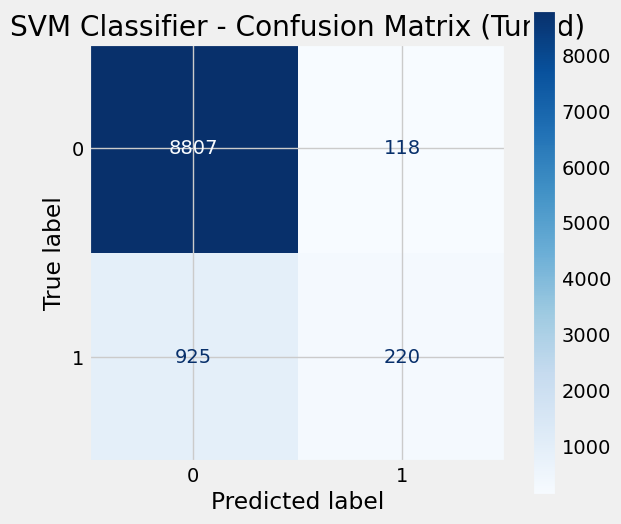

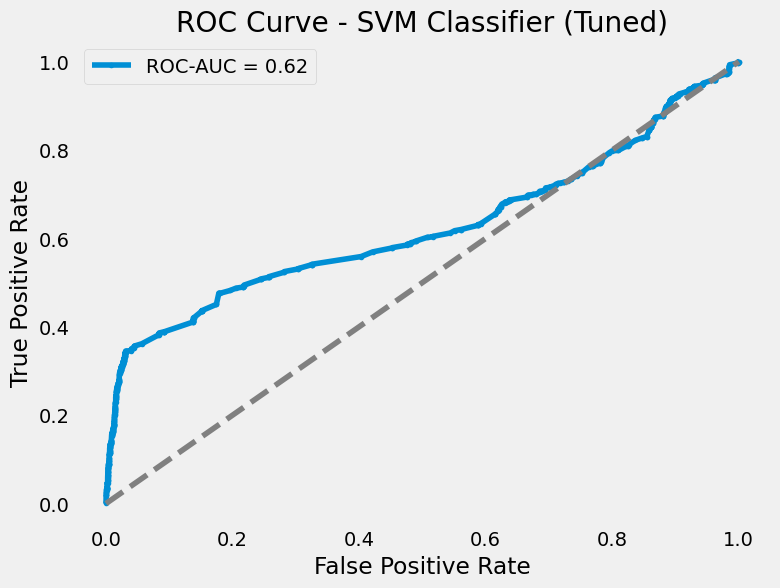

Best Hyperparameters: {'classifier__C': 1, 'classifier__gamma': 'scale', 'classifier__kernel': 'rbf'}
Training Accuracy: 0.8999
Test Accuracy: 0.8964
Precision: 0.6509
Recall: 0.1921
F1 Score: 0.2967
ROC-AUC Score: 0.6241
Training Time: 478.30 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.899213,0.897915,0.664789,0.206114,0.314667,31.668682,0.764328,"{'classifier__C': 10, 'classifier__penalty': '..."


In [788]:
# Define SVM pipeline
pipeline_svm = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=10)),
    ('classifier', SVC(probability=True, random_state=42))
])

# Define hyperparameter grid for tuning
param_grid = {
    "classifier__C": [0.1, 1],
    "classifier__kernel": ["linear", "rbf"],
    "classifier__gamma": ["scale"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search_svm = GridSearchCV(pipeline_svm, param_grid, cv=5, scoring="recall", n_jobs=-1, verbose=1)
grid_search_svm.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline_svm = grid_search_svm.best_estimator_
best_params_svm = grid_search_svm.best_params_

# Evaluate the best SVM model
y_pred_best_svm = best_pipeline_svm.predict(X_test)
y_pred_proba_best_svm = best_pipeline_svm.predict_proba(X_test)[:, 1]

# Compute performance metrics
train_acc_svm = best_pipeline_svm.score(X_train, y_train)
test_acc_svm = best_pipeline_svm.score(X_test, y_test)
precision_svm = precision_score(y_test, y_pred_best_svm, zero_division=0)
recall_svm = recall_score(y_test, y_pred_best_svm, zero_division=0)
f1_svm = f1_score(y_test, y_pred_best_svm, zero_division=0)
roc_auc_best_svm = roc_auc_score(y_test, y_pred_proba_best_svm)

# Classification report
print("\nClassification Report (SVM - Tuned):\n")
print(classification_report(y_test, y_pred_best_svm))

# Confusion matrix
cm_best_svm = confusion_matrix(y_test, y_pred_best_svm)
disp_best_svm = ConfusionMatrixDisplay(confusion_matrix=cm_best_svm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("SVM Classifier - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best_svm, tpr_best_svm, _ = roc_curve(y_test, y_pred_proba_best_svm)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best_svm, tpr_best_svm, marker='.', label=f"ROC-AUC = {roc_auc_best_svm:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM Classifier (Tuned)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params_svm}")
print(f"Training Accuracy: {train_acc_svm:.4f}")
print(f"Test Accuracy: {test_acc_svm:.4f}")
print(f"Precision: {precision_svm:.4f}")
print(f"Recall: {recall_svm:.4f}")
print(f"F1 Score: {f1_svm:.4f}")
print(f"ROC-AUC Score: {roc_auc_best_svm:.4f}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'SVM Fine Tuned - SelectKBest',
    train_acc_svm,
    test_acc_svm,
    precision_svm,
    recall_svm,
    f1_svm,
    fit_time,
    roc_auc_best_svm,
    best_params_svm
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### SVM - Hyperparamter tuning and SelectKBest, class_weight='balanced'

Fitting 5 folds for each of 4 candidates, totalling 20 fits

Classification Report (SVM - Tuned):

              precision    recall  f1-score   support

           0       0.95      0.71      0.81      8925
           1       0.24      0.69      0.35      1145

    accuracy                           0.71     10070
   macro avg       0.59      0.70      0.58     10070
weighted avg       0.87      0.71      0.76     10070



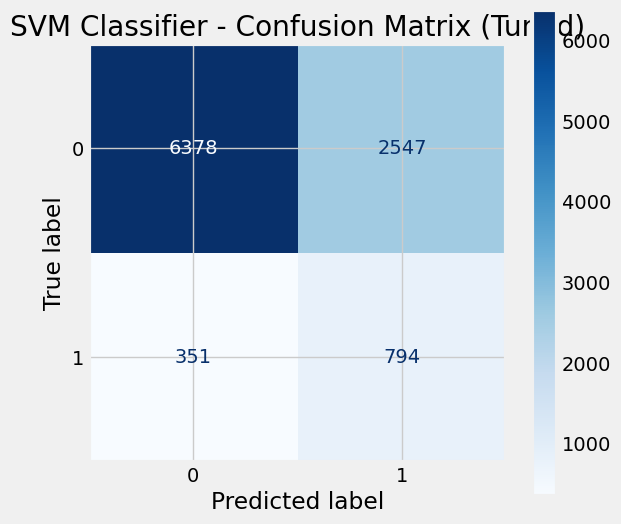

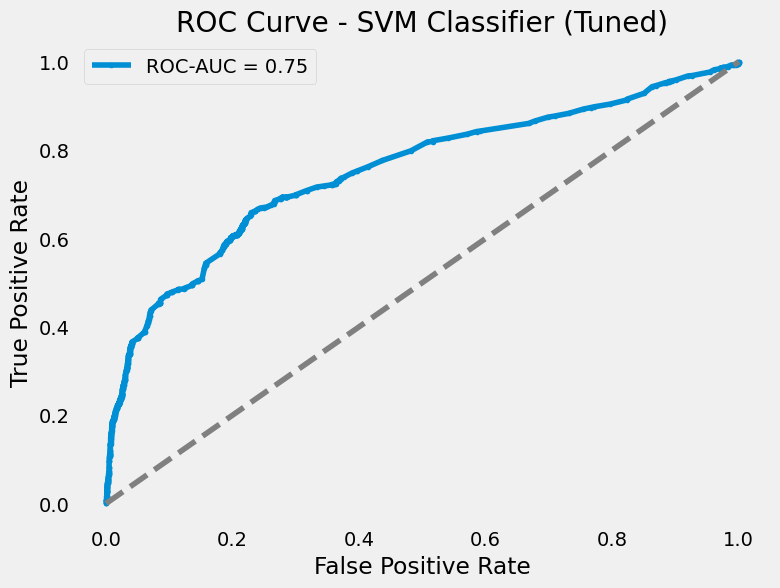

Best Hyperparameters: {'classifier__C': 0.1, 'classifier__gamma': 'scale', 'classifier__kernel': 'linear'}
Training Accuracy: 0.7134
Test Accuracy: 0.7122
Precision: 0.2377
Recall: 0.6934
F1 Score: 0.3540
ROC-AUC Score: 0.7524
Training Time: 1671.01 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.899213,0.897915,0.664789,0.206114,0.314667,31.668682,0.764328,"{'classifier__C': 10, 'classifier__penalty': '..."


In [792]:
# Define SVM pipeline
pipeline_svm = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=10)),
    ('classifier', SVC(probability=True, random_state=42,class_weight='balanced'))
])

# Define hyperparameter grid for tuning
param_grid = {
    "classifier__C": [0.1, 1],
    "classifier__kernel": ["linear", "rbf"],
    "classifier__gamma": ["scale"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search_svm = GridSearchCV(pipeline_svm, param_grid, cv=5, scoring="recall", n_jobs=-1, verbose=1)
grid_search_svm.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline_svm = grid_search_svm.best_estimator_
best_params_svm = grid_search_svm.best_params_

# Evaluate the best SVM model
y_pred_best_svm = best_pipeline_svm.predict(X_test)
y_pred_proba_best_svm = best_pipeline_svm.predict_proba(X_test)[:, 1]

# Compute performance metrics
train_acc_svm = best_pipeline_svm.score(X_train, y_train)
test_acc_svm = best_pipeline_svm.score(X_test, y_test)
precision_svm = precision_score(y_test, y_pred_best_svm, zero_division=0)
recall_svm = recall_score(y_test, y_pred_best_svm, zero_division=0)
f1_svm = f1_score(y_test, y_pred_best_svm, zero_division=0)
roc_auc_best_svm = roc_auc_score(y_test, y_pred_proba_best_svm)

# Classification report
print("\nClassification Report (SVM - Tuned):\n")
print(classification_report(y_test, y_pred_best_svm))

# Confusion matrix
cm_best_svm = confusion_matrix(y_test, y_pred_best_svm)
disp_best_svm = ConfusionMatrixDisplay(confusion_matrix=cm_best_svm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("SVM Classifier - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best_svm, tpr_best_svm, _ = roc_curve(y_test, y_pred_proba_best_svm)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best_svm, tpr_best_svm, marker='.', label=f"ROC-AUC = {roc_auc_best_svm:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM Classifier (Tuned)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params_svm}")
print(f"Training Accuracy: {train_acc_svm:.4f}")
print(f"Test Accuracy: {test_acc_svm:.4f}")
print(f"Precision: {precision_svm:.4f}")
print(f"Recall: {recall_svm:.4f}")
print(f"F1 Score: {f1_svm:.4f}")
print(f"ROC-AUC Score: {roc_auc_best_svm:.4f}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'SVM Fine Tuned - SelectKBest,class_weight="balanced"',
    train_acc_svm,
    test_acc_svm,
    precision_svm,
    recall_svm,
    f1_svm,
    fit_time,
    roc_auc_best_svm,
    best_params_svm
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df

### SVM with best_params and MinMaxScaler

Fitting 5 folds for each of 4 candidates, totalling 20 fits

Classification Report (SVM - Tuned):

              precision    recall  f1-score   support

           0       0.95      0.71      0.81      8925
           1       0.24      0.69      0.35      1145

    accuracy                           0.71     10070
   macro avg       0.59      0.70      0.58     10070
weighted avg       0.87      0.71      0.76     10070



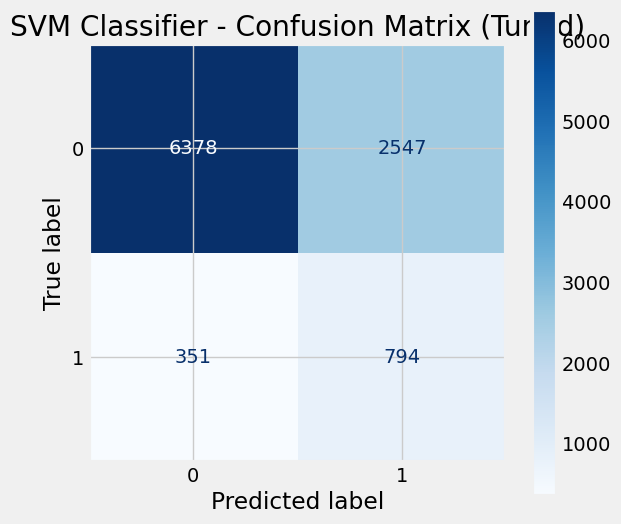

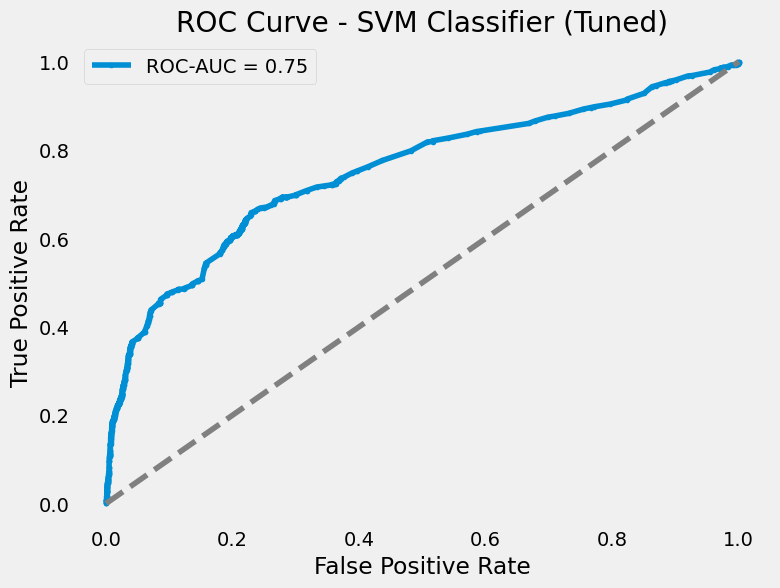

Best Hyperparameters: {'classifier__C': 0.1, 'classifier__gamma': 'scale', 'classifier__kernel': 'linear'}
Training Accuracy: 0.7134
Test Accuracy: 0.7122
Precision: 0.2377
Recall: 0.6934
F1 Score: 0.3540
ROC-AUC Score: 0.7524
Training Time: 1569.27 seconds

Results DataFrame:


,model,train accuracy,test accuracy,precision,recall,F1 score,train time (s),ROC-AUC,Best Params
0,Baseline model,0.887338,0.886296,0.000000,0.000000,0.000000,0.003010,0.500000,-
1,Simple Logistic Regression Classifier,0.898957,0.898113,0.668555,0.206114,0.315087,0.308464,0.764425,-
2,Simple KNN Classifier,0.910832,0.889871,0.534749,0.241921,0.333133,0.137416,0.694290,-
3,Simple Decision Tree Classifier,0.994850,0.827110,0.281204,0.334498,0.305544,0.536856,0.614555,-
4,Simple SVM Classifier,0.903213,0.900099,0.669927,0.239301,0.352638,269.461295,0.680450,-
5,KNN Fine Tuned,0.994850,0.874081,0.411255,0.248908,0.310120,89.061924,0.690788,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."
6,KNN Fine Tuned - SelectKBest,0.897893,0.882125,0.473008,0.321397,0.382735,86.582349,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
7,KNN Fine Tuned - SelectKBest - Best Threshold,0.897893,0.882125,0.473008,0.321397,0.382735,95.281550,0.688721,"{'feature_selection__k': 10, 'knn__metric': 'e..."
8,"KNN Fine Tuned - SelectKBest,Best Threshold,Mi...",0.904916,0.886197,0.499456,0.400873,0.444767,88.982145,0.726872,"{'feature_selection__k': 10, 'knn__metric': 'm..."
9,Logistic Regression Classifier Fine Tuned,0.899213,0.897915,0.664789,0.206114,0.314667,31.668682,0.764328,"{'classifier__C': 10, 'classifier__penalty': '..."


In [795]:
# Define transformers for preprocessing using MinMaxScaler
numerical_transformer = Pipeline(steps=[
    ('imputer', numerical_imputer),
    ('scaler', MinMaxScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', categorical_imputer),
    ('encoder', OneHotEncoder(handle_unknown="ignore"))
])

# Combine transformations
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

# Define SVM pipeline
pipeline_svm = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=10)),
    ('classifier', SVC(probability=True, random_state=42,class_weight='balanced'))
])

# Define hyperparameter grid for tuning
param_grid = {
    "classifier__C": [0.1, 1],
    "classifier__kernel": ["linear", "rbf"],
    "classifier__gamma": ["scale"]
}

# Perform Grid Search with cross-validation
start_time = time.time()
grid_search_svm = GridSearchCV(pipeline_svm, param_grid, cv=5, scoring="recall", n_jobs=-1, verbose=1)
grid_search_svm.fit(X_train, y_train)
fit_time = time.time() - start_time

# Best estimator and parameters
best_pipeline_svm = grid_search_svm.best_estimator_
best_params_svm = grid_search_svm.best_params_

# Evaluate the best SVM model
y_pred_best_svm = best_pipeline_svm.predict(X_test)
y_pred_proba_best_svm = best_pipeline_svm.predict_proba(X_test)[:, 1]

# Compute performance metrics
train_acc_svm = best_pipeline_svm.score(X_train, y_train)
test_acc_svm = best_pipeline_svm.score(X_test, y_test)
precision_svm = precision_score(y_test, y_pred_best_svm, zero_division=0)
recall_svm = recall_score(y_test, y_pred_best_svm, zero_division=0)
f1_svm = f1_score(y_test, y_pred_best_svm, zero_division=0)
roc_auc_best_svm = roc_auc_score(y_test, y_pred_proba_best_svm)

# Classification report
print("\nClassification Report (SVM - Tuned):\n")
print(classification_report(y_test, y_pred_best_svm))

# Confusion matrix
cm_best_svm = confusion_matrix(y_test, y_pred_best_svm)
disp_best_svm = ConfusionMatrixDisplay(confusion_matrix=cm_best_svm, display_labels=[0, 1])
fig, ax = plt.subplots(figsize=(6, 6))
disp_best_svm.plot(cmap="Blues", ax=ax, colorbar=True)
plt.title("SVM Classifier - Confusion Matrix (Tuned)")
plt.show()

# ROC Curve
fpr_best_svm, tpr_best_svm, _ = roc_curve(y_test, y_pred_proba_best_svm)
plt.figure(figsize=(8, 6))
plt.plot(fpr_best_svm, tpr_best_svm, marker='.', label=f"ROC-AUC = {roc_auc_best_svm:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM Classifier (Tuned)")
plt.legend()
plt.grid()
plt.show()

# Final output
print(f"Best Hyperparameters: {best_params_svm}")
print(f"Training Accuracy: {train_acc_svm:.4f}")
print(f"Test Accuracy: {test_acc_svm:.4f}")
print(f"Precision: {precision_svm:.4f}")
print(f"Recall: {recall_svm:.4f}")
print(f"F1 Score: {f1_svm:.4f}")
print(f"ROC-AUC Score: {roc_auc_best_svm:.4f}")
print(f"Training Time: {fit_time:.2f} seconds")

# Create or update results DataFrame with all scores
try:
    results_df
except NameError:
    results_df = pd.DataFrame(columns=[
        'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
    ])

current_results = pd.DataFrame([[
    'SVM Fine Tuned - SelectKBest,class_weight="balanced",MinMaxScaler',
    train_acc_svm,
    test_acc_svm,
    precision_svm,
    recall_svm,
    f1_svm,
    fit_time,
    roc_auc_best_svm,
    best_params_svm
]], columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall', 'F1 score', 'train time (s)', 'ROC-AUC', 'Best Params'
])

results_df = pd.concat([results_df, current_results], ignore_index=True)

# Display the results DataFrame
print("\nResults DataFrame:")
results_df


--- Coefficients for Linear SVM ---
Intercept: 1.1159

Feature Coefficients:
num__emp_var_rate: 0.0664
num__cons_price_idx: 0.1339
num__euribor3m: -2.3823
num__nr_employed: -0.1749
num__previously_contacted: -0.2062
num__pdays_contacted: 0.2398
cat__contact_cellular: 0.0467
cat__contact_telephone: -0.0467
cat__poutcome_nonexistent: 0.2062
cat__poutcome_success: 0.2094


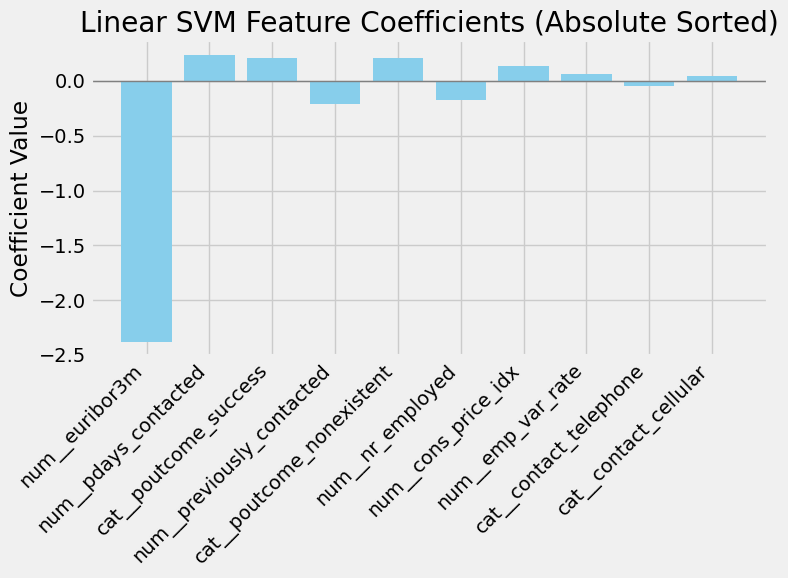

In [797]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Extract the best pipeline from your grid search
best_pipeline_svm = grid_search_svm.best_estimator_
best_params_svm = grid_search_svm.best_params_

# 2. Check if the best kernel is linear
if best_params_svm['classifier__kernel'] == 'linear':
    print("\n--- Coefficients for Linear SVM ---")

    # Separate the pipeline steps
    preprocessor = best_pipeline_svm.named_steps['preprocessor']
    feature_selector = best_pipeline_svm.named_steps['feature_selection']
    svm_classifier = best_pipeline_svm.named_steps['classifier']

    # 3. Retrieve the SVM coefficients (binary classification => shape is (1, n_features_selected))
    coefs = svm_classifier.coef_[0]
    intercept = svm_classifier.intercept_[0]

    # 4. Get all feature names after preprocessing
    #    (Requires scikit-learn 1.0+ and that your 'preprocessor' supports get_feature_names_out)
    all_feature_names = preprocessor.get_feature_names_out()

    # 5. Determine which features were selected by SelectKBest
    selected_indices = feature_selector.get_support(indices=True)
    selected_feature_names = all_feature_names[selected_indices]

    # 6. Print intercept and feature coefficients
    print(f"Intercept: {intercept:.4f}\n")
    print("Feature Coefficients:")
    for name, coef_val in zip(selected_feature_names, coefs):
        print(f"{name}: {coef_val:.4f}")

    # 7. Plot the coefficients in a bar chart, sorted by absolute value
    sorted_idx = np.argsort(np.abs(coefs))[::-1]
    sorted_feature_names = selected_feature_names[sorted_idx]
    sorted_coefs = coefs[sorted_idx]

    plt.figure(figsize=(8, 6))
    bars = plt.bar(sorted_feature_names, sorted_coefs, color='skyblue')
    plt.axhline(y=0, color='gray', linewidth=1)
    plt.xticks(rotation=45, ha='right')
    plt.title("Linear SVM Feature Coefficients (Absolute Sorted)")
    plt.ylabel("Coefficient Value")
    plt.tight_layout()
    plt.show()

else:
    print("\n--- The best kernel is not linear. No direct coefficients to plot. ---")
    print("Consider using permutation importance or model-agnostic methods (e.g., SHAP).")


In [799]:
# Set the option to display full column text
pd.set_option('display.max_colwidth', None)

# Now, when you display your DataFrame, column data won't be truncated
print(results_df)

                                                                                           model  \
0                                                                                 Baseline model   
1                                                          Simple Logistic Regression Classifier   
2                                                                          Simple KNN Classifier   
3                                                                Simple Decision Tree Classifier   
4                                                                          Simple SVM Classifier   
5                                                                                 KNN Fine Tuned   
6                                                                   KNN Fine Tuned - SelectKBest   
7                                                  KNN Fine Tuned - SelectKBest - Best Threshold   
8                                       KNN Fine Tuned - SelectKBest,Best Threshold,MinMaxScaler   


## Model comparisons with Best params, SelectKBest, class_weight="balanced", Threshold=0.20(KNN)

In [801]:
# -------------------------------------------------------
# 1. Define your four pipelines with new best hyperparams
# -------------------------------------------------------

# KNN (manual threshold=0.20)
pipeline_knn = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=10)),
    # Optionally add MinMaxScaler if you want to replicate "MinMaxScaler" from your best param config
    ('scaler', MinMaxScaler()),
    ('knn', KNeighborsClassifier(
        n_neighbors=5,
        metric='manhattan',
        weights='uniform'
    ))
])

# Logistic Regression (class_weight='balanced')
pipeline_lr = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=5)),
    ('classifier', LogisticRegression(
        C=0.01,
        penalty='l1',
        solver='liblinear',
        class_weight='balanced',
        random_state=42
    ))
])

# Decision Tree (class_weight='balanced')
pipeline_dt = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=10)),
    ('classifier', DecisionTreeClassifier(
        criterion='entropy',
        max_depth=5,
        min_samples_leaf=5,
        min_samples_split=2,
        class_weight='balanced',
        random_state=42
    ))
])

# SVM (class_weight='balanced')
pipeline_svm = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectKBest(score_func=f_classif, k=10)),
    ('classifier', SVC(
        C=0.1,
        gamma='scale',
        kernel='linear',
        probability=True,
        class_weight='balanced',
        random_state=42
    ))
])

# -------------------------------------------------------
# 2. Prepare a dictionary of pipelines to loop over
# -------------------------------------------------------
models = {
    'KNN': pipeline_knn,
    'LogisticRegression': pipeline_lr,
    'DecisionTree': pipeline_dt,
    'SVM': pipeline_svm
}

results_list = []

# -------------------------------------------------------
# 3. Train each pipeline on the entire training set
#    and evaluate on the test set
# -------------------------------------------------------
for model_name, pipeline in models.items():
    print(f"\n=== {model_name}: START training... ===")
    start_time = time.time()
    
    # Fit on full training set
    pipeline.fit(X_train, y_train)
    train_time = time.time() - start_time
    print(f"=== {model_name}: END training. Elapsed time: {train_time:.2f} seconds ===")
    
    if model_name == 'KNN':
        # Probability predictions for train/test
        y_proba_train = pipeline.predict_proba(X_train)[:, 1]
        y_proba_test = pipeline.predict_proba(X_test)[:, 1]
        
        # Convert to class predictions using threshold=0.20
        threshold = 0.20
        y_pred_train = (y_proba_train >= threshold).astype(int)
        y_pred_test = (y_proba_test >= threshold).astype(int)
        
    else:
        # Use normal .predict() for other models
        y_pred_train = pipeline.predict(X_train)
        y_pred_test = pipeline.predict(X_test)
        
        # We still need probabilities to compute ROC-AUC if available
        if hasattr(pipeline, "predict_proba"):
            y_proba_test = pipeline.predict_proba(X_test)[:, 1]
        else:
            y_proba_test = None
    
    # Compute train/test accuracy
    train_acc = accuracy_score(y_train, y_pred_train)
    test_acc = accuracy_score(y_test, y_pred_test)
    
    # Compute precision, recall, F1 on the test set
    precision = precision_score(y_test, y_pred_test, zero_division=0)
    recall = recall_score(y_test, y_pred_test, zero_division=0)
    f1 = f1_score(y_test, y_pred_test, zero_division=0)
    
    # Compute ROC-AUC on the test set if we have probabilities
    if model_name == 'KNN':
        roc_auc = roc_auc_score(y_test, y_proba_test)
    else:
        roc_auc = roc_auc_score(y_test, y_proba_test) if y_proba_test is not None else None
    
    # Store results
    results_list.append({
        'model': model_name,
        'train accuracy': train_acc,
        'test accuracy': test_acc,
        'precision': precision,
        'recall': recall,
        'F1 score': f1,
        'train time (s)': train_time,
        'ROC-AUC': roc_auc
    })

# -------------------------------------------------------
# 4. Convert results to DataFrame and display
# -------------------------------------------------------
combined_results_df = pd.DataFrame(results_list, columns=[
    'model', 'train accuracy', 'test accuracy', 'precision', 'recall',
    'F1 score', 'train time (s)', 'ROC-AUC'
])

print("\n=== Model Comparison (Detailed) ===")
print(combined_results_df)

# (Optional) Sort by test accuracy or recall, etc.
combined_results_df.sort_values(by='test accuracy', ascending=False, inplace=True)
print("\n=== Sorted by Test Accuracy ===")
print(combined_results_df)


=== KNN: START training... ===
=== KNN: END training. Elapsed time: 0.23 seconds ===

=== LogisticRegression: START training... ===
=== LogisticRegression: END training. Elapsed time: 0.28 seconds ===

=== DecisionTree: START training... ===
=== DecisionTree: END training. Elapsed time: 0.15 seconds ===

=== SVM: START training... ===
=== SVM: END training. Elapsed time: 192.64 seconds ===

=== Model Comparison (Detailed) ===
                model  train accuracy  test accuracy  precision    recall  \
0                 KNN        0.692488       0.676564   0.211790  0.677729   
1  LogisticRegression        0.712492       0.711619   0.237384  0.694323   
2        DecisionTree        0.798383       0.798411   0.312102  0.641921   
3                 SVM        0.713428       0.712214   0.237653  0.693450   

   F1 score  train time (s)   ROC-AUC  
0  0.322728        0.229233  0.726872  
1  0.353805        0.279503  0.742113  
2  0.420000        0.146807  0.776653  
3  0.353990      192.63

## Undersampling

In [807]:
# -------------------------------
# KNN Pipeline + UnderSampler
# -------------------------------
knn_pipe = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('undersample', RandomUnderSampler(random_state=42)),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ('knn', KNeighborsClassifier())
])

# Example parameter grid for KNN
# Adjust these based on your best-known hyperparams or a broader search
param_grid_knn = {
    'feature_selection__k': [5, 10],
    'knn__n_neighbors': [3, 5],
    'knn__metric': ['manhattan', 'euclidean'],
    'knn__weights': ['uniform', 'distance']
}

# -------------------------------
# Logistic Regression + UnderSampler
# -------------------------------
lr_pipe = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('undersample', RandomUnderSampler(random_state=42)),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ('classifier', LogisticRegression(class_weight='balanced', random_state=42))
])

param_grid_lr = {
    'feature_selection__k': [5, 10],
    'classifier__C': [0.01, 0.1, 1],
    'classifier__penalty': ['l1', 'l2'],
    'classifier__solver': ['liblinear']  # 'liblinear' supports L1 or L2
}

# -------------------------------
# Decision Tree + UnderSampler
# -------------------------------
dt_pipe = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('undersample', RandomUnderSampler(random_state=42)),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ('classifier', DecisionTreeClassifier(class_weight='balanced', random_state=42))
])

param_grid_dt = {
    'feature_selection__k': [5, 10],
    'classifier__criterion': ['entropy', 'gini'],
    'classifier__max_depth': [5, 10],
    'classifier__min_samples_leaf': [2, 5],
    'classifier__min_samples_split': [2, 10]
}

# -------------------------------
# SVM + UnderSampler
# -------------------------------
svm_pipe = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('undersample', RandomUnderSampler(random_state=42)),
    ('feature_selection', SelectKBest(score_func=f_classif)),
    ('classifier', SVC(probability=True, class_weight='balanced', random_state=42))
])

param_grid_svm = {
    'feature_selection__k': [5, 10],
    'classifier__C': [0.1, 1],
    'classifier__gamma': ['scale', 'auto'],
    'classifier__kernel': ['linear', 'rbf']
}

In [809]:
def train_and_evaluate_model(model_name, pipeline, param_grid, X_train, y_train, X_test, y_test, custom_threshold=None):
    """
    - model_name: string identifier
    - pipeline: ImbPipeline
    - param_grid: dict of params for GridSearchCV
    - X_train, y_train, X_test, y_test: dataset splits
    - custom_threshold: if set, apply to predicted probabilities (e.g., KNN)
    """
    print(f"\n=== {model_name}: START GridSearchCV... ===")
    start_time = time.time()
    
    # We use StratifiedKFold to preserve class distribution
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    
    # Example: use 'recall' or 'f1' or 'precision' depending on your objective
    grid_search = GridSearchCV(
        estimator=pipeline,
        param_grid=param_grid,
        scoring='recall',  # or 'f1' / 'precision' / 'balanced_accuracy'
        cv=cv,
        n_jobs=-1,
        verbose=1
    )
    
    # Fit the grid search on the original training data
    grid_search.fit(X_train, y_train)
    train_time = time.time() - start_time
    print(f"=== {model_name}: END GridSearchCV. Elapsed time: {train_time:.2f} seconds ===")
    
    # Best estimator after hyperparameter tuning
    best_model = grid_search.best_estimator_
    print(f"Best Params for {model_name}: {grid_search.best_params_}")
    
    # Evaluate on test set
    if custom_threshold:
        # Predict probabilities, then apply custom threshold
        y_proba_test = best_model.predict_proba(X_test)[:, 1]
        y_pred_test = (y_proba_test >= custom_threshold).astype(int)
    else:
        y_pred_test = best_model.predict(X_test)
        # If we need probabilities (for ROC-AUC):
        if hasattr(best_model, 'predict_proba'):
            y_proba_test = best_model.predict_proba(X_test)[:, 1]
        else:
            y_proba_test = None
    
    # Compute metrics on test set
    test_acc = accuracy_score(y_test, y_pred_test)
    precision = precision_score(y_test, y_pred_test, zero_division=0)
    recall = recall_score(y_test, y_pred_test, zero_division=0)
    f1 = f1_score(y_test, y_pred_test, zero_division=0)
    roc_auc = roc_auc_score(y_test, y_proba_test) if y_proba_test is not None else None
    
    # Return a dict of results
    return {
        'model': model_name,
        'best params': grid_search.best_params_,
        'train time (s)': train_time,
        'test accuracy': test_acc,
        'precision': precision,
        'recall': recall,
        'F1 score': f1,
        'ROC-AUC': roc_auc
    }

In [811]:
results = []

# KNN with custom threshold, e.g. 0.20 or 0.35
knn_result = train_and_evaluate_model(
    model_name="KNN",
    pipeline=knn_pipe,
    param_grid=param_grid_knn,
    X_train=X_train, y_train=y_train,
    X_test=X_test, y_test=y_test,
    custom_threshold=0.20  # or 0.35, whichever you prefer
)
results.append(knn_result)

# Logistic Regression
lr_result = train_and_evaluate_model(
    model_name="LogisticRegression",
    pipeline=lr_pipe,
    param_grid=param_grid_lr,
    X_train=X_train, y_train=y_train,
    X_test=X_test, y_test=y_test,
    custom_threshold=None  # no custom threshold needed
)
results.append(lr_result)

# Decision Tree
dt_result = train_and_evaluate_model(
    model_name="DecisionTree",
    pipeline=dt_pipe,
    param_grid=param_grid_dt,
    X_train=X_train, y_train=y_train,
    X_test=X_test, y_test=y_test
)
results.append(dt_result)

# SVM
svm_result = train_and_evaluate_model(
    model_name="SVM",
    pipeline=svm_pipe,
    param_grid=param_grid_svm,
    X_train=X_train, y_train=y_train,
    X_test=X_test, y_test=y_test
)
results.append(svm_result)

# Convert to DataFrame for easy viewing
df_us_results = pd.DataFrame(results)
print("\n=== Final Results After GridSearchCV (Undersampled Data) ===")
print(df_us_results)


=== KNN: START GridSearchCV... ===
Fitting 5 folds for each of 16 candidates, totalling 80 fits
=== KNN: END GridSearchCV. Elapsed time: 20.30 seconds ===
Best Params for KNN: {'feature_selection__k': 10, 'knn__metric': 'manhattan', 'knn__n_neighbors': 5, 'knn__weights': 'uniform'}

=== LogisticRegression: START GridSearchCV... ===
Fitting 5 folds for each of 12 candidates, totalling 60 fits
=== LogisticRegression: END GridSearchCV. Elapsed time: 4.57 seconds ===
Best Params for LogisticRegression: {'classifier__C': 0.01, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'feature_selection__k': 5}

=== DecisionTree: START GridSearchCV... ===
Fitting 5 folds for each of 32 candidates, totalling 160 fits
=== DecisionTree: END GridSearchCV. Elapsed time: 9.59 seconds ===
Best Params for DecisionTree: {'classifier__criterion': 'entropy', 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'feature_selection__k': 5}

=== SVM: STA

##### Questions